### Open Food Facts
#### The purpose of this project is to increase the data availability of foods around the world on the Open Foodfacts database. 
#### Process to uncover findings with existing data on Open Food facts
##### 1) Exploring data/data cleaning
- Identify null values
- Identify rows with no nutrients ending with _100g suffix
- Treat negative numerical values in nutrients columns ending with _100g suffix
- Replace nulls with zeros and N/A
- Remove columns that does not contain any data
- Similar columns with ending with _tags and _fr
- removal of products > 100g for all nutrients columns except columns concerning energy in KJ or J.
- Remove Outliers
- Linear, Boxplot, Scatter Plots

#### Numerical analysis
##### 2) Investigate numerical data to find correlations with recommending the company
- Normalise discrete variables
- Selection of features to include to form PCA components
- PCA
- ANOVA

#### Import Python libraries for this analysis workbook

In [1]:
# Import pandas, numpy, plotting, widgets libraries to process and visualize data
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import ipywidgets as widgets
from IPython.display import display, clear_output

pd.options.mode.chained_assignment = None
# change pandas setting to increase table visibility and to show more data
pd.set_option('display.max_rows',1000)
pd.set_option('display.max.columns', 170)
pd.set_option('display.width',1000)

##### Read and review the dataset from Openfood facts and create a Dataframe

In [2]:
# Import csv data set into Jupyter, separate columns by " tab" and set memory usage.
rawdata = pd.read_csv(r"E:\products.csv", sep="\t", low_memory=False)

In [3]:
#Review the actual data set. Evidently, there are both numerical and text type data and many nulls in each column.
rawdata.tail()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,no_nutriments,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_uk,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
320767,9948282780603,http://world-fr.openfoodfacts.org/produit/9948...,openfoodfacts-contributors,1490631299,2017-03-27T16:14:59Z,1491244498,2017-04-03T18:34:58Z,Tomato & ricotta,NaN,1,Plastique,plastique,Panzani,panzani,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:RO,en:romania,Roumanie,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320768,99567453,http://world-fr.openfoodfacts.org/produit/9956...,usda-ndb-import,1489059076,2017-03-09T11:31:16Z,1491244499,2017-04-03T18:34:59Z,"Mint Melange Tea A Blend Of Peppermint, Lemon ...",NaN,NaN,Plastique,plastique,Trader Joe's,trader-joe-s,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,États-Unis,"Organic peppermint, organic lemon grass, organ...",NaN,NaN,NaN,NaN

<br>
At a glance, there are significant number of missing values in both the text and numerical columns. Open food fact database is build on the users's individual entry of food items. This dataset concerns the details of each food entries, such as the entry time, the username, product barcode, url of the image, manufacturing place, places of goods sold, nutrition grades and the amount of specific nutrients contributing to the Nutrition Scores. This dataset will be the basis of our food data analysis.

In [4]:
# Review the summary of the data ranges, identify NaN, min, max values for each column.
rawdata.describe(include = 'all')

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,no_nutriments,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_uk,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
count,320749,320749,320770,320769,320763,320772,320772,303010,52795,104819,78960,78961,292360,292352,84410,84389,84411,22190,22153,36501,36495,46559,46644,46666,29306,29303,18803,23,20320,58193,51722,320492,320492,320492,248962,28344,19,24353,24329,24352,211331,0.0,248939.000000,248905,154680,154680,248939.000000,0.0,4835,248939.000000,0.0,11696,0.0,221210,91513,94491,320726,320726,320726,84366,84366,75836,75836,2.611130e+05,857.000000,243891.000000,229554.000000,0.0,0.0,1.0,2.000000,4.000000,1.0,1.0,1.0,24.000000,23.000000,0.0,0.0,1.0,0.0,22823.000000,22859.000000,841.000000,186.000000,38.000000,78.000000,188.000000,149.000000,8.000000,24.000000,23.000000,21.000000,13.000000,0.0,1.400000e+01,0.0,0.0,0.0,143298.000000,144090.000000,243588.000000,244971.000000,72.000000,26.000000,38.000000,262.000000,4.000000,11.000000,266.000000,414.000000,200886.000000,259922.000000,27.000000,16.000000,9.000000,255510.000000,255463.000000,4133.000000,137554.000000,34.000000,7057.000000,1340.000000,918.000000,140867.000000,11154.000000,10815.000000,11729.000000,6784.000000,5240.000000,3042.000000,5.300000e+03,330.000000,2483.000000,38.000000,81.000000,24748.000000,158.000000,141050.000000,5845.000000,140462.000000,6253.000000,3929.000000,2106.000000,1620.000000,79.000000,1168.000000,20.000000,11.000000,259.000000,78.000000,29.000000,49.000000,3036.000000,165.000000,948.000000,0.0,268

In [5]:
# Check for the size of the entire data set
# display number of columns in the data set
rawdata.shape
print("The dataset contains "+str(len(rawdata.columns))+" columns and "+ str(len(rawdata.index))+" rows ")

The dataset contains 162 columns and 320772 rows 


Let's create a dataframe to ease data cleansing and preserve the originality of the dataset for reference.

In [6]:
df = pd.DataFrame(rawdata)

1. Check the Data Profiling and Quality. Identify Nulls and missing values

In [7]:
df.isna().sum().sort_values(ascending = False).head(20)

water-hardness_100g                      320772
no_nutriments                            320772
ingredients_that_may_be_from_palm_oil    320772
nutrition_grade_uk                       320772
nervonic-acid_100g                       320772
erucic-acid_100g                         320772
mead-acid_100g                           320772
elaidic-acid_100g                        320772
butyric-acid_100g                        320772
caproic-acid_100g                        320772
ingredients_from_palm_oil                320772
lignoceric-acid_100g                     320772
cerotic-acid_100g                        320772
melissic-acid_100g                       320772
chlorophyl_100g                          320772
glycemic-index_100g                      320772
myristic-acid_100g                       320771
palmitic-acid_100g                       320771
caprylic-acid_100g                       320771
stearic-acid_100g                        320771
dtype: int64

<br>
The above lists the most to least number of nulls by column. There are 16 columns in the list with all nulls, therefore containing no data. To preserve the possibility of new entries in these null columns, these columns will not be dropped/ removed from the dataframe for now but will be treated at a later stage.

Let's view some of the product names

In [8]:
#Let's view the data based on product_name.
df['product_name'].tail(20)[:500]

320752                                                  NaN
320753                                                Lager
320754                                              nf test
320755                                                  NaN
320756                                          Test NF App
320757                                              Amandes
320758                                     Miel de Camargue
320759                                         Лимон — лайм
320760                                             Poireaux
320761                            Roussette du Bugey (2011)
320762                             Szprot w oleju roslinnym
320763                                   Thé vert Earl grey
320764                           Cheese cake thé vert, yuzu
320765                                       Rillette d'oie
320766                                                  NaN
320767                                    Tomato & ricotta 
320768    Mint Melange Tea A Blend Of Pe

We see some product names containing test that might be irrelevant or bogus. Let's find all of the names with 'test'.

In [9]:
df_prod_name = df.groupby(['product_name']).size().sort_values(ascending = False)
df_prod_name =pd.DataFrame(df_prod_name, columns =['count'])
df_prod_name
df_prod_name[df_prod_name.index.str.contains('Test')| df_prod_name.index.str.match('TestTest')|df_prod_name.index.str.contains('test')].tail(50)[:100]


,count
product_name,
Test,7
test,3
nf test,2
Test nf,2
Original Hottest Insanity Sauce,1
"Mo's World's Greatest Hummus, Hummus, Black Olive",1
Pierretest TestTestTestTestTestTTestTestTestTestTestTestTesttTestTestTestTestTestTestTestTestTestTestTestTestTestTesttTestTestTestTestTestTestTestTestTestTestTestTestTestTest,1
Test_edition,1
Test product,1


By inspection, some product names are found to be 'test'. Test entries should be excluded from the data set assuming these are test data entered by the creator which may skew the rest of the dataset. Next step is to check for rows containing the word 'tests' to drop.

List above indicates there are number of 'test' in the product names that are test data.  

In [10]:
# Create a list for the words containing 'test' that are test entries
remove_list = ['test nf', 'nf test', 'test nf 001','Test NF App','TestTest', 'retest', 'local test', 'Test nf','titre test','Pierretest TestTestTestTestTestTTestTestTestTestTestTestTesttTestTestTestTestTestTestTestTestTestTestTestTestTestTesttTestTestTestTestTestTestTestTestTestTestTestTestTestTest','Test_edition','foodviewer test','proba test']
# Remove any product name containing the word 'test' since it is just test data observed by some meaningless entries

In [11]:
#Create a copy of df to retain the originality of the dataset with no manipulation
df2=df

In [12]:
# Find the row # of these offending rows to be dropped
df_test_product = df2[(df2['product_name'].str.contains('|'.join(remove_list), na = False, case = False)| df2['product_name'].str.match("test")|df2['product_name'].str.match("Test") & (df2['code'].str.len()!= 13))]
# Find the index of these offending rows to be dropped
p_index =df2[(df2['product_name'].str.contains('|'.join(remove_list), na = False, case = False) | df2['product_name'].str.match("test")|df2['product_name'].str.match("Test"))].index
df_test_product[['code','product_name']]

,code,product_name
174440,09876543212345678,test
174724,1111111111,proba test
174856,1212121212,foodviewer test
174858,12123,Test
174896,123123,Test
174897,123123123,Test nf
174899,1231234,Pierretest TestTestTestTestTestTTestTestTestTe...
174901,1234,Test product
174902,12341234,Test nf
174911,12345678765432,nf test


In [13]:
# Completing the drop of these rows in the dataframe
df2.drop(df2.index[p_index], inplace = True)

In [14]:
df2.shape

(320744, 162)

In [15]:
#df2.head()

Data is reduced by 28 rows after the removal of the rows with tests in the product name.

#### Complete removal of duplicates within this dataframe
There are products with identical codes that are nulls. These duplicates need to be removed 

In [16]:
# Check for duplicates in code column. Each product code should be unique.
df2_duplicated_codes = df2.loc[df2.duplicated(subset = ['code']),:]
df2_duplicated_codes

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,no_nutriments,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_uk,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
189103,NaN,NaN,"villecomtal-sur-arros-gers-france,saint-just-c...","Villecresnes,Villeurbanne,France","Dia,Sogeres",France,en:france,France,"_Lait_ entier (59,5 %), _lait_ écrémé concentr...","Lait, lait, crème",NaN,NaN,NaN,NaN,125 g (1 pot),NaN,6,[ lait-entier -> fr:lait-entier ] [ lait ->...,"en:e440,en:e410,en:e412,en:e333,en:e120,en:e163","E440 - Pectines,E410 - Farine de graines de ca...",0,NaN,NaN,0,NaN,NaN,NaN,b,Milk and dairy products,Milk and yogurt,"en:to-be-checked, en:complete, en:nutrition-fa...","en:to-be-checked,en:complete,en:nutrition-fact...","A vérifier,Complet,Informations nutritionnelle...",en:whole-milk-yogurts,Yaourts entiers,http://fr.openfoodfacts.org/images/products/30...,http://fr.openfoodfacts.org/images/products/30...,393,NaN,2.9,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.1,12.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.20,3.6,NaN,NaN,NaN,0.1270,0.050000,NaN,NaN,NaN,0.000001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
189109,NaN,NaN,villecomtal-sur-arros-gers-france,France,NaN,"Belgique,France, en:switzerland","en:belgium,en:france,

In [17]:
df2_duplicated_codes.shape

(22, 162)

There are 22 rows with no product code. By inspection of the data of the duplicates, the data seems to be shifted and do not correspond to the headers. These are bad data which needs to be removed. There is a similarity in the generic name that indicates  a type of milk product from France.

In [18]:
#Drop duplicates in code columns
df2.drop_duplicates(subset ='code', keep = False, inplace = True)
df2.shape

(320721, 162)

22 products that were bad data were removed.

#### Remove duplicates within the entire dataframe

In [19]:
# Prep for Removing Duplicates : Create a variable to store column names
list_filter = df2.columns
#Create a shortlist of column names that are core product information, from product_name to the last column
filter1 = list_filter.drop(['code', 'url', 'creator', 'created_t', 'created_datetime', 'last_modified_t', 'last_modified_datetime'])
#list(filter1)

In [20]:
#Find the sum of duplicate rows excluding the columns with entry details such as code, creator, time, url, timestamp to concentrate on core product information. 
df2.duplicated(subset = filter1).sum()
#There are 10555 duplicated lines

10555

In this dataframe, 10555 rows are found to be duplicated and should be removed

In [21]:
#Display the duplicate rows in the dataframe from initial to last row
df2.loc[df2.duplicated(subset = filter1),:].head(10)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,no_nutriments,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_uk,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
358,0000790110057,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489071251,2017-03-09T14:54:11Z,1489071251,2017-03-09T14:54:11Z,"Emojeez, Gummies Candy, Fruit",NaN,NaN,NaN,NaN,Healthy Food Brands Llc,healthy-food-brands-llc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,États-Unis,"Corn syrup, sugar, water, gelatin, dextrose, c...",NaN,NaN,NaN,NaN,NaN,40 g (17 PIECES | ABOUT),NaN,8.0,[ corn-syrup -> en:corn-syrup ] [ syrup -> ...,"en:e428,en:e330,en:e129,en:e102,en:e110,en:e13...","E428 - Gélatine,E330 - Acide citrique,E129 - R...",0.0,NaN,NaN,0.0,NaN,NaN,NaN,d,NaN,NaN,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",NaN,NaN,NaN,NaN,1151.0,NaN,0.0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,67.50,40.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,5.00,NaN,NaN,NaN,0.03048,0.012,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,0.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,11.0,NaN,NaN
394,0000790500254,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489135177,2017-03-10T08:39:37Z,1489135178,2017-03-10T08:39:38Z,Fruit Gummies

In [22]:
#Drop the duplicate rows with columns defined in filter1 (excludes the entry detail columns such as code, creator, time, url, timestamp) to concentrate on core product information. 
#Keeping the last duplicate

df2.drop_duplicates(subset = filter1, keep='last', inplace = True)

In [23]:
df2.shape

(310166, 162)

After the removing the duplicates, total rows in the data reduced by 10,555 from 320772

### Determine the numerical and categorical columns in the data set

In [24]:
#See the data types and determine if column is numericals
df2.dtypes

code                                           object
url                                            object
creator                                        object
created_t                                      object
created_datetime                               object
last_modified_t                                object
last_modified_datetime                         object
product_name                                   object
generic_name                                   object
quantity                                       object
packaging                                      object
packaging_tags                                 object
brands                                         object
brands_tags                                    object
categories                                     object
categories_tags                                object
categories_fr                                  object
origins                                        object
origins_tags                

In [25]:
#Make a copy of the dataframe to preserve originality before the replacement of NaN or nulls. 
#Suffix _nd indicates no duplicates
df2_nd = df2 

In [26]:
# Get columns whose data type is numericals i.e. string
filteredColumns_num = df2.dtypes[df2.dtypes == np.float64]
filteredColumns_text = df2.dtypes[df2.dtypes == object]

In [27]:
# list of column names whose data type is object i.e. string and int64 ie. numbers
Num_columnNames = list(filteredColumns_num.index)
text_columnNames = list(filteredColumns_text.index)

### Treat negative numerical values in nutrients columns ending with _100g suffix

In [28]:
Num_columnNames_without_scores = [x for x in Num_columnNames if ((x !="nutrition-score-fr_100g") & (x !="nutrition-score-uk_100g"))]
#Negative Nutrition scores are valid so nutrition-score-uk_100g and nutrition-score-fr_100g columns are excluded from the replacement of negative numbers
Num_columnNames_without_scores

['no_nutriments',
 'additives_n',
 'ingredients_from_palm_oil_n',
 'ingredients_from_palm_oil',
 'ingredients_that_may_be_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil',
 'nutrition_grade_uk',
 'energy_100g',
 'energy-from-fat_100g',
 'fat_100g',
 'saturated-fat_100g',
 'butyric-acid_100g',
 'caproic-acid_100g',
 'caprylic-acid_100g',
 'capric-acid_100g',
 'lauric-acid_100g',
 'myristic-acid_100g',
 'palmitic-acid_100g',
 'stearic-acid_100g',
 'arachidic-acid_100g',
 'behenic-acid_100g',
 'lignoceric-acid_100g',
 'cerotic-acid_100g',
 'montanic-acid_100g',
 'melissic-acid_100g',
 'monounsaturated-fat_100g',
 'polyunsaturated-fat_100g',
 'omega-3-fat_100g',
 'alpha-linolenic-acid_100g',
 'eicosapentaenoic-acid_100g',
 'docosahexaenoic-acid_100g',
 'omega-6-fat_100g',
 'linoleic-acid_100g',
 'arachidonic-acid_100g',
 'gamma-linolenic-acid_100g',
 'dihomo-gamma-linolenic-acid_100g',
 'omega-9-fat_100g',
 'oleic-acid_100g',
 'elaidic-acid_100g',
 'gondoic-acid_100g',
 'mead-aci

In [29]:
#Create a datadrame where there is no duplicates and only numerical columns, denoted by _nd_num.
df_nd_num = df2[Num_columnNames_without_scores]
df_nd_num


,no_nutriments,additives_n,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,nutrition_grade_uk,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,glycemic-index_100g,water-hardness_100g
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,0.0,0.0,NaN,0.0,NaN,NaN,2243.0,NaN,28.57,28.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.018,64.29,14.29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.6,3.57,NaN,NaN,NaN,0.00000,0.000,NaN,0.0,NaN,NaN,NaN,NaN,0.0214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,0.00129,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,0.0,0.0,NaN,0.0,NaN,NaN,1941.0,NaN,17.86,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.000,60.71,17.86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.1,17.86,NaN,NaN,NaN,0.63500,0.250,NaN,0.0,NaN,NaN,NaN,NaN,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.071,NaN,0.00129,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,0.0,0.0,NaN,0.0,NaN,NaN,2540.0,NaN,57.14,5.36,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.86,3.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.1,17.86,NaN,NaN,NaN,1.22428,0.482,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.143,NaN,0.00514,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,0.0,0.0,NaN,0.0,NaN,NaN,1552.0,NaN,1.43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77.14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.7,8.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,

<br>
See the list of rows with a negative value in any of the numerical columns.

In [31]:
# See the list of rows with a negative value in any of the numerical columns.
df_nd_num[(df_nd_num < 0).any(axis=1)]

,no_nutriments,additives_n,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,nutrition_grade_uk,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,glycemic-index_100g,water-hardness_100g
8582,NaN,0.0,0.0,NaN,0.0,NaN,NaN,151.0,NaN,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.000,3.61,-1.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.2,2.41,NaN,NaN,NaN,0.38354,0.151000,NaN,0.000904,NaN,NaN,NaN,NaN,0.0014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.096,NaN,0.00087,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18209,NaN,0.0,0.0,NaN,0.0,NaN,NaN,167.0,NaN,0.80,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.000,7.20,-0.80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.8,0.80,NaN,NaN,NaN,0.87376,0.344000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23576,NaN,0.0,0.0,NaN,0.0,NaN,NaN,2029.0,NaN,33.33,12.12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.09,12.12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3.03,0.000,48.48,3.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.1,9.09,NaN,NaN,NaN,2.30886,0.909000,NaN,0.000091,NaN,NaN,NaN,NaN,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,0.00109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23784,NaN,0.0,0.0,NaN,0.0,NaN,NaN,2230.0,NaN,33.33,13.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.100,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.7,NaN,NaN,NaN,NaN,6.43382,2.533000,NaN,0.000000,NaN,NaN,NaN,NaN,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,0.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28324,NaN,1.0,0.0,NaN,0.0,NaN,NaN,423.0,NaN,3.37,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.045,6.74,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.11,NaN,NaN,NaN,2.34950,0.925000,NaN,0.000034,NaN,NaN,NaN,NaN,0.0013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.045,NaN,0.001

In [30]:
print('There are '+str(len(df_nd_num[(df_nd_num < 0).any(axis=1)]))+' rows with a value that is invalid physically')

There are 20 rows with a value that is invalid physically


Let's replace the negative values with the positive values.
Now, check there are no negative values 

In [32]:
# Replace negative values to positive number as all nutrients are above zero. We assume the creator entered negative values by mistake.

df2[Num_columnNames_without_scores]= df2[Num_columnNames_without_scores].apply(lambda x: [y*-1 if y <0 else y for y in x])

In [33]:
#Find the number of products where there is a negative value in any column
print('There are '+str(len(df2[Num_columnNames_without_scores][(df2[Num_columnNames_without_scores]< 0).any(axis=1)]))+' rows with a value that is invalid physically')

There are 0 rows with a value that is invalid physically


In [34]:
#df2.describe(include='all')

In [35]:
#df2.count()

In [36]:
#Create a copy of the current data frame (after replacing negative values except Nutrition scores) for future. 
df2_nd_ng = df2

In [37]:
#Add categories to the list of numerical column names to be used to call subset of columns
Num_columnNames_without_scores.append('categories')

<br> Find if the products are missing all nutrients data or category in order to receive a nutrition grade.

In [38]:
# Column to record if 'energy_100g', 'sugars_100g','fat_100g','saturated-fat_100g','carbohydrates_100g','fiber_100g','proteins_100g'
#'salt_100g','sodium_100g','alcohol_100g' is null NaN
#or row['energy_100g']==0 or row['sugars_100g'] ==0 or row['fat_100g']==0 or row['saturated-fat_100g']==0 or row['carbohydrates_100g']==0 or row['fiber_100g']==0 or row['proteins_100g']==0 or row['salt_100g']==0 or row['sodium_100g']==0 or row['alcohol_100g']==0
df2['Missing_values'] = np.where(df2['categories'].isnull() & df2['energy_100g'].isnull() & df2['sugars_100g'].isnull() & df2['fat_100g'].isnull() & df2['saturated-fat_100g'].isnull() & df2['carbohydrates_100g'].isnull() & df2['fiber_100g'].isnull() & df2['proteins_100g'].isnull() & df2['salt_100g'].isnull() & df2['sodium_100g'].isnull() & df2['alcohol_100g'].isnull(),'Both',np.where(df['categories'].isnull(),'Categories', np.where(df2['energy_100g'].isnull()|df2['sugars_100g'].isnull()|df2['fat_100g'].isnull()|df2['saturated-fat_100g'].isnull()|df2['carbohydrates_100g'].isnull()|df2['fiber_100g'].isnull()|df2['proteins_100g'].isnull()|df2['salt_100g'].isnull()|df2['sodium_100g'].isnull()|df2['alcohol_100g'].isnull(),'Nutrients','Not Missing')))

In [39]:
df2.groupby('Missing_values').size()

Missing_values
Both            30195
Categories     195634
Not Missing      1319
Nutrients       83018
dtype: int64

### Remove entries that have no nutrient information. 
####  We will focus on products that contain some nutriments infomation in columns ending with _100g suffix. We will only keep the products where at least one of these columns has a non null value.

In [40]:
#Check each product and see if all _100g columns are null. If yes, save product append to the list
list_nutrients= []
for f in df2.columns:
    if '_100g' in f: 
        list_nutrients.append(f)

df2_subset_columns = df2[list_nutrients]
print('We have {} products that do not have nutrients data in all of _100g columns'.format(df2_subset_columns.isnull().all(axis=1).sum()))

df2[df2_subset_columns.isnull().all(axis=1)].head(10)

We have 47518 products that do not have nutrients data in all of _100g columns


,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,no_nutriments,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_uk,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g,Missing_values
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,NaN,NaN,Ferme t'y R'nao,ferme-t-y-r-nao,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:FR,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Both
46,0000000024600,http://world-fr.openfoodfacts.org/produit/0000...,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,2015-06-17T10:11:54Z,Filet de bœuf,NaN,2.46 kg,plastique,plastique,NaN,NaN,Filet de bœuf,fr:filet-de-boeuf,Filet-de-boeuf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [41]:
# Create new dataframe to store resulting dateframe after deleting products with no nutrients. Full nutrients_fn
df2_fn = df2[df2_subset_columns.notnull().any(axis=1)]
print('We are left with {} rows after deleting the products with no nutrients '.format(df2_fn.shape[0]))

We are left with 262648 rows after deleting the products with no nutrients 


#### Drop columns that do not contain any data
Since our study focuses on nutrients data, we do not need a feature/ column that contains no data. 

In [42]:
#Create a new dataframe df3 as 3rd step to clean features
df3 = df2_fn 
df2.shape

(310166, 163)

In [43]:
#Drop the the columns where there is no data/ are all null
df3 = df3.dropna(axis = 1, how = 'all')
df3.shape

(262648, 142)

In [44]:
#list(df3.columns)

Removal of rows containing nulls reduced 47518 rows. 

### Remove categorical columns that are redundant.

In [45]:
similar_columns = ['categories', 'categories_tags', 'categories_fr']
df3[df3[similar_columns].notnull().any(axis=1)][['product_name']+ similar_columns][:5]

,product_name,categories,categories_tags,categories_fr
174,Salade Cesar,Légumes-feuilles,"en:plant-based-foods-and-beverages,en:plant-ba...","Aliments et boissons à base de végétaux,Alimen..."
175,Danoises à la cannelle roulées,"Snacks sucrés,Biscuits et gâteaux,Pâtisseries","en:sugary-snacks,en:biscuits-and-cakes,en:past...","Snacks sucrés,Biscuits et gâteaux,Pâtisseries"
180,Chaussons tressés aux pommes,"Snacks sucrés,Biscuits et gâteaux,Pâtisseries","en:sugary-snacks,en:biscuits-and-cakes,en:past...","Snacks sucrés,Biscuits et gâteaux,Pâtisseries"
181,Pain Burger Artisan,Boulange,fr:boulange,Boulange
185,Quiche Lorraine,Quiches lorraines,"en:meals,en:pizzas-pies-and-quiches,en:quiches...","Plats préparés,Pizzas tartes salées et quiches..."


Above list shows there are repetitiveness between the 3 columns. For example, the 'categories' column indicates the food cateogries in french for the given product and it almost identical to 'categories_fr' ,in french also. "categories_tags" provides similar content in English with prefix en:. For our audience are in English, the columns with _fr and no suffix will be removed.

List of paired columns that have no suffix and ending with_fr

In [46]:
remove_cols = []
for s in df3.columns:
    if "_fr" in s: 
        w = s.replace('_fr', '')
        q = s.replace('_tags', '_fr')
        #print("{:<20} 'no suffix' -> {} ; '_tags' suffix -> {}".format(s,
        #                        w in df3.columns, q in df3.columns))
        if w in df3.columns: remove_cols.append(w)
        if q in df3.columns: remove_cols.append(q)
            
exclude = ['ingredients_from_palm_oil_n','ingredients_that_may_be_from_palm_oil_n','nutrition_grade_fr']
remove_cols.remove('ingredients_from_palm_oil_n')
remove_cols.remove('ingredients_that_may_be_from_palm_oil_n')
remove_cols.remove('nutrition_grade_fr')
remove_cols.remove('main_category')
remove_cols

['categories',
 'categories_fr',
 'labels',
 'labels_fr',
 'countries',
 'countries_fr',
 'traces',
 'traces_fr',
 'additives',
 'additives_fr',
 'states',
 'states_fr',
 'main_category_fr']

List of paired columns with no suffix and ending with _tags

In [47]:
remove_cols2 = []
for t in df3.columns:
    if "_tag" in t: 
        v = t.replace('_tags', '')
        r = t.replace('', '_tags')
        if v in df3.columns: remove_cols2.append(v)
        if r in df3.columns: remove_cols2.append(r)
remove_cols2

['packaging',
 'brands',
 'categories',
 'origins',
 'manufacturing_places',
 'labels',
 'emb_codes',
 'countries',
 'traces',
 'additives',
 'states']

Combine the list of redundant columns

In [48]:
remove_redundant = list(set(remove_cols+remove_cols2))
remove_redundant

['main_category_fr',
 'states_fr',
 'additives',
 'packaging',
 'brands',
 'categories_fr',
 'origins',
 'traces',
 'manufacturing_places',
 'categories',
 'emb_codes',
 'labels_fr',
 'countries_fr',
 'additives_fr',
 'labels',
 'countries',
 'states',
 'traces_fr']

In [49]:
#Complete the removal of columns in the remove_cols above
df3.drop(remove_redundant, axis = 1, inplace = True)

Let's see the results with no redundant columns

In [50]:
#Create a dataframe df3_sc with _sc denoting screened_column
df3_sc=df3
df3_sc.head(10)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging_tags,brands_tags,categories_tags,origins_tags,manufacturing_places_tags,labels_tags,emb_codes_tags,first_packaging_code_geo,cities_tags,purchase_places,stores,countries_tags,ingredients_text,allergens,traces_tags,serving_size,additives_n,additives_tags,ingredients_from_palm_oil_n,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_tags,main_category,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,Missing_values
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:united-states,"Bananas, vegetable oil (coconut oil, corn oil ...",NaN,NaN,28 g (1 ONZ),0.0,NaN,0.0,NaN,0.0,NaN,d,NaN,NaN,"en:to-be-completed,en:nutrition-facts-complete...",NaN,NaN,NaN,2243.0,NaN,28.57,28.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.018,64.29,14.29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.6,3.57,NaN,NaN,NaN,0.00000,0.000,NaN,0.0,NaN,NaN,NaN,NaN,0.0214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,0.00129,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,Categories
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,NaN,torn-glasser,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:united-states,"Peanuts, wheat flour, sugar, rice flour, tapio...",NaN,NaN,28 g (0.25 cup),0.0,NaN,0.0,NaN,0.0,NaN,b,NaN,NaN,"en:to-be-completed,en:nutrition-facts-complete...",NaN,NaN,NaN,1941.0,NaN,17.86,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.000,60.71,17.86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.1,17.86,NaN,NaN,NaN,0.63500,0.250,NaN,0.0,NaN,NaN,NaN,NaN,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.071,NaN,0.00129,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,Categories
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,NaN,grizzlies,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:united-states,"Organic hazelnuts, organic cashews, organic wa...",NaN,NaN,28 g (0.25 cup),0.0,NaN,0.0,NaN,0.0,NaN,d,NaN,NaN,"en:to-be-completed,en:nutrition-facts-comp

With the removal of repetitive columns, columns have further reduced by 14 from 142, resulting in 128 columns.

### Replace nulls with zeros and N/A

In [51]:
# FILL BLANKS - Fill all NaN with 0 in all float 64 data type columns and Fill the NaN as N/A in object type columns
# Fill NaN result from those where there is no mean with zero
def fill_nulls(value):
    dtype = value.dtype
    fill_value = ''

  # replace Nan to N/A for cateogrial columns
    if dtype  == object:
        fill_value = 'N/A'

  # replace Nan to N/A for numerical columns
    elif (dtype =='int' ) or (dtype== np.float64 ):
        fill_value = 0

    return value.fillna(fill_value)

df3_final = df3_sc.transform(fill_nulls)
df3_final.head(10)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging_tags,brands_tags,categories_tags,origins_tags,manufacturing_places_tags,labels_tags,emb_codes_tags,first_packaging_code_geo,cities_tags,purchase_places,stores,countries_tags,ingredients_text,allergens,traces_tags,serving_size,additives_n,additives_tags,ingredients_from_palm_oil_n,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_tags,main_category,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,Missing_values
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,en:united-states,"Bananas, vegetable oil (coconut oil, corn oil ...",N/A,N/A,28 g (1 ONZ),0.0,N/A,0.0,N/A,0.0,N/A,d,N/A,N/A,"en:to-be-completed,en:nutrition-facts-complete...",N/A,N/A,N/A,2243.0,0.0,28.57,28.57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.018,64.29,14.29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.6,3.57,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0214,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.00129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,14.0,Categories
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,N/A,N/A,N/A,torn-glasser,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,en:united-states,"Peanuts, wheat flour, sugar, rice flour, tapio...",N/A,N/A,28 g (0.25 cup),0.0,N/A,0.0,N/A,0.0,N/A,b,N/A,N/A,"en:to-be-completed,en:nutrition-facts-complete...",N/A,N/A,N/A,1941.0,0.0,17.86,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,60.71,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.1,17.86,0.0,0.0,0.0,0.63500,0.250,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071,0.0,0.00129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Categories
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,N/A,N/A,N/A,grizzlies,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,en:united-states,"Organic hazelnuts, organic cashews, organic wa...",N/A,N/A,28 g (0.25 cup),0.0,N/A,0.0,N/A,0.0,N/A,d,N/A,N/A,"en:to-be-completed,en:nutrition-facts-comp

Check to make sure there are no nulls after replacing nulls in each column

In [52]:
#Make sure there are no nulls after removing them
df3_final.isna().sum()

code                                          0
url                                           0
creator                                       0
created_t                                     0
created_datetime                              0
last_modified_t                               0
last_modified_datetime                        0
product_name                                  0
generic_name                                  0
quantity                                      0
packaging_tags                                0
brands_tags                                   0
categories_tags                               0
origins_tags                                  0
manufacturing_places_tags                     0
labels_tags                                   0
emb_codes_tags                                0
first_packaging_code_geo                      0
cities_tags                                   0
purchase_places                               0
stores                                  

In [53]:
#Create a new dataframe
df_final = df3_final

We have treated the nulls and removed all duplicates in the open foods dataset.

### <u>Separate the columns into catagorial and numerical columns as preprocessing for analysis </u>

We will select the columns with data of interest containing all nutriment data and key product details.

In [54]:
filtered_num_final = df_final.dtypes[df_final.dtypes == np.float64]
filtered_text_final = df_final.dtypes[df_final.dtypes == object]
Num_cols= list(filtered_num_final.index)
text_cols = list(filtered_text_final.index)

nutrients_columns = Num_cols
df_final[['product_name','categories_tags','pnns_groups_1','pnns_groups_2', 'nutrition_grade_fr','brands_tags','manufacturing_places_tags','main_category']+ nutrients_columns][:5]

,product_name,categories_tags,pnns_groups_1,pnns_groups_2,nutrition_grade_fr,brands_tags,manufacturing_places_tags,main_category,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
1,Banana Chips Sweetened (Whole),N/A,N/A,N/A,d,N/A,N/A,N/A,0.0,0.0,0.0,2243.0,0.0,28.57,28.57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.018,64.29,14.29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.6,3.57,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0214,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.00129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,14.0
2,Peanuts,N/A,N/A,N/A,b,torn-glasser,N/A,N/A,0.0,0.0,0.0,1941.0,0.0,17.86,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,60.71,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.1,17.86,0.0,0.0,0.0,0.63500,0.250,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071,0.0,0.00129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Organic Salted Nut Mix,N/A,N/A,N/A,d,grizzlies,N/A,N/A,0.0,0.0,0.0,2540.0,0.0,57.14,5.36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,17.86,3.57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.1,17.86,0.0,0.0,0.0,1.22428,0.482,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.143,0.0,0.00514,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,12.0
4,Organic Polenta,N/A,N/A,N/A,N/A,bob-s-red-mill,N/A,N/A,0.0,0.0,0.0,1552.0,0.0,1.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,77.14,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.7,8.57,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,Breadshop Honey Gone Nuts Granola,N/A,N/A,N/A,N/A,unfi,N/A,N/A,0.0,0.0,0.0,1933.0,0.0,18.27,1.92,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,63.46,11.54,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.7,13.46,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.038,0.0,0.00346,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [55]:
#Create a new dataframe df_nutri for the studies of food and nutrients with it's categories and product_name
df_nutri = df_final[['product_name','categories_tags','pnns_groups_1','pnns_groups_2','nutrition_grade_fr', 'brands_tags','manufacturing_places_tags','main_category']+ nutrients_columns]
# Capitalize the names in the brand column
df_nutri['brands_tags'] = df_nutri.loc[df_nutri['brands_tags'] !='N/A']['brands_tags'].str.capitalize()


In [56]:
#Remove nulls in the brands column
df_nutri = df_nutri.transform(fill_nulls)
df_nutri.shape


(262648, 95)

### Explore the data with descriptive methods using plots
##### Boxplot below shows all numerical columns. Since there are some with very low values,  reducing these nutrient species will help better visualize the true dataset

Sugars, energy from fat, energy and salt contains many outliers with the highest, ranging from 5500 to 18000. 


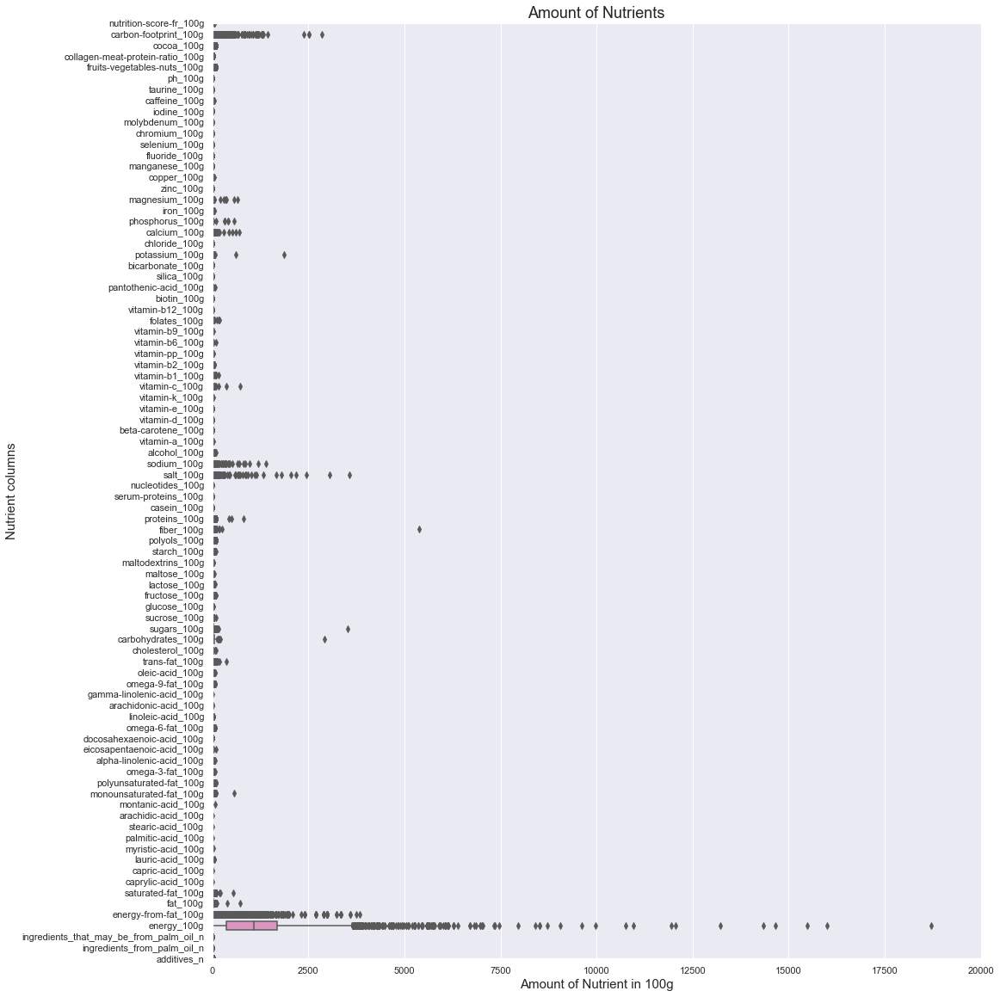

In [57]:
# Create Boxplots as an overview of the spread, median of all numerical columns to see which feature produces large variance
#df_nutri_sorted_median = df_nutri.median().sort_values()
#df_nutri_sorted = df_nutri[df_nutri_sorted_median]
sns.set(rc={'figure.figsize':(16,20)})
ax = sns.boxplot(data= df_nutri, orient="h", palette="Set2")
ax.set(xlim=(0,20000))
ax.set(ylim=(0,85))
plt.title('Amount of Nutrients', size = 18)
plt.xlabel("Amount of Nutrient in 100g", size=15)
plt.ylabel("Nutrient columns", size=15)
plt.show()

# Below graph shows all numerical columns and reducing the dataframe will help better visualize the true dataset


Boxplot above shows all columns and most clusters at 0 with many outliers. In particular, energy, energy from fat, salt and sodium and fibers, carbon foot-print shows high spread from the median. Reducing the number of variables will help better visualize the dataset for further analysis.

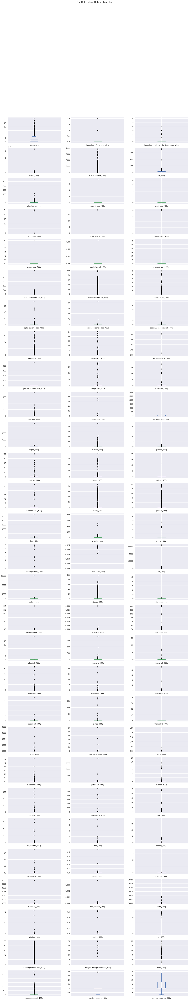

In [58]:
sh = df_nutri.select_dtypes(include=float).plot(kind='box', subplots=True, title='Our Data before Outlier-Elimination', figsize=(20,80), layout=(29,3))
plt.show()

Individual boxplots show most of the median and mean are at or near zero. Except nutrition scores, all other nutrients displays a skewed behavior.

#### Removal of products > 100g for all nutrients columns except columns concerning energy
We want to eliminate entries that violates physical means.Open food facts criteria and base measurement is 100g. For example, it is impossible to have 1000g of sodium in 100g of the actual product, these invalid entries needs to be removed otherwise the data is very skewed. We need to delete all products with a column (except energy) higher than 100g. The results from above reveals there are many outliers.

In [59]:
#Check for any values over 100g in all of the nutrients columns
for col in df_nutri[nutrients_columns].columns:
    if col not in ["energy_100g", "energy-from-fat_100g","nutrition-score-fr_100g","nutrition-score-uk_100g", "nutrition_grade_fr"]:
        df_nutri = df_nutri.loc[df_nutri[col] <= 100]
    df_nutri = df_nutri.loc[df_nutri[col] >= 0]

df_nutri = df_nutri.loc[df_nutri.energy_100g <= 3750]
df_nutri = df_nutri.loc[df_nutri.carbohydrates_100g >= df_nutri.sugars_100g]

The Open food fact data indicates that the energy_100g features are measured in kJ per 100g.
According to the ME general factors of the energy conversion factors, the highest energy containing food type is fat, at 37kJ per 1g, therefore the maximum energy per 100g of fat is 3700. Glucose, Fructose, Lactose, Sucrose, Starch are all 17kJ per gram. 
The Modified general factors are 16.7 kJ/g protein, 37.5 kJ/g fat, 16.7 kJ/g carbohydrate (or 15.7 kJ/g carbohydrate as monosaccharide equivalents) and 7.8 kJ/g dietary fiber. 
Therefore, in 100g of a product, the highest amount of energy it can have is 3750 kJ per 100g, being fat. We set this as threshold to filter out inaccurate data. 
https://www.fao.org/3/y5022e/y5022e04.htm

In [60]:
df_nutri.describe(include='all')

,product_name,categories_tags,pnns_groups_1,pnns_groups_2,nutrition_grade_fr,brands_tags,manufacturing_places_tags,main_category,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
count,210401,210401,210401,210401,210401,210401,210401,210401,210401.000000,210401.00000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.0,210401.000000,210401.000000,210401.0,210401.0,210401.0,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.0,210401.000000,210401.00000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,2.104010e+05,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000
unique,152363,14611,14,41,6,36737,4911,2095,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,N/A,N/A,N/A,N/A,d,N/A,N/A,N/A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,3069,158099,156948,154556,57114,5506,185576,158099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

#### Removing the products violating the maximum energy amount results in reducing 52,247 products.

Review the products that violated the maximum energy of 3750 per 100g product.

In [61]:
df_cal = df_final.loc[(df_final['energy_100g']>3750)]
df_cal[:10]

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging_tags,brands_tags,categories_tags,origins_tags,manufacturing_places_tags,labels_tags,emb_codes_tags,first_packaging_code_geo,cities_tags,purchase_places,stores,countries_tags,ingredients_text,allergens,traces_tags,serving_size,additives_n,additives_tags,ingredients_from_palm_oil_n,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_tags,main_category,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,Missing_values
698,00078684962026,http://world-fr.openfoodfacts.org/produit/0007...,usda-ndb-import,1489079059,2017-03-09T17:04:19Z,1489079059,2017-03-09T17:04:19Z,"Bunge, Clear Liquid Soybean Frying Oil",N/A,N/A,N/A,bunge-edible-oil-corporation,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,en:united-states,Soybean oil with tbhq and citric acid added to...,N/A,N/A,14 g (1 Tbsp),0.0,N/A,0.0,N/A,0.0,N/A,N/A,N/A,N/A,"en:to-be-completed,en:nutrition-facts-complete...",N/A,N/A,N/A,3887.0,0.0,100.0,14.29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.43,57.14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Categories
772,0008274333381,http://world-fr.openfoodfacts.org/produit/0008...,usda-ndb-import,1489067175,2017-03-09T13:46:15Z,1489067175,2017-03-09T13:46:15Z,Ginger Candy Sweetened With Raw Cane,N/A,N/A,N/A,reed-s-inc,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,en:united-states,"Diced baby ginger root, raw cane sugar.",N/A,N/A,10 g (10 g),0.0,N/A,0.0,N/A,0.0,N/A,N/A,N/A,N/A,"en:to-be-completed,en:nutrition-facts-complete...",N/A,N/A,N/A,4435.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,90.0,90.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Categories
3786,0011110846242,http://world-fr.openfoodfacts.org/produit/0011...,usda-ndb-import,1489077928,2017-03-09T16:45:28Z,1489077928,2017-03-09T16:45:28Z,All-Vegetable Shortening,N/A,N/A,N/A,"kroger,the-kroger-co",N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,en:united-states,"Soybean oil, hydrogenated palm oil, palm oil, ...",N/A,N/A,12 g (1 Tbsp),0.0,N/A,0.0,N/A,0.0,N/A,N/A,N/A,N/A,"en:

Let's see the number of products that has energy level over 3750 KJ/100g which is invalid.

In [62]:
df_cal.groupby(['energy_100g']).size().sort_values(ascending = False).head(15)

energy_100g
3766.0    182
3887.0    134
3862.0     25
4184.0     20
3761.0     20
3837.0     12
3757.0      8
3768.0      7
3764.0      4
5577.0      4
3770.0      4
3803.0      4
3760.0      3
3883.0      3
4335.0      3
dtype: int64

In [63]:
df_sum_cal = df_cal.groupby(['energy_100g']).size()
df_sum_cal.sum()

586

In [64]:
print('There are {} products that have more than the maximum 3750KJ/100g which are invalid.'.format(df_sum_cal.sum()))

There are 586 products that have more than the maximum 3750KJ/100g which are invalid.


 There are more than 500 products that contains more that the maximum energy limit which shows that these product serving sizes might be higher than 100g or nutrients details is simply inaccurate which should be removed.

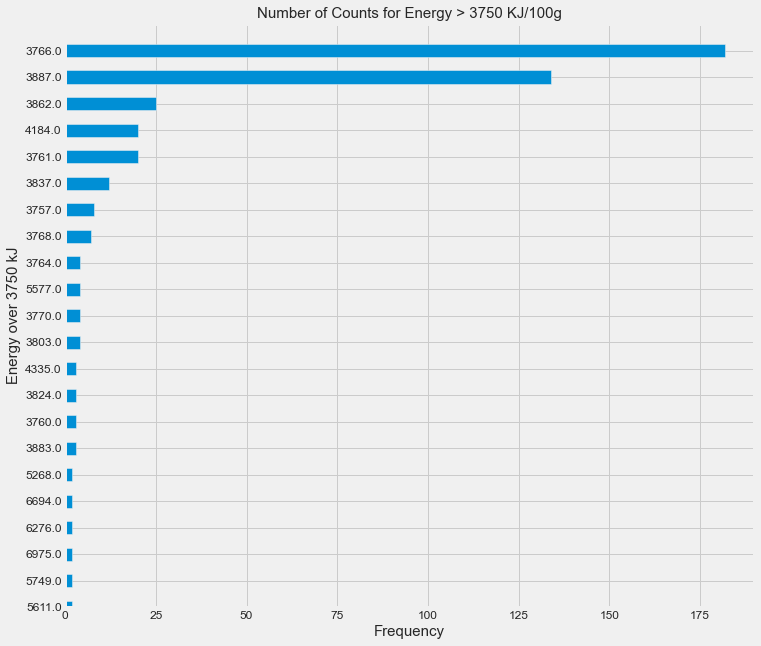

In [213]:
df_cal['energy_100g'].value_counts(sort = True).sort_values(ascending=True).plot(kind='barh', title='Number of Counts Energy > 3800 KJ/100g', fontsize = 12)
plt.ylim(130, 152)
plt.xlim(0, 190)
plt.xlabel("Frequency", size=15)
plt.ylabel("Energy over 3750 kJ", size=15)
plt.title('Number of Counts for Energy > 3750 KJ/100g',fontsize=15);
plt.show()

 There are more than 341 products with energy of slightly greater than 3750 kJ/100g of product.
 Now let's return to the cleansed open food fact data set.

#### After this last step of data cleansing, we come to the finalize dataset with 210401 products and 95 columns of data

In [66]:
df_nutri

,product_name,categories_tags,pnns_groups_1,pnns_groups_2,nutrition_grade_fr,brands_tags,manufacturing_places_tags,main_category,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
1,Banana Chips Sweetened (Whole),N/A,N/A,N/A,d,N/A,N/A,N/A,0.0,0.0,0.0,2243.0,0.0,28.57,28.57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.018,64.29,14.29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.6,3.57,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0214,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.00129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,14.0
2,Peanuts,N/A,N/A,N/A,b,Torn-glasser,N/A,N/A,0.0,0.0,0.0,1941.0,0.0,17.86,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,60.71,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.1,17.86,0.0,0.0,0.0,0.63500,0.250,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071,0.0,0.00129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Organic Salted Nut Mix,N/A,N/A,N/A,d,Grizzlies,N/A,N/A,0.0,0.0,0.0,2540.0,0.0,57.14,5.36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,17.86,3.57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.1,17.86,0.0,0.0,0.0,1.22428,0.482,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.143,0.0,0.00514,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,12.0
4,Organic Polenta,N/A,N/A,N/A,N/A,Bob-s-red-mill,N/A,N/A,0.0,0.0,0.0,1552.0,0.0,1.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,77.14,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.7,8.57,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,Breadshop Honey Gone Nuts Granola,N/A,N/A,N/A,N/A,Unfi,N/A,N/A,0.0,0.0,0.0,1933.0,0.0,18.27,1.92,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,63.46,11.54,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.7,13.46,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.038,0.0,0.00346,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

Without cateogrical columns, there are 87 numerical columns

In [67]:
#save the orignal columns and rows of df_nutri
df_nutri_orig = df_nutri
#Create a new dataframe to store numnerical columns
df_num = df_nutri[nutrients_columns]
df_num

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
1,0.0,0.0,0.0,2243.0,0.0,28.57,28.57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.018,64.29,14.29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.6,3.57,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0214,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.00129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,14.0
2,0.0,0.0,0.0,1941.0,0.0,17.86,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,60.71,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.1,17.86,0.0,0.0,0.0,0.63500,0.250,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071,0.0,0.00129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,2540.0,0.0,57.14,5.36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,17.86,3.57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.1,17.86,0.0,0.0,0.0,1.22428,0.482,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.143,0.0,0.00514,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,12.0
4,0.0,0.0,0.0,1552.0,0.0,1.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,77.14,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.7,8.57,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,1933.0,0.0,18.27,1.92,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,63.46,11.54,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.7,13.46,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.038,0.0,0.00346,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320753,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00000,0.000,5.2,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

Based on the finalized food product data set, let's view the Top 10 columns with highest mean

In [68]:
#View the Top 10 columns with highest means values
df_num.mean().sort_values(ascending = False)[:10]


energy_100g                1166.495426
carbohydrates_100g           32.126698
sugars_100g                  16.448649
fat_100g                     13.896366
nutrition-score-fr_100g       9.289647
nutrition-score-uk_100g       9.250065
proteins_100g                 6.735486
saturated-fat_100g            4.971107
energy-from-fat_100g          2.310710
additives_n                   2.044781
dtype: float64

Top 10 columns with highest standard deviation values

In [69]:
#View the Top 10 columns with highest Standard Deviation
df_num.std().sort_values(ascending = False)[:10]

energy_100g                808.201318
energy-from-fat_100g        58.006809
carbohydrates_100g          29.416498
sugars_100g                 21.754187
fat_100g                    17.733486
nutrition-score-uk_100g      8.452146
nutrition-score-fr_100g      8.371777
proteins_100g                8.236684
saturated-fat_100g           7.660505
salt_100g                    6.709279
dtype: float64

#### List of means and Standard deviation provides a reference of features that contributes most to the variance in the numerical portion of the dataset. 

### Determine the list of columns with mean of 0
##### Recall many columns were nulls and were filled with 0 . A column with a mean of 0 means there were no data or values that are very insignificant. <br>We will focus on columns with means of more than 0.01.

In [70]:
#Shortlist of the columns in Dataframe with mean > 0.01
means = df_num.mean()
std = df_num.std()
x = .01
y = .05
shortlist_cols = [ind for m,ind in zip(means,means.index) if (m>x) ]
#shortlist_cols_std = [ind for s,ind in zip(std,std.index) if s>y]
df_num2 = df_num[shortlist_cols]
df_num2.describe(include='all')

#Columns is downsized to 31 columns
#df_num2 is the final dataframe with a list of important nutrient columns

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,omega-6-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-b1_100g,vitamin-b2_100g,potassium_100g,calcium_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
count,210401.000000,210401.00000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000
mean,2.044781,0.02135,0.057352,1166.495426,2.310710,13.896366,4.971107,1.031802,0.611926,0.010691,0.013190,0.041228,0.012196,32.126698,16.448649,0.031208,0.093787,1.820064,6.735486,1.754388,0.690703,0.153503,0.011862,0.010708,0.030728,0.060659,0.278766,0.010642,0.213319,9.289647,9.250065
std,2.563678,0.14628,0.272774,808.201318,58.006809,17.733486,7.660505,6.044500,3.814857,0.345665,0.678801,0.655816,0.261383,29.416498,21.754187,1.231007,2.613174,3.546100,8.236684,6.709279,2.641440,1.879629,0.428780,0.286856,0.339383,0.438098,3.841705,0.422204,3.456577,8.371777,8.452146
min,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.00000,0.000000,418.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.420000,0.000000,0.000000,0.000000,0.000000,0.050800,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.00000,0.000000,1180.000000,0.000000,7.300000,1.710000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,21.600000,5.710000,0.000000,0.000000,0.000000,4.040000,0.650000,0.255906,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,9.000000
75%,3.000000,0.00000,0.000000,1753.000000,0.000000,22.120000,7.140000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,58.000000,26.000000,0.000000,0.000000,2.400000,9.410000,1.508760,0.594000,0.000000,0.000000,0.000000,0.000000,0.050000,0.000000,0.000000,0.000000,16.000000,16.000000
max,31.000000,2.00000,6.000000,3749.000000,3740.000000,100.000000,100.000000,100.000000,98.000000,58.000000,71.000000,100.000000,95.238000,100.000000,100.000000,87.800000,100.000000,100.000000,100.000000,100.000000,39.370079,97.900000,92.600000,42.500000,50.833000,99.006000,100.000000,25.000000,100.000000,40.000000,37.000000


In [71]:
df_num2.shape

(210401, 31)

There are now <b>31</b> columns after filtering for nutrients with mean of 0.01. These are mainly nutrients columns

### Univariate Investigation
#### Let's explore the sugar amounts per 100g food products. Choose your favourite food in the dropdown list and see the results!

In [73]:
fav_food_list = df_nutri.groupby('product_name')['energy_100g'].size().sort_values(ascending=False).head(100)
#list_of_foods = list(df_nutri[df_nutri.product_name!="N/A"]['product_name'])
fav_food_list.drop(labels=['N/A', 'Extra Virgin Olive Oil','Tomato Ketchup','Pasta Sauce','Chicken Broth', 'Tomato Sauce', 'Hot Sauce','Bbq Sauce', 'Real Mayonnaise'], inplace=True)
fvf_list = list(fav_food_list.index)

In [74]:
def show_fav_food(food = 'Cookies') :
    df_energybyfood = df_nutri.loc[(df_nutri.product_name == food)]
    df_energybyfood_s = df_energybyfood[['product_name','sugars_100g']]
    sns.histplot(data= df_energybyfood_s,  x = "sugars_100g", binwidth=1 ,palette="Set1",label="sugars_100g", color ='crimson', kde=True)
    plt.title('Sugar level/100gram of your favourite food: ' + '{}'.format(food), fontsize=15)
    plt.legend()
    plt.show();
    

In [75]:
widgets.interact(show_fav_food, food=fvf_list);

interactive(children=(Dropdown(description='food', index=4, options=('Ice Cream', 'Potato Chips', 'Premium Ice…

#### Next, let's plot the relationship of energy_from_fat with fat_100g

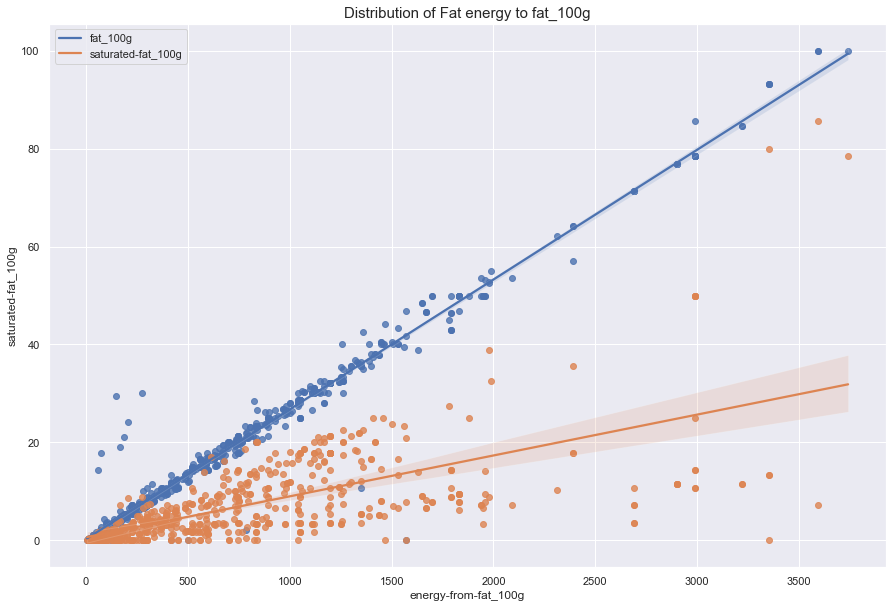

In [76]:
#Create a dataframe with the bad type of fats
df_fat = df_num2[['energy-from-fat_100g','fat_100g','saturated-fat_100g','monounsaturated-fat_100g','polyunsaturated-fat_100g','trans-fat_100g','cholesterol_100g','energy_100g']] 

#Filter the data where energy-from-fat are not zeros. Majority of the zero values stems from null replacements which causes noise to the dataset and the regression.
df_fat =df_fat[(df_fat['energy-from-fat_100g'] !=0)] 
#Scatter plot between energy from fat to fat
sns.set(rc={'figure.figsize':(15,10)})
sns.regplot(x=df_fat["energy-from-fat_100g"], y=df_fat["fat_100g"] )
sns.regplot(x=df_fat["energy-from-fat_100g"], y=df_fat["saturated-fat_100g"] )

# Get current axis on current figure
plt.gca()
plt.legend(['fat_100g','saturated-fat_100g'])
plt.title('Distribution of Fat energy to fat_100g', fontsize=15);
plt.show()

Energy from fat is positively correlated linearly with fat 100g and saturated fat.

[(-1.0, 102.0)]

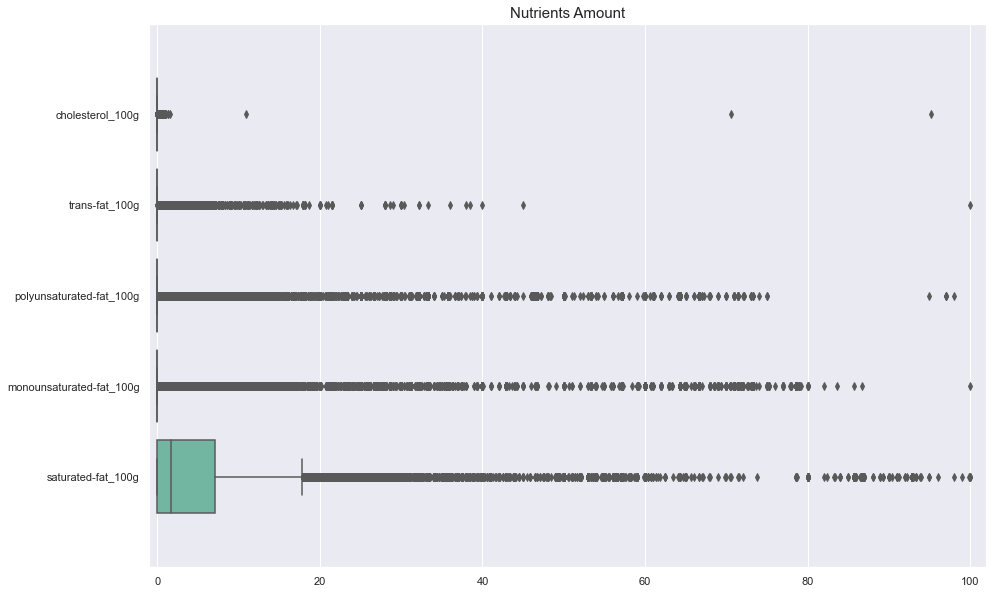

In [77]:
# Focus on the spread of each types of and "good" and "bad" fat.
# Good fats are unsaturated fats and bad fats are trans fat and cholestrol.
#ax = sns.boxplot(data = df_fat[df_fat['energy-from-fat_100g']<50000000000], orient = "h", palette="Set2")
df_fat_species = df_num2[['saturated-fat_100g','monounsaturated-fat_100g','polyunsaturated-fat_100g','trans-fat_100g','cholesterol_100g']]
#df_fat_species =  df_fat_species[df_fat_species>0]
axa = sns.boxplot(data = df_fat_species, orient = "h", palette="Set2")
axa.set_title('Nutrients Amount' ,fontsize = 15)
axa.set(ylim=(-1,5))
axa.set(xlim=(-1,102))

There are many outliers based on the standard model of boxplot where values beyond 1.5 quartiles from the median are outliers. The means presented for the differnt fat types are at zero. The shape of the skewed boxplot where median is near zero with one sided whiskers and many outliers on the higher scale suggests the data set is skewed rather than following the normal distribution. We can confirm our observation with histograms. 

Saturated fats, Monosaturated fats and polysaturated fats highly spreads out. Let's see the distribution

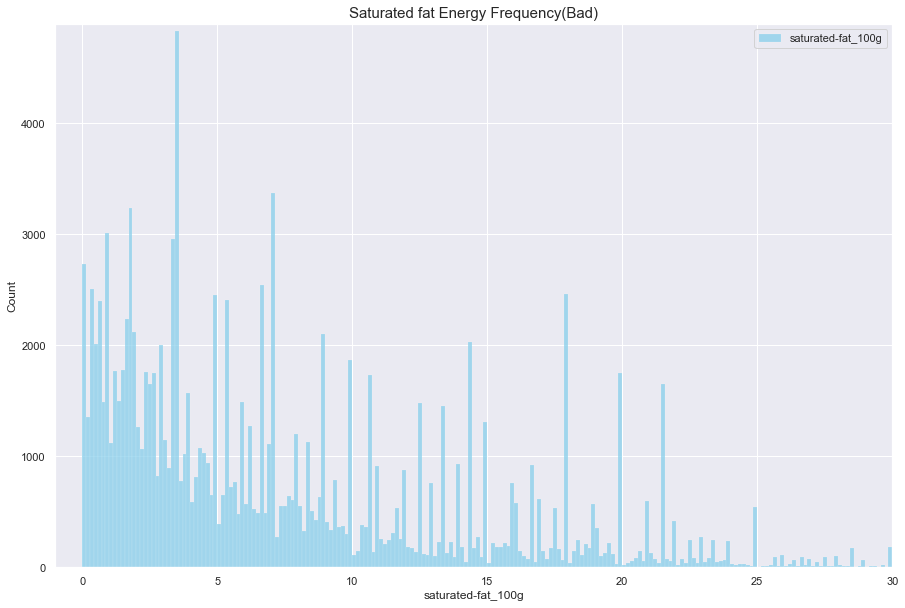

In [78]:
ax=sns.histplot(data=df_fat_species[df_fat_species['saturated-fat_100g']>0], x="saturated-fat_100g",  label="saturated-fat_100g", color ='skyblue', kde=False, bins=700)
# data for saturated fat needs to filter out the zero since most of the data was from replacement of nulls. This will heavily move the central tendency of the histogram near zero which skews the plot and spread of data.

ax.set(ylim=(-1,4900))
ax.set(xlim=(-1,30))
plt.title('Saturated fat Energy Frequency(Bad)', fontsize = 15)
plt.legend() 

Observing such histogram shows the data for saturated fat is rightly skewed. More products are found to have 0-1g of saturated fat per serving.

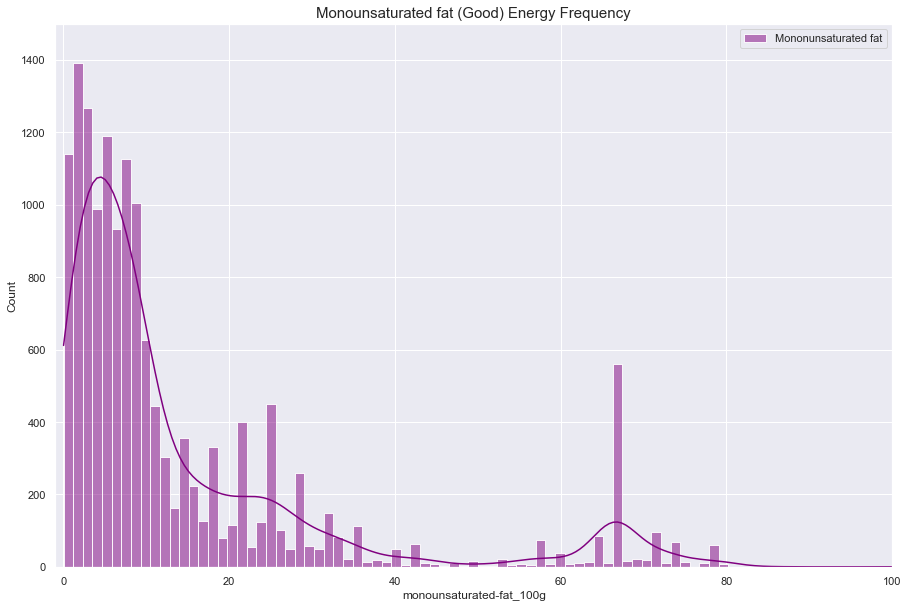

In [79]:
ax2=sns.histplot(data=df_fat_species[df_fat_species["monounsaturated-fat_100g"]>0], x="monounsaturated-fat_100g", label="Mononunsaturated fat", color = 'purple', kde=True)
ax2.set(ylim=(-1,1500))
ax2.set(xlim=(-1,100))
plt.title('Monounsaturated fat (Good) Energy Frequency', fontsize = 15)
plt.legend() 

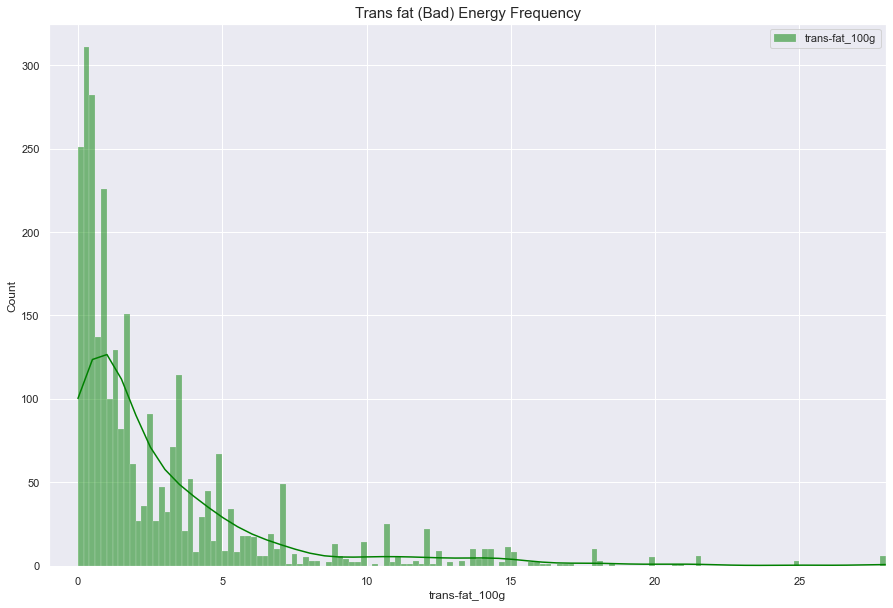

In [80]:
ax3=sns.histplot(data=df_fat_species[df_fat_species['trans-fat_100g']>0], x="trans-fat_100g",  label="trans-fat_100g", color ='green', kde= True, bins=500)
ax3.set(ylim=(-1,325))
ax3.set(xlim=(-1,28))
plt.title('Trans fat (Bad) Energy Frequency', fontsize = 15)
plt.legend()

Both monosaturated fat and trans fat histograms are rightly skewed, centralizing near zero with trailing amount beyond 60g and 12g, respectively. Majority of the products contains 0- 18g of monounsaturated fat and 0-4g of trans fat in this data set.

### Finding the relationships in Nutrition grade and Nutrition Scores

Let's check the unique nutrition grades used to rate healthiness of the food. 

In [81]:
#Check what grades are in nutrition grade in fr
df_nutri['nutrition_grade_fr'].unique();

In [82]:
#Plot nutrition grade vs energy from fat
#Set plot size
sns.set(rc={'figure.figsize':(15,10)})
#remap grades so boxplot can categrize each grade to the letter grade
df_nutri['nutrition_grade_fr_1'] = df_nutri['nutrition_grade_fr'].map({'a':'a','b':'b','c':'c', 'd':'d', 'e':'e', 'N/A':'N/A'})
#df_nutri['nutrition_grade_fr_1']

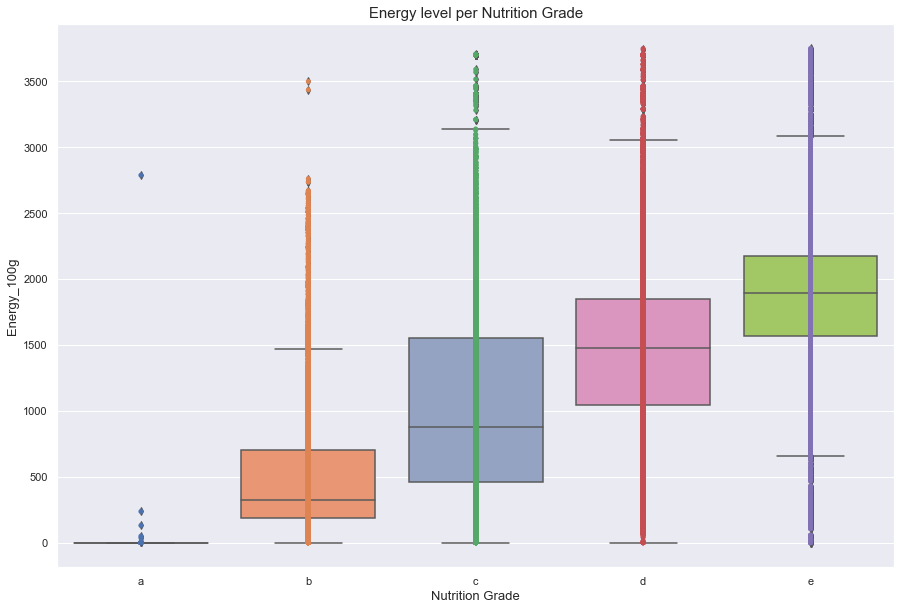

In [83]:
#Plot the actual plot for Nutrition Grade
df_nutri['nutrition_grade_fr_1'] = pd.Categorical(df_nutri['nutrition_grade_fr_1'], ['a','b','c','d','e'])
axa = sns.boxplot(data = df_nutri, x = df_nutri['nutrition_grade_fr_1'], y = "energy_100g", orient = "v", palette="Set2")
ax = sns.stripplot(x = df_nutri['nutrition_grade_fr_1'], y = "energy_100g",jitter= False,   data = df_nutri)
plt.xlabel("Nutrition Grade", size=13)
plt.ylabel("Energy_100g", size=13)
plt.title('Energy level per Nutrition Grade', size = 15)
plt.show()

### Treating Outliers and Results

#### Results of the Nutrition Score boxplots with no Outliers

Based on the two boxplots above, here are quite a few outliers in the dataset. Remove them to see the effect of the same boxplots and whether to keep and accept them as part of the originality of the dataset. 

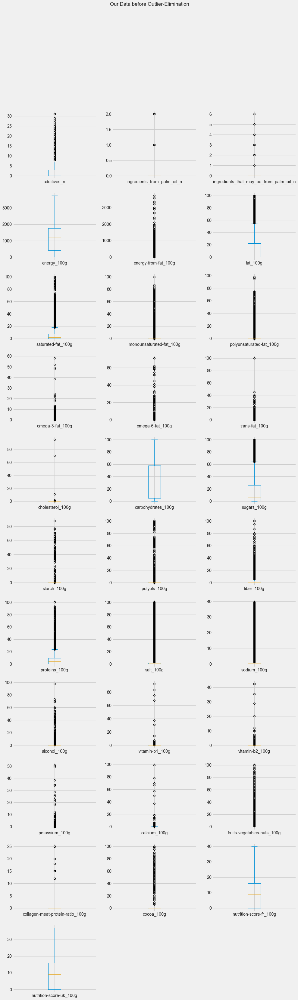

In [214]:
# See the plots again after reducing the numerical columns
sh = df_num2.select_dtypes(include=float).plot(kind='box', subplots=True, title='Our Data before Outlier-Elimination', figsize=(15,50), layout=(11,3))
plt.show()
#plt.semilogy()

In [84]:
df_nutri_no_outliers = df_nutri[df_num2.columns]

In [85]:
#Remove outliers that are not within the 1.5x Interquartile of the dataset
Q1 = df_nutri_no_outliers.quantile(0.01)
Q3 = df_nutri_no_outliers.quantile(0.99)
IQR = Q3 - Q1

df_nutri_no_outliers = df_nutri_no_outliers[~((df_nutri_no_outliers < (Q1 - 1.5 * IQR)) |(df_nutri_no_outliers > (Q3 + 1.5 * IQR))).any(axis=1)]
df_nutri_no_outliers.describe()

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,omega-6-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-b1_100g,vitamin-b2_100g,potassium_100g,calcium_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
count,199799.000000,199799.000000,199799.000000,199799.000000,199799.0,199799.000000,199799.000000,199799.000000,199799.000000,199799.0,199799.0,199799.000000,199799.000000,199799.000000,199799.000000,199799.0,199799.0,199799.000000,199799.000000,199799.000000,199799.000000,199799.000000,199799.000000,199799.000000,199799.000000,199799.000000,199799.0,199799.0,199799.0,199799.000000,199799.000000
mean,2.050366,0.021221,0.053309,1158.314313,0.0,13.550320,4.876031,0.863224,0.445841,0.0,0.0,0.003647,0.011136,32.335941,16.591675,0.0,0.0,1.790626,6.777348,1.452673,0.571918,0.050350,0.004186,0.003204,0.025364,0.056254,0.0,0.0,0.0,9.315207,9.279711
std,2.535919,0.145916,0.247867,791.189163,0.0,16.911411,7.247089,5.279523,2.485248,0.0,0.0,0.052742,0.027358,29.366414,21.859779,0.0,0.0,3.284491,8.162093,4.115930,1.620444,0.622266,0.041901,0.032122,0.120974,0.147025,0.0,0.0,0.0,8.363673,8.439273
min,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000
25%,0.000000,0.000000,0.000000,418.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,5.450000,0.500000,0.0,0.0,0.000000,0.000000,0.060960,0.024000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000
50%,1.000000,0.000000,0.000000,1176.000000,0.0,7.140000,1.700000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,21.880000,6.000000,0.0,0.0,0.000000,4.170000,0.670560,0.264000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,9.000000,9.000000
75%,3.000000,0.000000,0.000000,1736.000000,0.0,22.000000,7.140000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,58.140000,26.000000,0.0,0.0,2.500000,9.520000,1.524000,0.600000,0.000000,0.000000,0.000000,0.000000,0.053000,0.0,0.0,0.0,16.000000,16.000000
max,27.000000,2.000000,2.000000,3749.000000,0.0,100.000000,72.000000,70.000000,40.000000,0.0,0.0,1.320000,0.286000,100.000000,100.000000,0.0,0.0,36.000000,82.100000,67.228720,26.468000,12.000000,0.798000,0.637500,1.714000,1.765000,0.0,0.0,0.0,40.000000,37.000000


In [86]:
# df_nutri had 210,401 product. There were 10,602 outliers removed.

text_col = ['product_name','categories_tags','pnns_groups_1','pnns_groups_2','nutrition_grade_fr', 'brands_tags','manufacturing_places_tags','main_category']
#df_nutri_no_outliers1  = df_nutri_no_outliers.merge(df_nutri[text_col],how='left', left_on=df_nutri_no_outliers.index, right_on=df_nutri.index)
#df_nutri_no_outliers1 =  pd.concat([df_nutri[text_col],df_nutri_no_outliers], ignore_index=True, axis=1)

#df_nutri_no_outliers.set_index(df_nutri_no_outliers.index,inplace=True)
#df_nutri.set_index(df_nutri.index,inplace=True)

df_nutri_no_outliers1 = pd.concat([df_nutri_no_outliers,df_nutri[text_col]],axis=1,sort=False).reset_index()
df_nutri_no_outliers1.dropna(inplace=True)
df_nutri_no_outliers1.set_index('index')
    #df_final[['product_name','categories_tags','pnns_groups_1','pnns_groups_2','nutrition_grade_fr', 'brands_tags','manufacturing_places_tags']

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,omega-6-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-b1_100g,vitamin-b2_100g,potassium_100g,calcium_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,product_name,categories_tags,pnns_groups_1,pnns_groups_2,nutrition_grade_fr,brands_tags,manufacturing_places_tags,main_category
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,2243.0,0.0,28.57,28.57,0.0,0.0,0.0,0.0,0.0,0.018,64.29,14.29,0.0,0.0,3.6,3.57,0.00000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,14.0,14.0,Banana Chips Sweetened (Whole),N/A,N/A,N/A,d,N/A,N/A,N/A
2,0.0,0.0,0.0,1941.0,0.0,17.86,0.00,0.0,0.0,0.0,0.0,0.0,0.000,60.71,17.86,0.0,0.0,7.1,17.86,0.63500,0.250,0.0,0.0,0.0,0.0,0.071,0.0,0.0,0.0,0.0,0.0,Peanuts,N/A,N/A,N/A,b,Torn-glasser,N/A,N/A
3,0.0,0.0,0.0,2540.0,0.0,57.14,5.36,0.0,0.0,0.0,0.0,0.0,0.000,17.86,3.57,0.0,0.0,7.1,17.86,1.22428,0.482,0.0,0.0,0.0,0.0,0.143,0.0,0.0,0.0,12.0,12.0,Organic Salted Nut Mix,N/A,N/A,N/A,d,Grizzlies,N/A,N/A
4,0.0,0.0,0.0,1552.0,0.0,1.43,0.00,0.0,0.0,0.0,0.0,0.0,0.000,77.14,0.00,0.0,0.0,5.7,8.57,0.00000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,Organic Polenta,N/A,N/A,N/A,N/A,Bob-s-red-mill,N/A,N/A
5,0.0,0.0,0.0,1933.0,0.0,18.27,1.92,0.0,0.0,0.0,0.0,0.0,0.000,63.46,11.54,0.0,0.0,7.7,13.46,0.00000,0.000,0.0,0.0,0.0,0.0,0.038,0.0,0.0,0.0,0.0,0.0,Breadshop Honey Gone Nuts Granola,N/A,N/A,N/A,N/A,Unfi,N/A,N/A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320753,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.000,0.00,0.00,0.0,0.0,0.0,0.00,0.00000,0.000,5.2,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,Lager,"en:beverages,en:alcoholic-beverages,en:beers,e...",N/A,Alcoholic beverages,N/A,Carib,"carib-brewery-ltd,champs-fleurs,trinidad,w-i",en:beverages
320761,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.000,0.00,0.00,0.0,0.0,0.0,0.00,0.00000,0.000,12.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,Roussette du Bugey (2011),"en:beverages,en:alcoholic-beverages,en:wines,e...",N/A,Alcoholic beverages,N/A,Roussette-du-bugey,N/A,en:beverages
320763,0.0,0.0,0.0,21.0,0.0,0.20,0.20,0.0,0.0,0.0,0.0,0.0,0.000,0.50,0.50,0.0,0.0,0.2,0.50,0.02540,0.010,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,2.0,0.0,Thé vert Earl grey,"en:plant-based-foods-and-beverages,en:beverage...",Beverages,Non-sugared beverages,c,Lobodis,N/A,en:green-teas


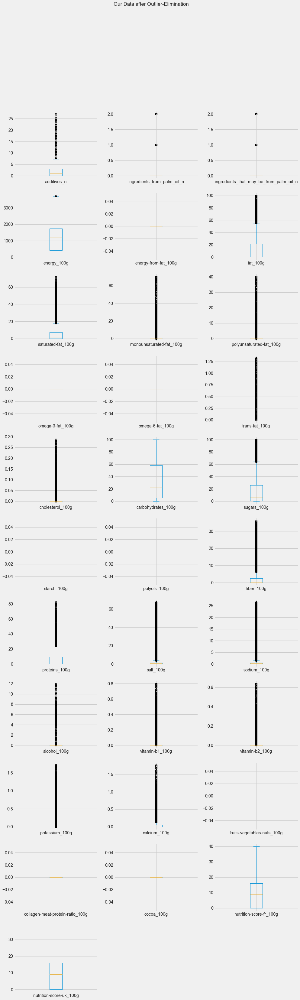

In [215]:
# See the plots again after reducing the numerical columns
sh = df_nutri_no_outliers.select_dtypes(include=float).plot(kind='box', subplots=True, title='Our Data after Outlier-Elimination', figsize=(15,50), layout=(11,3))
plt.show()
#plt.semilogy()

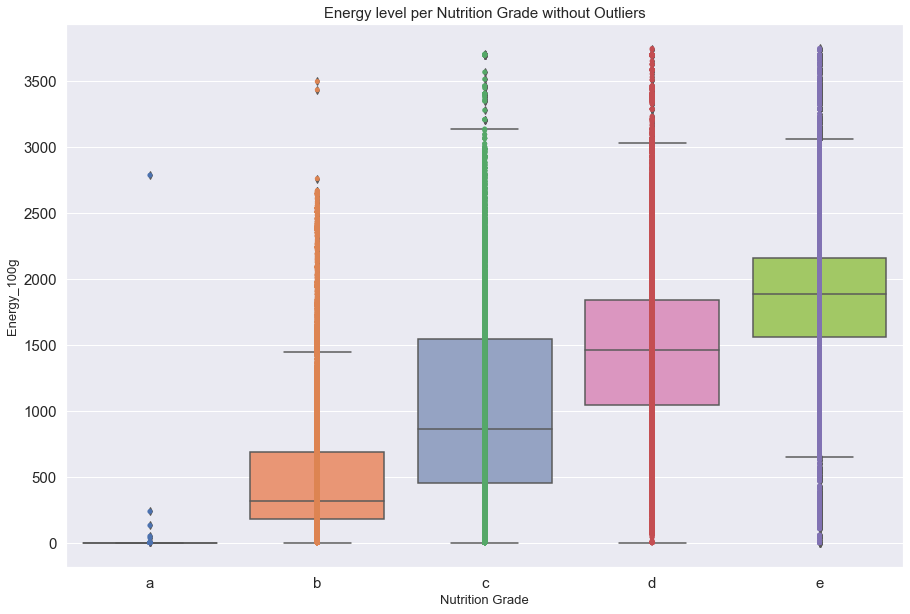

In [87]:
#Try to plot with data without outliers
#Plot the actual plot for Nutrition Grade
df_nutri_no_outliers1['nutrition_grade_fr'] = pd.Categorical(df_nutri_no_outliers1['nutrition_grade_fr'], ['a','b','c','d','e'])
ax = sns.boxplot(data = df_nutri_no_outliers1, x = df_nutri_no_outliers1['nutrition_grade_fr'], y = "energy_100g", orient = "v", palette="Set2")
ax = sns.stripplot(x = df_nutri_no_outliers1['nutrition_grade_fr'], y = "energy_100g",jitter= False,   data = df_nutri_no_outliers1)
plt.xlabel("Nutrition Grade", size=13)
plt.ylabel("Energy_100g", size=13)
plt.title('Energy level per Nutrition Grade without Outliers', size = 15)
plt.xticks(size=15)
plt.yticks(size=15)
plt.show()


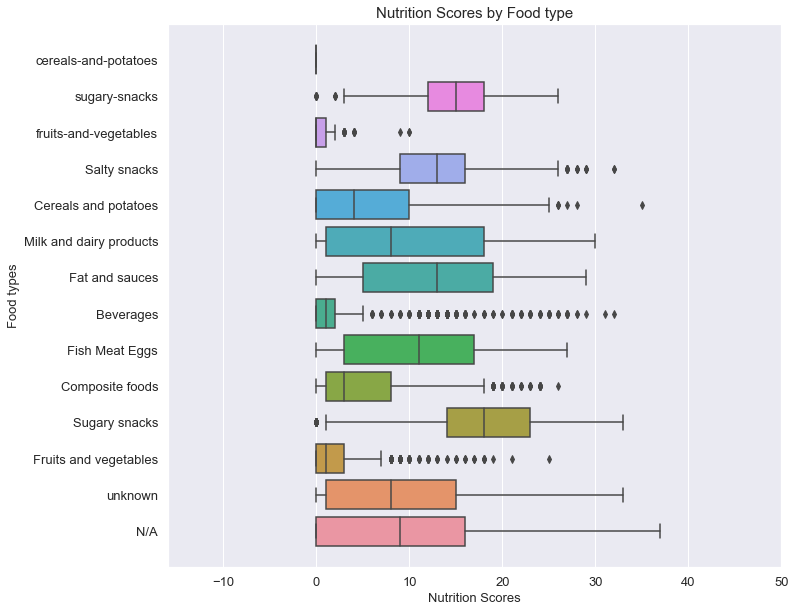

In [88]:
#Look at the sugar distribution based on food types since the data of sugar has high standard deviation.

sns.set(rc={'figure.figsize':(11,10)})

ax = sns.boxplot(data = df_nutri_no_outliers1,y = df_nutri_no_outliers1['pnns_groups_1'], x = df_nutri_no_outliers1["nutrition-score-uk_100g"], orient = "h")
ax.set(ylim=(-1,14))
ax.set(xlim=(-16,50))

#ax1 = sns.stripplot(y = 'pnns_groups_1',x = "sugars_100g",jitter=False,   data = df2)
#plt.title ("Sugar level by Food types", size=80)
plt.ylabel("Food types", size=13)
plt.xlabel("Nutrition Scores", size=13)
plt.title('Nutrition Scores by Food type', size = 15)
plt.xticks(size=13)
plt.yticks(size=13)
plt.show()

In [89]:
#Dataframe with no outliers
df_nutri_no_outliers1.describe(include='all')

,index,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,omega-6-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-b1_100g,vitamin-b2_100g,potassium_100g,calcium_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,product_name,categories_tags,pnns_groups_1,pnns_groups_2,nutrition_grade_fr,brands_tags,manufacturing_places_tags,main_category
count,199799.000000,199799.000000,199799.000000,199799.000000,199799.000000,199799.0,199799.000000,199799.000000,199799.000000,199799.000000,199799.0,199799.0,199799.000000,199799.000000,199799.000000,199799.000000,199799.0,199799.0,199799.000000,199799.000000,199799.000000,199799.000000,199799.000000,199799.000000,199799.000000,199799.000000,199799.000000,199799.0,199799.0,199799.0,199799.000000,199799.000000,199799,199799,199799,199799,160321,199799,199799,199799
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,144823,13277,14,41,5,34820,4508,1956
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N/A,N/A,N/A,N/A,d,N/A,N/A,N/A
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2946,153189,151354,149868,54680,5267,177641,153189
mean,136942.892162,2.050366,0.021221,0.053309,1158.314313,0.0,13.550320,4.876031,0.863224,0.445841,0.0,0.0,0.003647,0.011136,32.335941,16.591675,0.0,0.0,1.790626,6.777348,1.452673,0.571918,0.050350,0.004186,0.003204,0.025364,0.056254,0.0,0.0,0.0,9.315207,9.279711,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,88393.033177,2.535919,0.145916,0.247867,791.189163,0.0,16.911411,7.247089,5.279523,2.485248,0.0,0.0,0.052742,0.027358,29.366414,21.859779,0.0,0.0,3.284491,8.162093,4.115930,1.620444,0.622266,0.041901,0.032122,0.120974,0.147025,0.0,0.0,0.0,8.363673,8.439273,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,63047.500000,0.000000,0.000000,0.000000,418.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,5.450000,0.500000,0.0,0.0,0.000000,0.000000,0.060960,0.024000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,127108.000000,1.000000,0.000000,0.000000,1176.000000,0.0,7.140000,1.700000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,21.880000,6.000000,0.0,0.0,0.000000,4.170000,0.670560,0.264000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,9.000000,9.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,201787.000000,3.000000,0.000000,0.000000,1736.000000,0.0,22.000000,7.140000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,58.140000,26.000000,0.0,0.0,2.500000,9.520000,1.524000,0.600000,0.000000,0.000000,0.000000,0.000000,0.053000,0.0,0.0,0.0,16.000000,16.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [90]:
# Dataframe with outliers
df_nutri.describe(include='all')

,product_name,categories_tags,pnns_groups_1,pnns_groups_2,nutrition_grade_fr,brands_tags,manufacturing_places_tags,main_category,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,nutrition_grade_fr_1
count,210401,210401,210401,210401,210401,210401,210401,210401,210401.000000,210401.00000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.0,210401.000000,210401.000000,210401.0,210401.0,210401.0,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.0,210401.000000,210401.00000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,2.104010e+05,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,167727
unique,152363,14611,14,41,6,36737,4911,2095,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
top,N/A,N/A,N/A,N/A,d,N/A,N/A,N/A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,d
freq,3069,158099,156948,154556,57114,5506,185576,158099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

The result of removing 'outliers' removed close to 10,000 rows, however compare to the dataframe before treatment, we have actually lost all of the data in these nutrients columns: energy from fat, omega 3, omega 6 and trans_fat, polyols, alcohol, fruits-vegetables-nuts_100g, collagen-meat-protein-ratio_100g, cocoa_100g. Base on the boxplots, outlier still exist after treatment but columns of data has been lost. As a result, outliers will be kept as part of the actual data into the next models.

### Investigate on Outliers in Beverage
We saw there are many outliers in beverage category. Let's investigate to find out where outliers come from.

In [91]:
#Investigate why there are outliers in no outlier dataframe in Beverages
#Create a using dataframe without outliers. Filter products that are Beverage in food group
df_brands = df_nutri_no_outliers1[df_nutri_no_outliers1['pnns_groups_1']=='Beverages']
columns_brands = ['pnns_groups_1','brands_tags', 'pnns_groups_2','sugars_100g','main_category']
col_plot = ['brands_tags','sugars_100g','nutrition_grade_fr']

#Filter out the products with nutrition score amount >20 (outliers) and identify the brands they belong.
df_brands_high = df_brands[df_brands['nutrition-score-fr_100g']>20]
df_brands_high.groupby('brands_tags')
#Create dataframes to group by brands, nutrition grade
df_sugar = df_brands_high[col_plot]
df_beverage = pd.DataFrame(df_sugar.groupby('brands_tags')['sugars_100g'].size().sort_values(ascending=False))
df_score = pd.DataFrame(df_sugar.groupby('brands_tags')['nutrition_grade_fr'].size().sort_values(ascending=False))

For reference let's look at the products with high nutrition score which means it is highly processed or unhealthy.

In [93]:
df_brands_high = df_brands[df_brands['nutrition-score-fr_100g']>20]
df_brands_high[['brands_tags','product_name','pnns_groups_2','nutrition-score-fr_100g']].tail(20)


,brands_tags,product_name,pnns_groups_2,nutrition-score-fr_100g
201363,Maxwell-house,Cappuccino saveur Noisettes,Sweetened beverages,31.0
201364,Maxwell-house,Cappuccino saveur Biscuits Amandes,Sweetened beverages,32.0
201447,Jacobs,Jacobs 2u1,Non-sugared beverages,29.0
201565,"Maxwell-house,milka",Maxwell House max cappuccino,Sweetened beverages,28.0
201591,"Maxwell-house,mondelez,mondelez-international",Cappuccino,Sweetened beverages,33.0
201645,"Milka,kraft-foods,mondelez",Dosettes Milka au lait,Sweetened beverages,28.0
201716,"Carte-noire,mondelez",Cappuccino,Sweetened beverages,35.0
202376,Nescafe,Cappucino Chocolate,Sweetened beverages,25.0
202383,"Nescafe,nestle",Nescafé Café Viennois,Sweetened beverages,25.0
203671,Ola,Café Zero° Espresso,Non-sugared beverages,21.0


In [94]:
df_brands_high.groupby(['pnns_groups_2'])['pnns_groups_1'].size()

pnns_groups_2
Artificially sweetened beverages     3
Non-sugared beverages               50
Sweetened beverages                 66
Name: pnns_groups_1, dtype: int64

Interestingly, slightly less than half of the unhealthy beverage products are unsweetened and all of their nutrition grades are E, the lowest grade. Therefore even if the label states non-sugared, it still has a health risk. In the world, people equally prefer non-sugared and sweetened beverages. 

Looking at the results, the high number of outliers in Beverages category comes from brands that have high sugar level. Brands such as Nestle creates hot beverage mixes, and Cora and Auchan brands had high scores as they make sugar syrups and drink mixes/concentrates. These were categorized as beverage but really they are not cosumed directly. The drinks are dissolved in water therefore the sugar weight is almost equal to full 100g portion size.


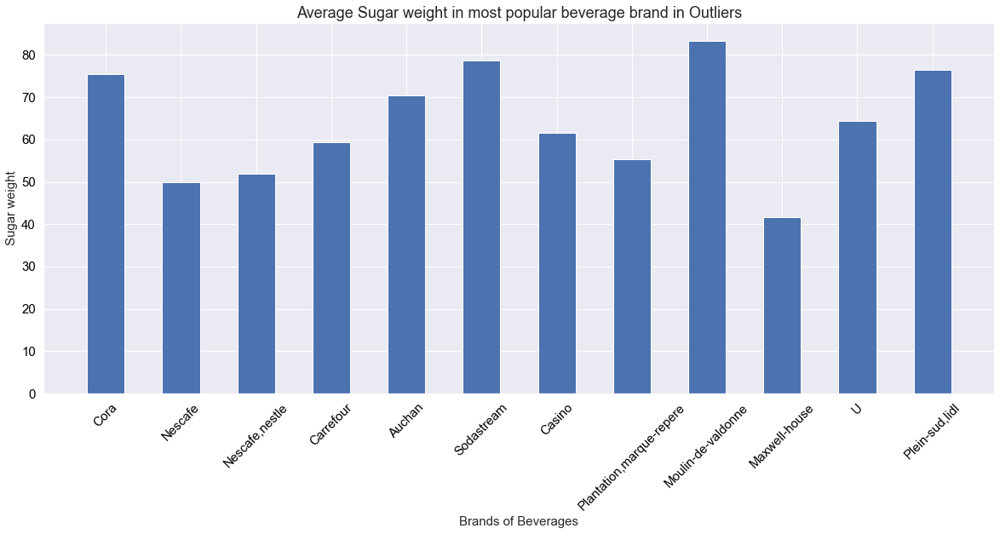

In [92]:
#Compare the products top12 average sugar amounts 
df_beverage_order = df_brands_high.groupby('brands_tags').mean()
df_score_order = df_score.groupby('brands_tags').mean()
top12 = df_beverage.head(12)
top12_score = df_score.head(12)
top12['mean_sugar'] = df_beverage_order['sugars_100g']
top12['Nutrition Score']= df_score_order['nutrition_grade_fr']

top12['brand'] = top12.index
top12_score['brand'] = top12_score.index

bars = top12.brand.unique()
x_pos = np.arange(len(bars))
plt.figure(figsize=(20,8))
#ax.set_xticklabels(plt.get_xticks(), rotation = 90)
plt.bar(x_pos,top12['mean_sugar'],  width=0.5)
plt.xticks(x_pos, bars, color='black', size = 15)
plt.yticks(color='black', size = 15)
plt.title('Average Sugar weight in most popular beverage brand in Outliers', size = 18)
plt.xlabel("Brands of Beverages", size=15)
plt.ylabel("Sugar weight", size=15)
plt.xticks(rotation=45)
plt.show()

#plt.figure(figsize=(20,10))
#bars_score = top12_score.brand.unique()
#x_pos_score = np.arange(len(bars_score))
#plt.bar(x_pos_score,top12['Nutrition Score'])
#plt.xticks(x_pos_score, bars_score, color='black', size = 15)
#plt.yticks(color='black', size = 15)
#plt.title('Average Nutrition Score in Top 10 most frequent brand of Beverages in Outliers', size = 18)
#plt.show()

In [218]:
df_bev_brand = df_brands.groupby(['brands_tags'])['pnns_groups_1'].size().sort_values(ascending = False).head(20)
df_bev_brand1 = pd.DataFrame(df_bev_brand)
df_bev_brand1.reset_index(inplace=True)
df_bev_brand1= df_bev_brand1[df_bev_brand1.brands_tags!='N/A']
df_bev_brand1

,brands_tags,pnns_groups_1
0,Coca-cola,153
1,Lipton,87
2,Carrefour,84
3,U,75
4,Auchan,63
6,Schweppes,59
7,Leader-price,53
8,Teisseire,50
9,Casino,47
10,Cora,46


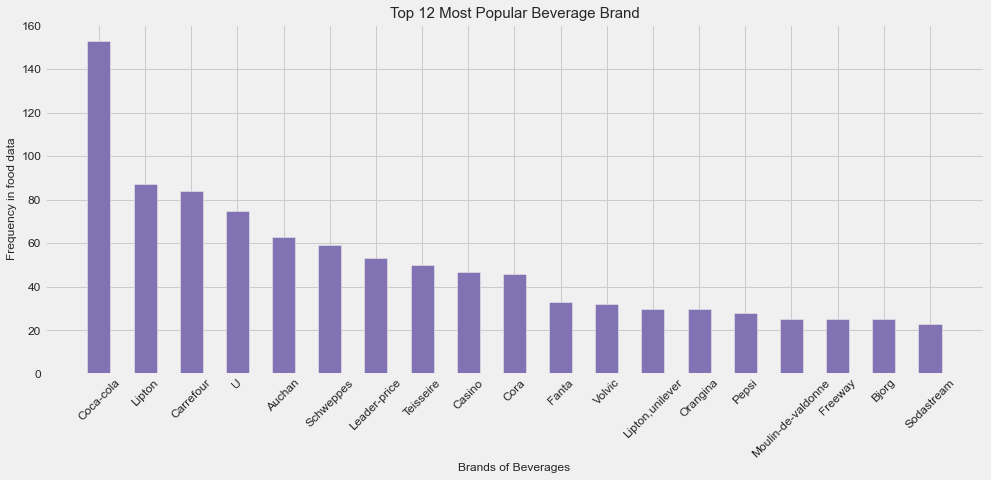

In [219]:
plt.figure(figsize=(15,6))
plt.bar(df_bev_brand1['brands_tags'], df_bev_brand1['pnns_groups_1'],  width=0.5, color= 'm')
plt.title('Top 12 Most Popular Beverage Brand', size = 15)
plt.xlabel("Brands of Beverages", size=12)
plt.ylabel("Frequency in food data", size=12)
plt.xticks(size = 12, rotation=45)
plt.yticks(size = 12)
plt.show()

We are able to determine the most popular beverage brands are Coca-cola, Lipton, Carrefour. To no surprise, coca cola is widely popular and is 1/3 more than Lipton. 

#### Since we will be keeping the data with outliers, we can proceed to explore more on Nutrition Grade

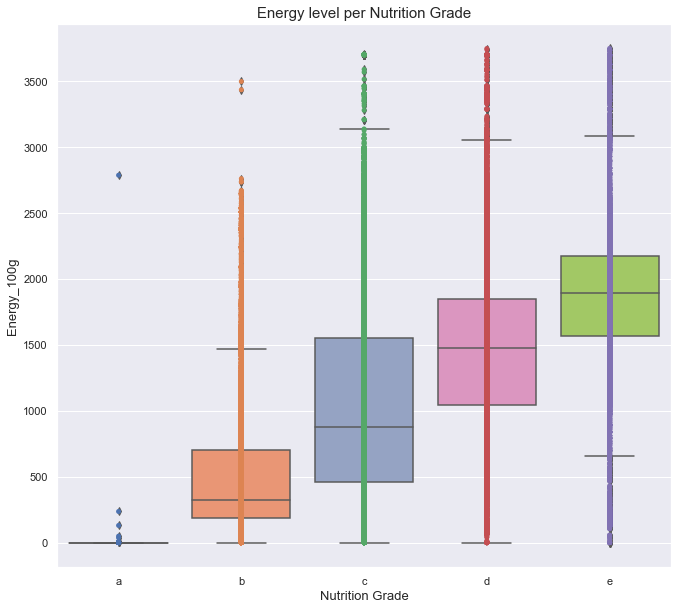

In [97]:
df_nutri['nutrition_grade_fr_1'] = pd.Categorical(df_nutri['nutrition_grade_fr_1'], ['a','b','c','d','e'])
ax = sns.boxplot(data = df_nutri, x = df_nutri['nutrition_grade_fr_1'], y = "energy_100g", orient = "v", palette="Set2")
ax = sns.stripplot(x = df_nutri['nutrition_grade_fr_1'], y = "energy_100g",jitter= False,   data = df_nutri)
plt.xlabel("Nutrition Grade", size=13)
plt.ylabel("Energy_100g", size=13)
plt.title('Energy level per Nutrition Grade', size = 15)
plt.show()

Nutrition uses a 5-letter grade, to assign food and beverages to their appropriate nutritional brackets, allowing for quick identification of highly nutritious products and menu items. Grade A represents the healthiest and E as the least healthy. The energy level increases as nutrition grade degrades. The nutrition grade system was employed to encourage healthier diet choices by making nutritional values easy to understand by consumers by looking at the label on products. The plot above shows that there are very few grade A products and majority of the foods that citizens enter are of less nutritional value ranging from grade B to E. The energy level is highest with grade E which are highly processed food items or contains sugary or salt. 

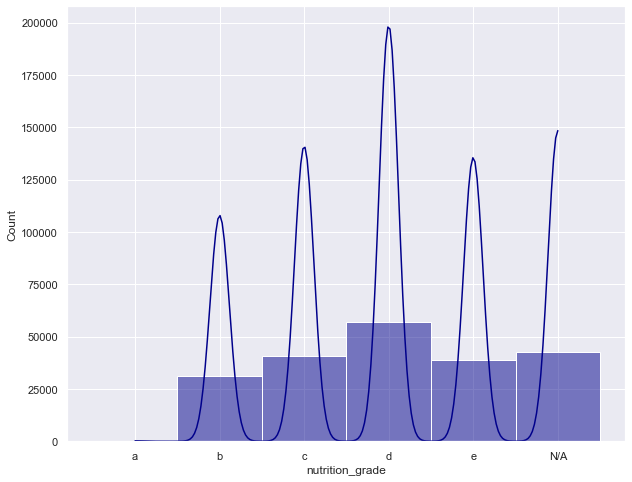

In [98]:
sns.set(rc={'figure.figsize':(10,8)})
#Sort the x axis from a to e
df_nutri['nutrition_grade'] = pd.Categorical(df_nutri['nutrition_grade_fr'], ['a','b','c','d','e', 'N/A'])

#show plot
sns.histplot(data=df_nutri, x="nutrition_grade" , color="darkblue", label="nutrition_grade_fr", kde= True, binwidth = 0.2,legend = True)
plt.show()

#Large percentage of N/A maybe due to no grades in France system or made outside of Europe and Fr grading is not required.
#N/A - it is assumed that products made outside of Europe are not graded. 

There are almost 45,000 products with N/A nutrition, let's explore the reason. 

In [225]:
NA_in_nutrition_grade_fr= df_nutri.loc[(df_nutri.nutrition_grade_fr == "N/A")]
NA_in_nutrition_grade_fr['Missing_values'] = df_final['Missing_values']
NA_in_nutrition_grade_fr[['product_name', 'categories_tags', 'nutrition_grade_fr','Missing_values']].tail(10)

,product_name,categories_tags,nutrition_grade_fr,Missing_values
320686,"Haywards, Baby Beetroot",N/A,N/A,Categories
320694,"Umami Pepper, Hot",N/A,N/A,Categories
320707,Balsamic Vinegar Of Modena Glaze,N/A,N/A,Categories
320717,100 г очищенных жареных семечек,"en:plant-based-foods-and-beverages,en:plant-ba...",N/A,Nutrients
320730,"Sour Licorice Twists, Sour Cherry",N/A,N/A,Categories
320732,Taco Seasoning Mix,N/A,N/A,Categories
320750,Raspados Ice Bars,N/A,N/A,Categories
320753,Lager,"en:beverages,en:alcoholic-beverages,en:beers,e...",N/A,Nutrients
320761,Roussette du Bugey (2011),"en:beverages,en:alcoholic-beverages,en:wines,e...",N/A,Nutrients
320771,"Sugar Free Drink Mix, Peach Tea",N/A,N/A,Categories


We had a column 'Missing' that noted whether the product was missing nutrient data, category or both to calculate a nutrition grade on Open Food Facts. Let's see what the distribution of the reason behind the lack of Grades in the 90815 products 

In [100]:
NA_in_nutrition_grade_fr.groupby(NA_in_nutrition_grade_fr['Missing_values']).size().sort_values(ascending = False)

Missing_values
Categories     33701
Nutrients       8924
Both              45
Not Missing        4
dtype: int64

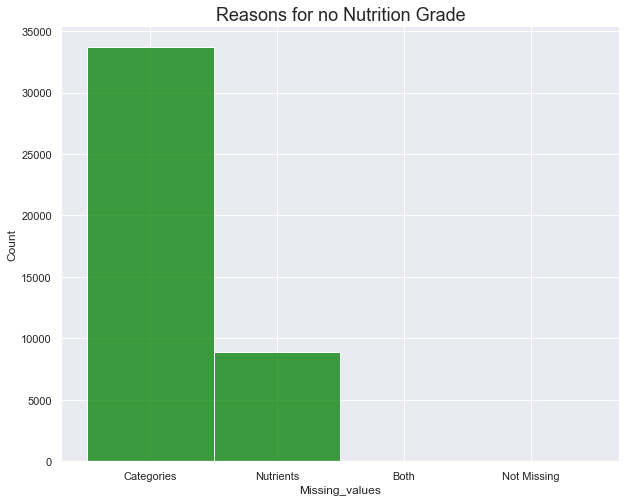

In [101]:
sns.histplot(data=NA_in_nutrition_grade_fr, x="Missing_values" , color="green", label="Missing Data Type", kde= False, binwidth = 0.2,legend = True)
plt.title('Reasons for no Nutrition Grade', size = 18)
plt.show()

There were more than 32,000 products not evaulated for a nutrition grade because the food category was not entered. The food  entry method to Open Food Fact database needs to be more restricted where food categories is mandatory, to avoid missing the valuable data for analysis.

In [102]:
NA_in_nutrition_grade_fr[NA_in_nutrition_grade_fr['Missing_values']=="Not Missing"]

,product_name,categories_tags,pnns_groups_1,pnns_groups_2,nutrition_grade_fr,brands_tags,manufacturing_places_tags,main_category,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,nutrition_grade_fr_1,nutrition_grade,Missing_values
184683,Velouté de légumes,"en:dried-products,en:meals,en:dried-products-t...",Composite foods,One-dish meals,N/A,Menuto,allemagne,en:soups,5.0,0.0,2.0,105.5,0.0,0.35,0.15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.35,0.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.75,0.75,0.0,0.0,0.0,0.90,0.354331,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,N/A,Not Missing
290398,Stocki Purée de pommes de terre,"en:dried-products,en:dried-products-to-be-rehy...",unknown,unknown,N/A,Knorr,suisse,en:dried-products,5.0,1.0,1.0,732.0,0.0,1.10,0.70,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.00,1.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.20,2.00,0.0,0.0,0.0,0.60,0.236220,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,N/A,Not Missing
296927,Purée de pommes de terre instantanée,"en:dried-products,en:dried-products-to-be-rehy...",unknown,unknown,N/A,"Mifloc,migros",suisse,en:dried-products,5.0,1.0,1.0,300.0,0.0,0.90,0.70,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.00,0.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.50,2.00,0.0,0.0,0.0,0.65,0.255906,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,N/A,Not Missing
314192,Bouillon de poule vermicelles,"en:groceries,en:dried-products,en:broths,en:dr...",unknown,unknown,N/A,"Knorr,unilever",N/A,en:groceries,1.0,0.0,0.0,88.0,0.0,0.50,0.10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.10,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.50,0.60,0.0,0.0,0.0,0.70,0.275591,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,N/A,Not Missing


#### Let's look at the relating Nutrition Scores

In [103]:
#See the spread for Nutrition Scores to see if these are skewed or normally distributed
  # Displays the histogram for France Nutrition score
sns.set(rc={'figure.figsize':(10,8)})
print("mean:\n", round(df_nutri["nutrition-score-fr_100g"].mean(),2))
print("med:\n",round(df_nutri["nutrition-score-fr_100g"].median(),2))
print("mod:\n",round(df_nutri["nutrition-score-fr_100g"].mode(),2))
print("var:\n",round(df_nutri["nutrition-score-fr_100g"].var(ddof=0),2))
print("ect:\n",round(df_nutri["nutrition-score-fr_100g"].std(ddof=0),2))
#df_nutri["nutrition-score-fr_100g"].hist() # Creates the histogram

import plotly.express as px
fig = px.histogram(df_nutri, x="nutrition-score-fr_100g", title = "Histogram of nutrition France scores")
fig.update_layout(
    title={
        'y':0.95,
        'x':0.5,
        'text': "Histogram of nutrition France scores",
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

#plt.xlabel("nutrition_score_fr", size=13)
#plt.ylabel("Count", size=13)
#plt.title ("Histogram of nutrition France scores", size=15)
#plt.show()

mean:
 9.29
med:
 9.0
mod:
 0    0.0
dtype: float64
var:
 70.09
ect:
 8.37


In [104]:

 # Displays the histogram for UK Nutrition score in UK
    
print("mean:\n",round(df_nutri["nutrition-score-uk_100g"].mean(),2))
print("med:\n",round(df_nutri["nutrition-score-uk_100g"].median(),2))
print("mod:\n",round(df_nutri["nutrition-score-uk_100g"].mode(),2))
print("var:\n",round(df_nutri["nutrition-score-uk_100g"].var(ddof=0),2))
print("ect:\n",round(df_nutri["nutrition-score-uk_100g"].std(ddof=0),2))  
#df_nutri["nutrition-score-uk_100g"].hist() # Creates the histogram

fig = px.histogram(df_nutri, x="nutrition-score-uk_100g" , title = "Histogram of nutrition UK scores")
fig.update_layout(
    title={
        'y':0.95,
        'x':0.5,
        'text': "Histogram of nutrition UK scores",
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

#plt.xlabel("nutrition-score-uk_100g", size=13)
#plt.ylabel("Count", size=13)
#plt.title ("Histogram of Nutrition UK scores", size=15)
#plt.show()

mean:
 9.25
med:
 9.0
mod:
 0    0.0
dtype: float64
var:
 71.44
ect:
 8.45


Based on the two histograms of nutrition scores in UK and France, over 80,000 products are not graded or has score of zero (unlikely). This is crucial information that citizen needs to classify their daily consumed foods. There are high number of zeros that are replacement of nulls. Open Food Fact can avoid missing scores with a better food product entry requirements. 

In [105]:
df_nutri.groupby('nutrition_grade_fr').size()

nutrition_grade_fr
N/A    42674
a         68
b      31027
c      40536
d      57114
e      38982
dtype: int64

#### Explore Food types with Nutrition scores

In [106]:
df_nutri.groupby(['pnns_groups_1'])['nutrition-score-uk_100g'].size().sort_values(ascending = False)

pnns_groups_1
N/A                        156948
unknown                     10560
Sugary snacks                9807
Milk and dairy products      6904
Fish Meat Eggs               5203
Composite foods              4598
Beverages                    4239
Cereals and potatoes         3879
Fat and sauces               3788
Salty snacks                 2335
Fruits and vegetables        1554
sugary-snacks                 380
fruits-and-vegetables         203
cereals-and-potatoes            3
Name: nutrition-score-uk_100g, dtype: int64

In [107]:
NA_in_nutrition_scores_fr= df_nutri.loc[(df_nutri['pnns_groups_1'] == "N/A")]
NA_in_nutrition_scores_fr.head(10)

,product_name,categories_tags,pnns_groups_1,pnns_groups_2,nutrition_grade_fr,brands_tags,manufacturing_places_tags,main_category,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,nutrition_grade_fr_1,nutrition_grade
1,Banana Chips Sweetened (Whole),N/A,N/A,N/A,d,N/A,N/A,N/A,0.0,0.0,0.0,2243.0,0.0,28.57,28.57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.018,64.29,14.29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.6,3.57,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0214,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.00129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,14.0,d,d
2,Peanuts,N/A,N/A,N/A,b,Torn-glasser,N/A,N/A,0.0,0.0,0.0,1941.0,0.0,17.86,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,60.71,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.1,17.86,0.0,0.0,0.0,0.63500,0.250,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071,0.0,0.00129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,b,b
3,Organic Salted Nut Mix,N/A,N/A,N/A,d,Grizzlies,N/A,N/A,0.0,0.0,0.0,2540.0,0.0,57.14,5.36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,17.86,3.57,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.1,17.86,0.0,0.0,0.0,1.22428,0.482,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.143,0.0,0.00514,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,12.0,d,d
4,Organic Polenta,N/A,N/A,N/A,N/A,Bob-s-red-mill,N/A,N/A,0.0,0.0,0.0,1552.0,0.0,1.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,77.14,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.7,8.57,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,N/A
5,Breadshop Honey Gone Nuts Granola,N/A,N/A,N/A,N/A,Unfi,N/A,N/A,0.0,0.0,0.0,1933.0,0.0,18.27,1.92,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,63.46,11.54,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.7,13.46,0.0,0.0,0.0,0.00000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.038,0.0,0.00346,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,N/A
6,Organic Long Grain White Rice,N/A,N/A,N/A,N/A,Lundberg,N/A,N/A,0.0,0.0,0.0,1490.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

There are many products that do not have a food group pnns_groups_1 entered. There is also duplicates in the group names : sugary snacks and salty snacks. We will need to correct them.

#### Clean repeated food group names 

In [108]:
# Use dictionary to help make the correction of the food group names 
correct_fg = dict()
correct_fg ['sugary-snacks'] = 'Sugary snacks'
correct_fg ['salty-snacks'] = 'Salty snacks'
correct_fg ['cereals-and-potatoes']  = 'Cereals and potatoes'
correct_fg ['fruits-and-vegetables'] = 'Fruits and vegetables'

In [109]:
#Cound the number of words in the list of entries
def ct_words(df, col = 'categories'):
    list_words = set()
    for word in df[col].str.split(','):
        if isinstance(word, float): continue
        list_words = set().union(word, list_words)       
    print("Number of categories in '{}': {}".format(col, len(list_words)))
    return list(list_words)

In [110]:
df_nutri['pnns_groups_1'] = df_nutri['pnns_groups_1'].replace(correct_fg)
pnns_group1_keys = ct_words(df_nutri, 'pnns_groups_1')
df_nutri.groupby(['pnns_groups_1']).size()

Number of categories in 'pnns_groups_1': 11


pnns_groups_1
Beverages                    4239
Cereals and potatoes         3882
Composite foods              4598
Fat and sauces               3788
Fish Meat Eggs               5203
Fruits and vegetables        1757
Milk and dairy products      6904
N/A                        156948
Salty snacks                 2335
Sugary snacks               10187
unknown                     10560
dtype: int64

#### Plot the nutrition scores against food group types to seek insights

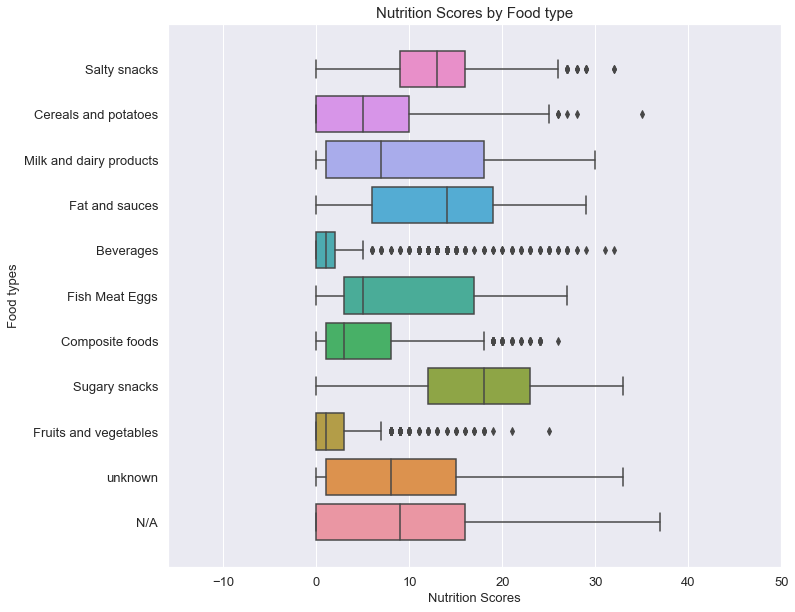

In [111]:
#Look at the sugar distribution based on food types since the data of sugar has high standard deviation.

sns.set(rc={'figure.figsize':(11,10)})

ax = sns.boxplot(data = df_nutri,y = df_nutri['pnns_groups_1'], x = df_nutri["nutrition-score-uk_100g"], orient = "h")
ax.set(ylim=(-1,11))
ax.set(xlim=(-16,50))

#ax1 = sns.stripplot(y = 'pnns_groups_1',x = "sugars_100g",jitter=False,   data = df2)
#plt.title ("Sugar level by Food types", size=80)
plt.ylabel("Food types", size=13)
plt.xlabel("Nutrition Scores", size=13)
plt.title('Nutrition Scores by Food type', size = 15)

ax.tick_params(labelsize = 13) 

<u>Average of Nutrition Scores by food groups</u>

In [112]:
df_nutri.groupby(['pnns_groups_1'])["nutrition-score-uk_100g"].median().sort_values(ascending = False)

pnns_groups_1
Sugary snacks              18.0
Fat and sauces             14.0
Salty snacks               13.0
N/A                         9.0
unknown                     8.0
Milk and dairy products     7.0
Cereals and potatoes        5.0
Fish Meat Eggs              5.0
Composite foods             3.0
Beverages                   1.0
Fruits and vegetables       1.0
Name: nutrition-score-uk_100g, dtype: float64

The lower the score the healthier the food items. Sugary snacks, fat and sauces and Salty snacks which are all processed food have the highest nutriton score median which indicates they contain more unhealthy nutriments. In contract, natural foods such as Fruits and vegetable and Fish Meat Eggs have the lowest nutrition scores. Interestingly both Fruit Vegetable and Beverages food groups possess many outliers that extends to higher score. We can investigate further to see if these are from a particular brand. Even if the outliers lies beyond the 1.5 quartile of the media (whiskers of these plots), they are still  rare and valid data points. 

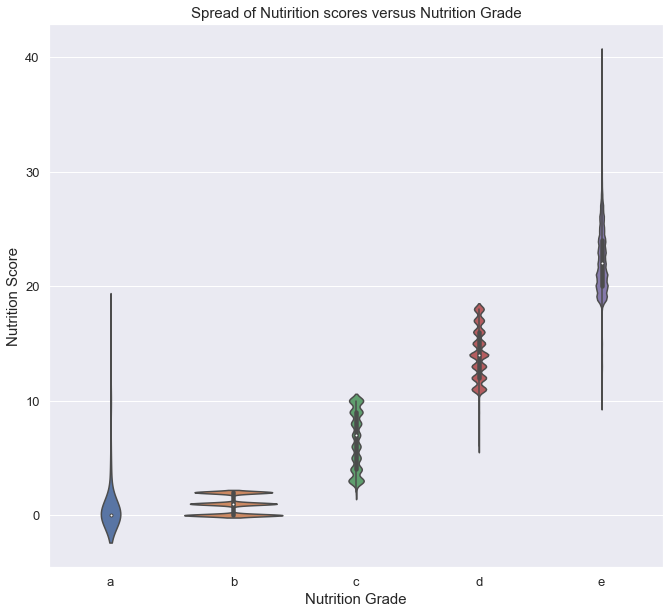

In [113]:
#Plot violin plot to see the relation with Nutrition Grades to Nutrition Scores excluding the N/A due to missing nutrients data and irrelevant for plot below
df_nutri['nutrition_grade'] = pd.Categorical(df_nutri['nutrition_grade_fr'], ['a','b','c','d','e'])
sns.violinplot(x=df_nutri["nutrition_grade"], y=df_nutri["nutrition-score-fr_100g"])

plt.ylabel("Nutrition Score", size=15)
plt.xlabel("Nutrition Grade", size=15)
plt.tick_params(labelsize = 13)
plt.title ("Spread of Nutirition scores versus Nutrition Grade", size=15)
plt.show()

Nutrition scores are based on the calculation of bad nutrients minus Good nutrients. Therefore the lower the score, the healthier choice and beneficial for health. Sugary snacks, Fats and sauces and Salty snacks are the top food groups with the highest score. Raw products found in nature such as Fruits Vegetables group has a low score of 3 and some of its products achieved negative scores. We see that the less healthy a product is the higher the Nutrition Score and the reverse is true for healthy food groups. 

We see that grade A scores achieve negative scores (best nutrient), and grade E has the highest score relating to the least healthy by Nutrition Score guidelines on Open Food Facts. A has score ranges from -10 to 0, E ranges 18 to 30.

<b>Here we will first plot the Correlation Matrix Heatmap and see the correlation of independent features with the variable "nutrition-score-fr_100g". This target variable can be found on the right hand side of the plot.</b>

Text(0.5, 1.0, 'Correlation Matrix between all features before transforming into PCA')

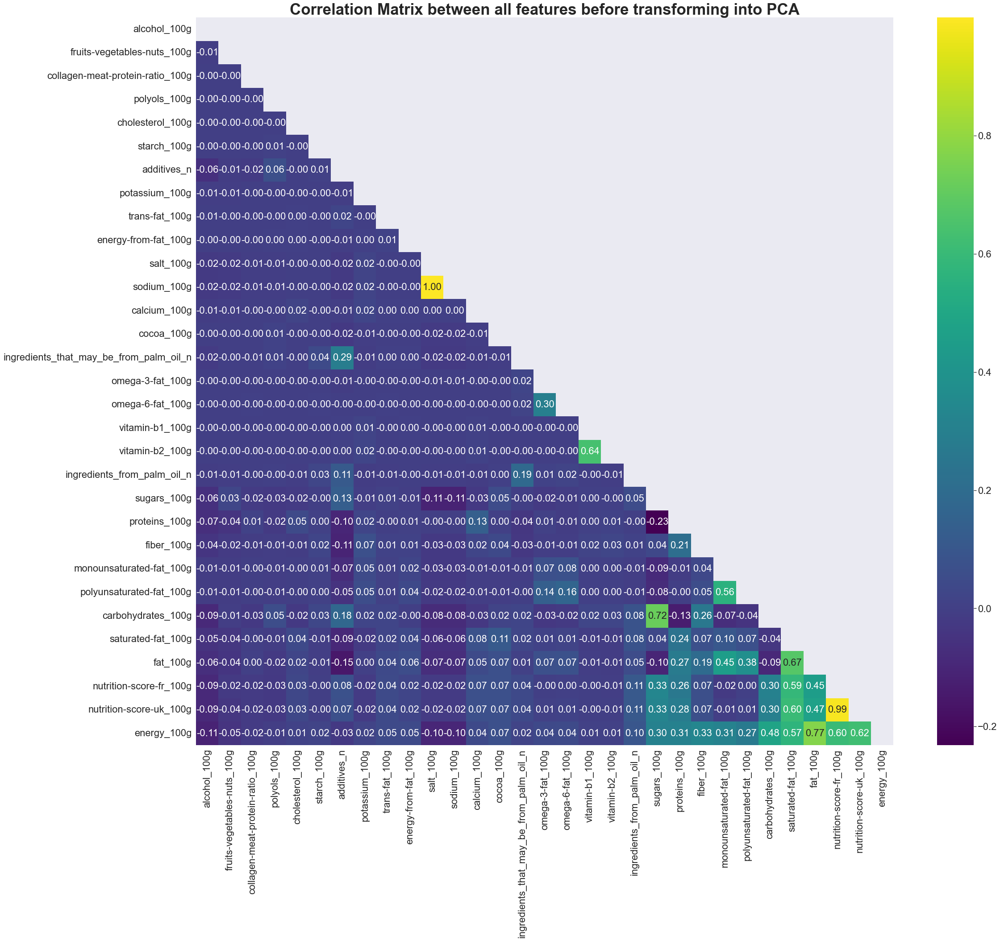

In [114]:
plt.figure(figsize=(35,30))
sns.set(font_scale=2)

sum_corr = df_num2.corr().sum().sort_values(ascending=True).index.values
sum_corr

df_num2[sum_corr].corr()
mask = np.zeros_like(df_num2.corr())
mask[np.triu_indices_from(mask)] = True

sns.heatmap(df_num2[sum_corr].corr(), mask=mask, annot=True, fmt='.2f',cmap="viridis", annot_kws={"fontsize":22})
plt.title('Correlation Matrix between all features before transforming into PCA', fontsize = 35, weight = 'bold')

<u>Highest Correlation with Nutrition Score_100g</u>

In [115]:
#Correlation with Nutrition score 
corr_values = df_num2.corr()
cor_target = abs(corr_values["nutrition-score-fr_100g"])
#Selecting highly correlated features
relevant_features = cor_target[cor_target>0.3]
relevant_features.sort_values(ascending=False)

nutrition-score-fr_100g    1.000000
nutrition-score-uk_100g    0.988057
energy_100g                0.603979
saturated-fat_100g         0.587549
fat_100g                   0.449402
sugars_100g                0.334523
carbohydrates_100g         0.304581
Name: nutrition-score-fr_100g, dtype: float64

#### <br>Determine Multicollinearity between the Features based on Correlation Coeffiicient
A co-efficient score that is close to 1 represents that there is a very strong correlation between variables. Based on the above heat map, the lighter colours such as yellow and green values represent strong positive correlations.
Nutrition score UK has the highest correlations (0.99) with the Nutrition Score France followed by energy_100g (0.60) and saturated-fat_100g (0.58). These inital results reveal fat and sugar are significant contributors to the Open Food Data. We can conclude that more people are interested in products containing fats and sugars and the fact that products very often contains either or both.

In [116]:
print (corr_values['energy_100g'].sort_values(ascending=False)[:10], '\n')

energy_100g                 1.000000
fat_100g                    0.772389
nutrition-score-uk_100g     0.620339
nutrition-score-fr_100g     0.603979
saturated-fat_100g          0.567654
carbohydrates_100g          0.481804
fiber_100g                  0.331566
monounsaturated-fat_100g    0.312089
proteins_100g               0.305721
sugars_100g                 0.304677
Name: energy_100g, dtype: float64 



In [117]:
df_plot = df_nutri

In [236]:
def plot_bygroup(interested_valcolumn,interested_catcolumn, data): 
   
    ##group by product groups having more than 100 rows, we want to have groups with 100 observations
    data_plot = data.groupby([interested_catcolumn]).filter(lambda x: len(x) > 0)
    food_groups = data_plot[interested_catcolumn].unique()
    groups = []
    ##create list that contains lists observations for each category
    for m in food_groups:
        groups.append(data_plot[data_plot[interested_catcolumn]==m][interested_valcolumn])
        
    ##drawing boxplots
    #plt.boxplot(groups,labels=food_groups,vert=False,showfliers=False )
    sns.boxplot(data = df_plot, y =df_plot[interested_catcolumn], x =df_plot[interested_valcolumn], orient = "h",showfliers=False, palette='Set3')
    sns.set(font_scale=1)
    plt.xlabel('Amount', size = 13)
    plt.ylabel('Food groups', size = 13)
    plt.title(interested_catcolumn.capitalize() + ' and ' + interested_valcolumn.capitalize() + ' plot' ,size = 15 )
    plt.xticks(size=13)
    plt.yticks(size=13)
    plt.show()
   


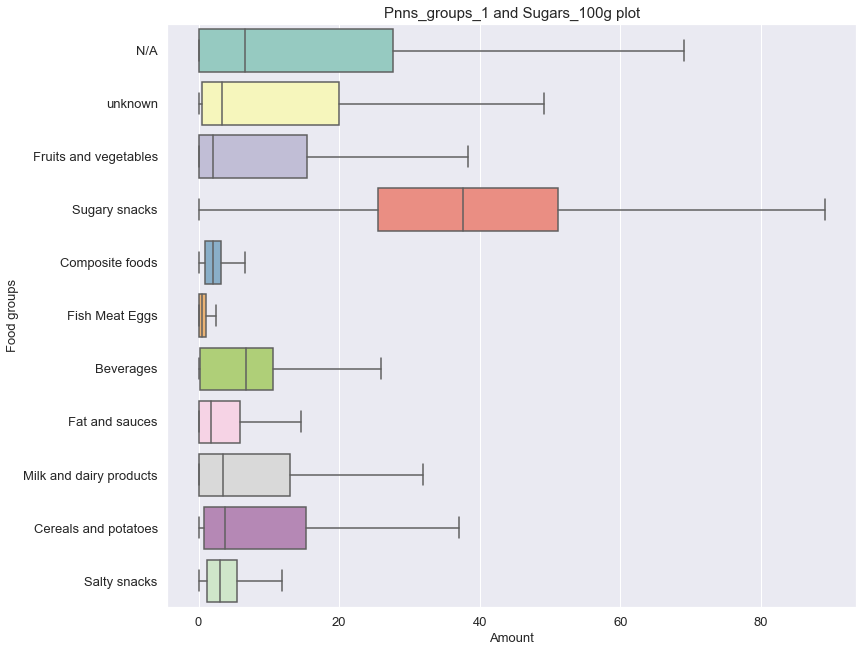

In [237]:
plot_bygroup('sugars_100g','pnns_groups_1',df_plot)

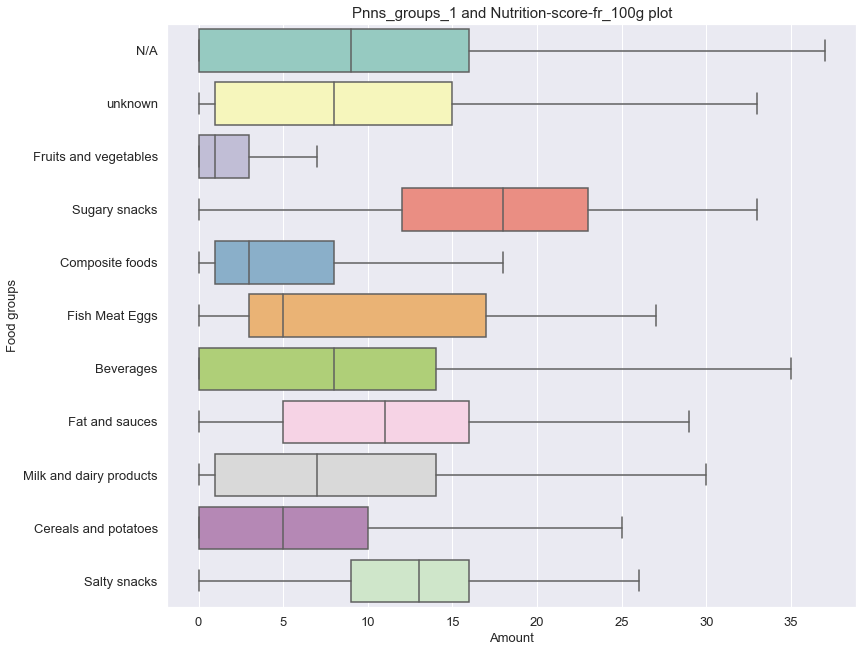

In [238]:
plot_bygroup('nutrition-score-fr_100g','pnns_groups_1',df_plot)

With the plot_bygroup function, we explore the difference in median between food groups based a nutrient via boxplots. Above boxplots show the spread and variance of the nutrition scores and energy by food groups. Noticbly, Sugary snacks and cereals and potates has the highest amount sugar while composite foods and fruits and vegetables groups have the best nutrition score equivalet to nutrition grade A.

## Investigate numerical data using multivariate analysis

### Apply PCA method to explore the data furthermore
After selecting the numerical columns of interest where the column averages is higher than 0.01, 31 features remains(columns) in the open foods dataframe. It is difficult to analyze data in multi dimensions so PCA will be applied to reduce the dimension/ features into a lower dimensional subspace while maintaining most of the relevant data and retain the maximum variance in high dimensional data. <br><br>
PCA will be applied assuming many of the features are highly correlated with each other with the goal of reducing their number to an independent set. The steps below will be taken for PCA:

1.Standardize the multi dimensional dataset as preprocessing step.<br>
2.Import PCA module from scikitlearn to determine the eigenvectors and eigenvalues (Principal Components) </br>
3.Sort the eigenvalues by decreasing order to rank the corresponding eigenvectors.</br>
4.Plot the transformed data on to the Prinicpal Component axis to find clusters or groups.</br>
5.Create a scree plot to determine the minimum number of principal components to achieve 85% explained variance</br>
6.Cast the features on the Variable Vector Map to for analysis.

In [121]:
# We will use df_num2 as the dataframe has been treated to carry only columns with mean > 0.005, eliminating the fully blank columns and those with insignificant amount of nutrient in compared to the rest of dataset.
df_nutri.describe(include='all')

,product_name,categories_tags,pnns_groups_1,pnns_groups_2,nutrition_grade_fr,brands_tags,manufacturing_places_tags,main_category,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,nutrition_grade_fr_1,nutrition_grade
count,210401,210401,210401,210401,210401,210401,210401,210401,210401.000000,210401.00000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.0,210401.000000,210401.000000,210401.0,210401.0,210401.0,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.0,210401.000000,210401.00000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,2.104010e+05,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,167727,167727
unique,152363,14611,11,41,6,36737,4911,2095,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,5
top,N/A,N/A,N/A,N/A,d,N/A,N/A,N/A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,d,d
freq,3069,158099,156948,154556,57114,5506,185576,158099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

This is the data in which PCA will be applied.

In [242]:
df_pca = pd.concat([df_num2, df_nutri[['nutrition_grade_fr']]], axis = 1)
#df_pca

In [241]:
pca_no_cat = df_pca.drop(['nutrition_grade_fr'], axis=1)
#pca_no_cat

Here we can check the final dataframe with all numerical features before applying the PCA. The final dataset contains 31 features we want to reduce further to a low dimensional model to ease the data analysis.

In [124]:
cols = df_pca.columns 
no_scores_features = cols.drop(['nutrition_grade_fr'])
features = list(no_scores_features)# list(filteredColumns_num.index)
features
pca_no_cat[features]

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,omega-6-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-b1_100g,vitamin-b2_100g,potassium_100g,calcium_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
1,0.0,0.0,0.0,2243.0,0.0,28.57,28.57,0.0,0.0,0.0,0.0,0.0,0.018,64.29,14.29,0.0,0.0,3.6,3.57,0.00000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,14.0,14.0
2,0.0,0.0,0.0,1941.0,0.0,17.86,0.00,0.0,0.0,0.0,0.0,0.0,0.000,60.71,17.86,0.0,0.0,7.1,17.86,0.63500,0.250,0.0,0.0,0.0,0.0,0.071,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,2540.0,0.0,57.14,5.36,0.0,0.0,0.0,0.0,0.0,0.000,17.86,3.57,0.0,0.0,7.1,17.86,1.22428,0.482,0.0,0.0,0.0,0.0,0.143,0.0,0.0,0.0,12.0,12.0
4,0.0,0.0,0.0,1552.0,0.0,1.43,0.00,0.0,0.0,0.0,0.0,0.0,0.000,77.14,0.00,0.0,0.0,5.7,8.57,0.00000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,1933.0,0.0,18.27,1.92,0.0,0.0,0.0,0.0,0.0,0.000,63.46,11.54,0.0,0.0,7.7,13.46,0.00000,0.000,0.0,0.0,0.0,0.0,0.038,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320753,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.000,0.00,0.00,0.0,0.0,0.0,0.00,0.00000,0.000,5.2,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0
320761,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.000,0.00,0.00,0.0,0.0,0.0,0.00,0.00000,0.000,12.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0
320763,0.0,0.0,0.0,21.0,0.0,0.20,0.20,0.0,0.0,0.0,0.0,0.0,0.000,0.50,0.50,0.0,0.0,0.2,0.50,0.02540,0.010,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,2.0,0.0
320768,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.000,0.00,0.00,0.0,0.0,0.0,0.00,0.00000,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0


In [244]:
x = df_pca.loc[:, features].values
y = df_pca.loc[:,['nutrition_grade_fr']].values
#y.shape
#x

### 1) Standardize the multi dimensional dataset as preprocessing step.

PCA directions are highly sensitive to data scaling so we need to standardize the features of my the dataframe before applying PCA. This will rid of the scaling issue if features were measured on different scale and ensures we assign equal importance to all features. Sklearn StandardScaler module is used to scale the dataset’s features onto unit scale (mean = 0 and variance = 1).

In [126]:
from sklearn.preprocessing import StandardScaler
x = StandardScaler().fit_transform(x)

### 2) Import and Apply PCA
Applying PCA
Python's Scikit-Learn library is imported to access the PCA class for PCA decomposition. PCA depends only upon the feature set and not the label data. Therefore, PCA can be considered as an unsupervised machine learning technique.

<i>Performing PCA using Scikit-Learn is involves two steps:</i>

<b>1)</b> Initialize the PCA class by passing the number of components or percentage total variance explained ratio as desired to define 'n_components'. I have choosen the latter and assigned 85% to percentage total variance explained ratio.</br>
<b>2)</b> Call the fit and then transform methods by passing the feature set to these methods. <br><br>
The transform method returns the specified number of principal components. The result below 'PCS' represents it requires minimum of 20 principal components such that 85% of the relevant and data variance is retained.

In [127]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.85)
pcs = pca.fit_transform(x)
pcs.shape

(210401, 20)

PCS represents the Principal Components and the eigen vectors that has been fitted to the 20 components indicating the direction of maximum variance.

In [128]:
print(pcs)

pca.components_ represents the eigen vectors in the original dataset with 31 features, compared to the sample mean. 

In [129]:
print(pca.components_)

### 3) Sort the eigenvalues by decreasing order to rank the corresponding eigenvectors.
The PCA class explained_variance returns the amount of variance caused by each of the principal components. Explained variance ratio is the percentage of variance explained by each of the selected components, ranked in decreasing order. These are the largest eigenvalues of the covariance matrix that is calculated based on difference of each data point to the population means. The larger the eigenvalue the more variance is explained in the selected principal component.

In [130]:
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

[4.04253378 2.32045514 2.00928112 1.65908482 1.61951098 1.41451667
 1.21593685 1.1621919  1.04278275 1.01568002 1.00736584 1.00333007
 0.99892529 0.99386845 0.98995073 0.9807732  0.9764442  0.95981078
 0.93523224 0.85222502]
[0.1304037  0.07485304 0.06481521 0.05351861 0.05224204 0.04562935
 0.03922358 0.03748988 0.03363799 0.03276372 0.03249552 0.03236533
 0.03222324 0.03206012 0.03193374 0.03163769 0.03149805 0.03096149
 0.03016864 0.027491  ]


Since we have set the PCA module to retain 85% of the relevant data, PCA had determine that 20 principal components are required as shown in the count of the values above. 

Variance ratio results above indicates the first principal component only explained 13% of the data variance (relevant data), followed by 7.48% in the second component. Evidently, the rest of the principal components decrease in variance explained, with only 6% to 3%. According to the results for explained variance, the dimensionality must stay at 20 to retain most of the relavant data. This means the dimensionality could not be reduced further, without losing significant portion of the relevant data. Each component contributes to the variance similarly.

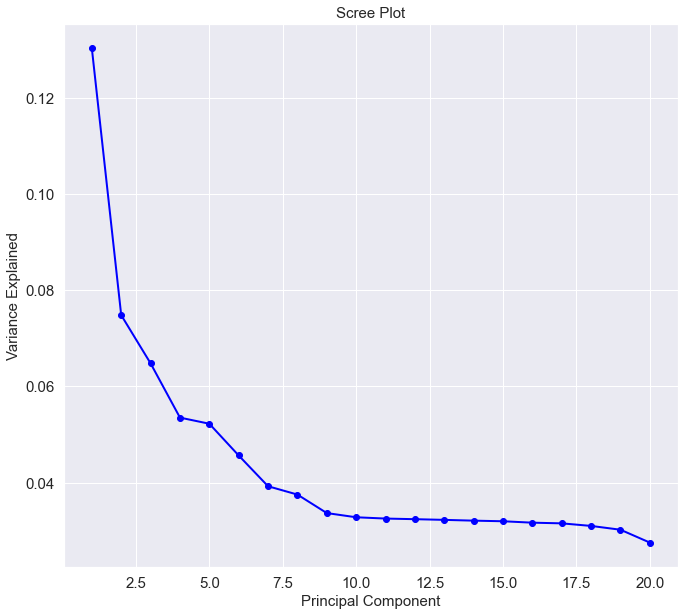

In [131]:
PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot', size=15)
plt.xticks(size = 15)
plt.yticks(size =15)
plt.xlabel('Principal Component', size = 15)
plt.ylabel('Variance Explained', size = 15)
plt.show()

Scree plot above indicates that at 9 PCs, any additional Principal component will have minimal increase in explained variance in the data. At 9 PC, only 45% of the data set is represented by the PC. As we want to explain 85% of the data, we continue with 20 Principal component. 

In [132]:
PC = pd.DataFrame(data = pcs, columns = ['pc1', 'pc2','pc3', 'pc4','pc5','pc6', 'pc7','pc8', 'pc9','pc10','pc11', 'pc12','pc13', 'pc14','pc15','pc16', 'pc17','pc18', 'pc19','pc20'])
PC.shape

(210401, 20)

### 4) Plot the transformed data on to the Prinicple Component axis to find clusters or groups
Now we attempt to cast the transformed data onto the new 2D subspace based on the first two principal components to analyse for patterns in the product data based on Nutrition Grade. This feature is added to the dataframe with principal components as a way to categorize the data points.

In [133]:
df_pca_final = pd.concat([PC.reset_index(drop=True), df_pca[['nutrition_grade_fr']].reset_index(drop=True)], axis=1)
df_pca_final

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,pc11,pc12,pc13,pc14,pc15,pc16,pc17,pc18,pc19,pc20,nutrition_grade_fr
0,2.677527,0.040963,-0.068289,-0.325806,0.427268,-0.566575,0.280839,-0.470407,-0.491117,0.068255,0.041630,0.033641,0.008353,0.084101,0.005924,-0.113557,-0.106007,0.249991,-0.293337,0.283503,d
1,-0.042652,0.156523,-0.537601,0.339748,0.089195,-1.767996,-0.508965,1.688184,-0.501862,0.019766,0.221750,-0.163846,0.171947,-0.028237,0.089214,-0.029581,-0.661660,0.546696,0.534464,-0.210102,b
2,2.205285,1.599883,-0.114111,-0.334128,0.874013,-0.943632,-0.402561,1.108004,-0.495394,0.000129,0.177762,-0.146409,0.136933,-0.179584,0.175180,-0.152623,-0.449079,0.545397,0.135444,-0.308448,d
3,-0.885267,-0.274785,-0.657489,0.415515,-0.165935,-1.539563,-0.368423,1.214703,-0.484273,0.071455,0.224017,-0.113252,0.132096,0.023921,0.060957,0.006554,-0.579735,0.417797,0.369417,-0.004133,N/A
4,-0.035755,0.154216,-0.696412,0.362440,0.020448,-1.748301,-0.540923,1.546632,-0.614106,0.053637,0.246256,-0.150039,0.175898,-0.041706,0.089983,0.021399,-0.674677,0.566721,0.483927,-0.157357,N/A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210396,-2.851285,0.751438,-0.858621,-0.421109,0.411689,-0.040593,0.507932,-0.923955,-0.809065,-0.213275,0.717021,1.159007,-0.444627,0.380709,-0.286865,0.126197,1.051893,1.078726,0.339249,-0.215372,N/A
210397,-3.104999,0.890761,-1.062896,-0.559047,0.550039,-0.050639,0.841050,-1.633829,-1.714172,-0.474173,1.648584,2.697566,-1.050873,0.906000,-0.691226,0.315638,2.639165,2.857065,1.000607,-1.209385,N/A
210398,-2.508036,0.614285,-0.652827,-0.334452,0.340044,-0.039935,0.268611,-0.357260,-0.115695,-0.020556,0.007835,-0.018048,0.018203,-0.023584,0.023121,-0.025145,-0.157156,-0.263390,-0.180608,0.517060,c
210399,-2.657269,0.644898,-0.702411,-0.315628,0.305891,-0.032911,0.253195,-0.381111,-0.116925,-0.013764,0.004650,-0.017537,0.018973,-0.020983,0.022353,-0.018670,-0.161903,-0.281180,-0.166495,0.544756,b


We will rank the correlation between each PCA component and the individual feature.

In [134]:
df_pca_features = pd.DataFrame(pca.components_, columns=  pca_no_cat[features].columns)
#df_pca_features.head()

In [135]:
df_pca_T = df_pca_features.transpose()  # Transpose the table

In [136]:
df_pca_T_sort = df_pca_T.rename(columns={0:"PCA_1",1:"PCA_2",2:"PCA_3",3:"PCA_4",4:"PCA_5",5:"PCA_6",6:"PCA_7",7:"PCA_8",8:"PCA_9",9:"PCA_10",10:"PCA_11",11:"PCA_12",12:"PCA_13",13:"PCA_14",14:"PCA_15",15:"PCA_16",16:"PCA_17",17:"PCA_18",18:"PCA_19",19:"PCA_20"})  # Change the column names
df_pca_T_sort.iloc[(-np.abs(df_pca_T_sort['PCA_1'].values)).argsort()][:15]

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,PCA_16,PCA_17,PCA_18,PCA_19,PCA_20
energy_100g,0.448533,0.015812,-0.024953,0.089519,-0.094783,-0.117102,-0.085582,0.048691,-0.028288,0.007263,0.015115,-0.012580,0.003615,0.016527,0.016055,-0.019916,-0.037856,0.062871,0.039251,-0.042029
nutrition-score-uk_100g,0.421366,-0.124939,0.171097,-0.090517,0.095390,0.105164,0.126134,-0.094292,0.056999,-0.025952,-0.000498,0.016832,-0.029484,0.007319,-0.003550,-0.039420,0.066923,-0.003683,-0.101814,-0.037703
nutrition-score-fr_100g,0.415059,-0.137844,0.172192,-0.092205,0.097015,0.101816,0.123757,-0.101324,0.059739,-0.030560,-0.006622,0.013348,-0.021740,0.003514,-0.001891,-0.036875,0.072273,-0.002694,-0.100686,-0.038844
fat_100g,0.380077,0.320220,-0.071927,-0.002376,-0.010450,0.028706,-0.082332,-0.090227,-0.046380,0.014715,0.000280,-0.014939,0.004287,-0.015477,0.025832,-0.005818,-0.019026,0.028492,-0.011833,-0.003362
saturated-fat_100g,0.366384,0.128770,0.048346,-0.142430,0.161343,0.119805,0.050289,-0.157470,-0.072928,0.029850,-0.024387,0.018417,-0.000132,-0.017985,-0.015405,0.006215,0.040690,-0.011662,-0.072094,0.057121
carbohydrates_100g,0.182136,-0.454155,0.023336,0.205636,-0.239944,-0.245345,-0.027352,0.103391,0.009421,0.021613,0.016187,0.004924,-0.006909,0.060468,-0.013988,-0.021187,-0.009890,0.060901,0.089004,-0.010318
proteins_100g,0.175325,0.191450,0.072710,-0.150516,0.319496,-0.033163,-0.050449,0.405137,0.029904,-0.003532,0.006083,-0.052240,0.023372,-0.030564,0.023956,-0.042768,-0.086734,0.077789,-0.014083,-0.175141
sugars_100g,0.159861,-0.469812,0.012525,0.133779,-0.219687,-0.175942,0.120609,-0.127756,0.049445,-0.061412,-0.025498,0.018475,-0.024721,0.063561,-0.038996,-0.002440,0.041676,-0.040349,0.065647,0.053374
fiber_100g,0.136857,0.009883,-0.023770,0.109983,0.004866,-0.377136,-0.203070,0.508228,-0.227140,0.010628,0.088057,-0.017985,0.061986,-0.069897,0.010853,0.102025,-0.141485,0.208601,0.151017,-0.160896
monounsaturated-fat_100g,0.128213,0.334194,-0.193854,0.215732,-0.313629,-0.033580,-0.209672,-0.191345,0.090792,-0.028585,-0.071653,0.009500,-0.032222,0.051907,0.050116,-0.034154,0.022148,-0.043079,0.095186,0.006267


The results in the table above confirms that nutrition scores, fats, carbohydrates, sugars and salt strongly correlates with the foods data on Open food fact. These features are the main drivers of the nutrition scores and they are the nutrients contained most frequently in the food products consumed worldwide. 

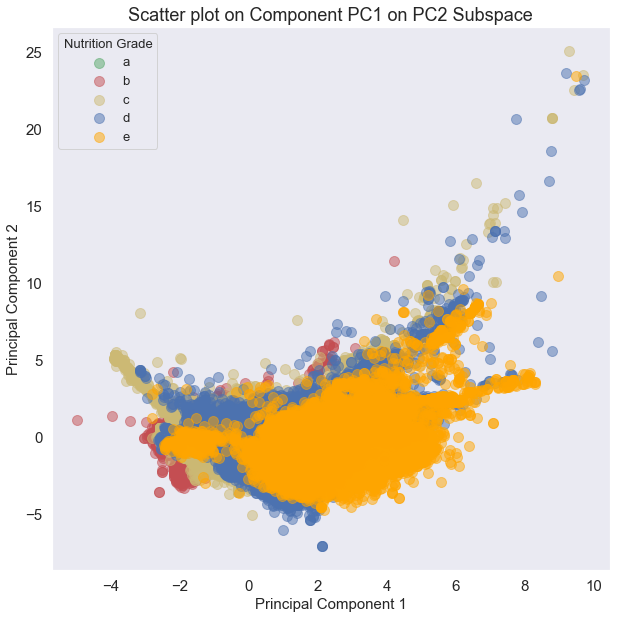

In [137]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('Scatter plot on Component PC1 on PC2 Subspace', fontsize = 18)
plt.xticks(size = 15)
plt.yticks(size =15)
#remove "N/A" grade in target as it is irrelevant with not grade given
targets = ['a', 'b','c','d','e']
colors = ['g', 'r','y','b','orange']

for target, color in zip(targets,colors):
    indicesToKeep = df_pca_final['nutrition_grade_fr'] == target
    ax.scatter(df_pca_final.loc[indicesToKeep, 'pc1']
               , df_pca_final.loc[indicesToKeep, 'pc2']
               , c = color
               , alpha = 0.5
               , s = 100)
ax.legend(targets)

#ax.set(ylim=(-30,25))
#ax.set(xlim=(-20,60))
plt.legend(targets, title="Nutrition Grade",title_fontsize=13, loc=2, fontsize=13, fancybox=True)
ax.grid()

In [138]:
#df2.groupby(["main_category"]).size().sort_values(ascending = False).head(200)

Principal Component 1 represents 13% of the relevant data. The data points mostly spread along the x axis,on principal component 1 indicates that this component can explained 13% of the variance in the data. The data also spreads vertically on the Prinicple Component 2 noted on the right side of the above plot. The observation above suggests that the products of different nutrition grade spread out similarly along the Principal component 1 with predominate amount of overlapping in this dimension. This indicates there is very week relationship between nutrition grade and the spread of the data variance. Since there are still many principal components and the limited expalined variance, we cannot determine any trends in the dataset yet. Rather we can conclude that the components are orthogonal to each other. None or most of the food products are similar as a whole since there is no evident group clustering.

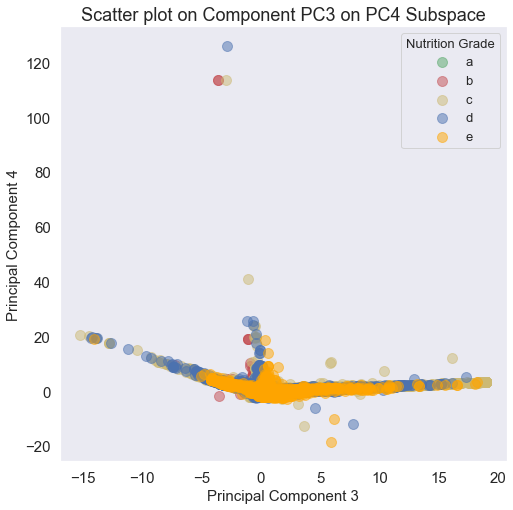

In [139]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 3', fontsize = 15)
ax.set_ylabel('Principal Component 4', fontsize = 15)
ax.set_title('Scatter plot on Component PC3 on PC4 Subspace', fontsize = 18)
plt.xticks(size = 15)
plt.yticks(size =15)
targets = ['a', 'b','c','d','e']
colors = ['g', 'r','y','b','orange']

for target, color in zip(targets,colors):
    indicesToKeep = df_pca_final['nutrition_grade_fr'] == target
    ax.scatter(df_pca_final.loc[indicesToKeep, 'pc3']
               , df_pca_final.loc[indicesToKeep, 'pc4']
               , c = color
               , alpha = 0.5
               , s = 100)
plt.legend(targets, title="Nutrition Grade",title_fontsize=13, loc=1, fontsize=13, fancybox=True)

ax.grid()

Casting the data onto the another set of Principal Component reveals that the products/ data point spreads across the Principal component 3 indicating a strong correlation and weakly correlated to Principal Component 4. There seems to be 3 outliers observed to be at the 120 range on Principal Component 4. The data behaves linearly and overlaps in all nutrition groups. 

#### Principal 1 explains 13%, Principal 2 explains 7% variance only.  The data set may need to be trimmed further more to eliminate the variance to reach a higher explained variance_ratio .

### 5) Create a scree plot to determine the minimum number of principal components to achieve 85% explained variance

In [141]:
def display_scree_plot(pca):
    '''Display a scree plot for the pca'''

    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),'o-', linewidth=2,c="red")
    plt.xlabel("Number of principal components", size = 15)
    plt.ylabel("Percentage explained variance", size = 15)
    plt.xticks(np.arange(0, 21, step=1),size = 15)
    plt.yticks(np.arange(0, 100, step=5),size = 15)
    plt.title('Scree plot - the number of PC for 88% explain variance', size = 18)
    plt.axhline(y=88, color='r', linestyle='-')
    plt.text(0.5, 89, '88% cut-off threshold', color = 'red', fontsize=13)
    plt.show(block=False)

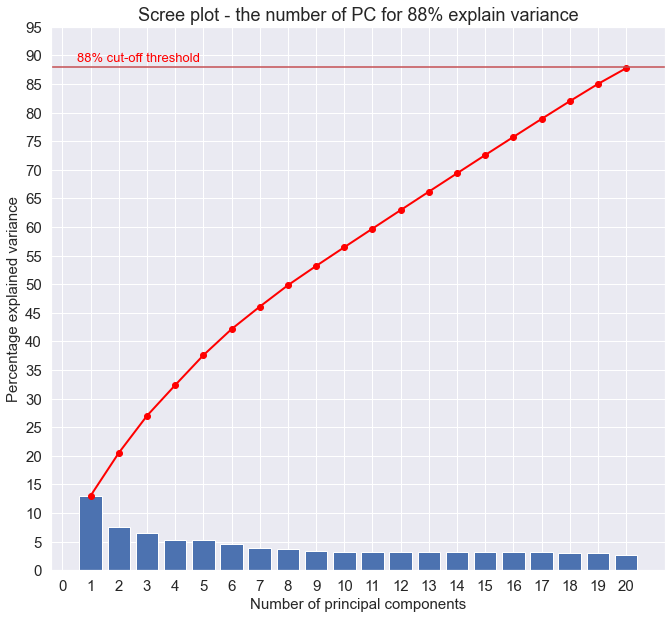

In [142]:
display_scree_plot(pca)

The scree plot again confirms 20 Principal Components are required in this PCA to achieve 85% explained variance.

### 6) Cast the features on the Variable Vector Map to for analysis

With the transformed features casted onto the Variable Vector map, we can analyse the loadings of the features against the selected principal components and how the features behaves with each other. 

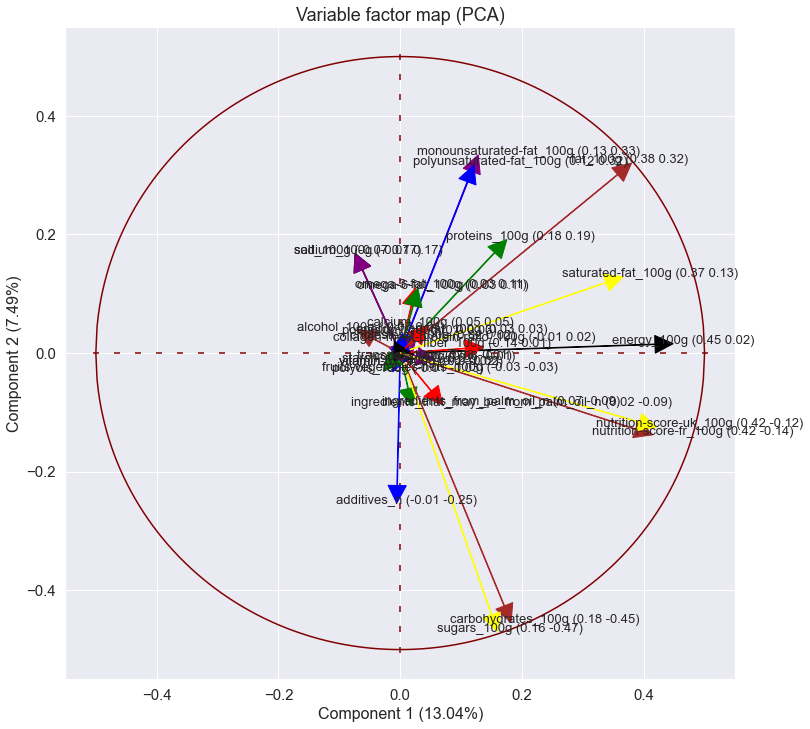

In [143]:
#Plot circle
#Create a list of 500 points with equal spacing between -1 and 1
import numpy as np
plt.figure(figsize=(12,12))
plt.rcParams.update({'font.size': 13})

#Plot smaller circle
x=np.linspace(start=-0.5,stop=0.5,num=500)
y_positive=lambda x: np.sqrt(0.5**2-x**2) 
y_negative=lambda x: -np.sqrt(0.5**2-x**2)
plt.plot(x,list(map(y_positive, x)), color='maroon')
plt.plot(x,list(map(y_negative, x)),color='maroon')

#Create broken lines
x=np.linspace(start=-0.5,stop=0.5,num=30)
plt.scatter(x,[0]*len(x), marker='_',color='maroon')
plt.scatter([0]*len(x), x, marker='|',color='maroon')

#Define color list
columns=cols
pca_values = pca.components_
colors = ['blue', 'red', 'green', 'black', 'purple', 'brown','yellow','purple']
if len(pca_values[0]) > 10:
    colors = colors*(int(len(pca_values[0])/10)+1)
   
    add_string=""
for i in range(len(pca_values[0])):
    xi=pca_values[0][i]
    yi=pca_values[1][i]
    plt.arrow(0,0,dx=xi, dy=yi, 
    head_width=0.03, head_length=0.03, 
    color=colors[i], length_includes_head=True)
    
    add_string=f" ({round(xi,2)} {round(yi,2)})"
    plt.text(pca_values[0, i]-0.10, 
    pca_values[1, i], 
      s=columns[i] + add_string )

plt.xticks(size = 15)
plt.yticks(size = 15)
plt.xlabel(f"Component 1 ({round(pca.explained_variance_ratio_[0]*100,2)}%)", size = 16)
plt.ylabel(f"Component 2 ({round(pca.explained_variance_ratio_[1]*100,2)}%)", size = 16)
plt.title('Variable factor map (PCA)', size = 18)
plt.show()

### Using a Heatmap to determine Correlation of Principal Components to individual Feature

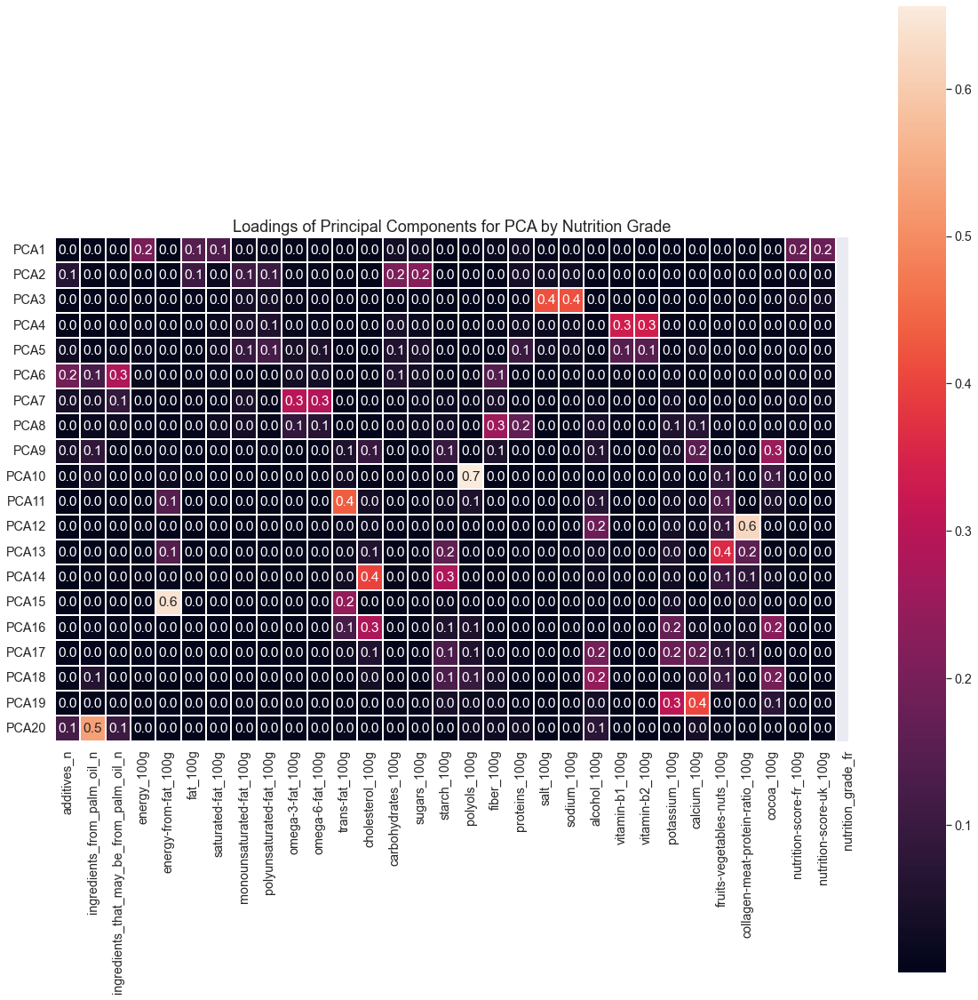

In [144]:
# Feature Weight
import matplotlib.pyplot as plt
sns.set(font_scale=1.3)
plt.figure(figsize=(20,20))
sns.heatmap(pca.components_**2,
                 yticklabels=["PCA"+str(x) for x in range(1,pca.n_components_+1)],
                 xticklabels=list(cols),
                 annot=True,
                 fmt='.1f',
                 square=True,
                 linewidths=.1,
                 cbar_kws={"orientation": "vertical"})
plt.title('Loadings of Principal Components for PCA by Nutrition Grade', fontsize = 18)
plt.show()

The heatmap shows the loading /explained variance with respect to each feature. The higher the number closest to 1, the more variance is explained by the specific Principal Component. We can see that even after the compression through PCA, energy, sugar, fat features takes significant weight on the first 2 PCs based on the > 0.1 correlation coefficient.  

From the vector map above using the first two principal components that capture maximum variance out of the 20, there are pairs of feature with similar vector direction and behavior. They are carbohydrates and sugars, nutrition scores uk and nutirition scores fr, monosaturated_fat and polysaturated fat, omega 3 fat and omega 6 fat, sodium and salt. On this subspace they appear to overlap only but it is likely to be different in other 2D space with respect to different pairs of Principle Components. 
The length of the vector corresponds to how strongly the component explains the variance in the feature.
Energy, fat, nutrition score uk and nutrition score uk  all correlates strongly to principal component 1 with a position trend. Notably, energy does not correlate to component 2 with a near zero explained variance on PC2. 
Carbohydrate and sugar seems to have significant variance explained by principal component 2 in the negatively direction while fat correlate to component 2 strongly positively. Interestingly, the salt and sodium is in the oppositie direction of sugar which reveals the features grows inversely of each other. Note that none of the explained variance (vectors) reach over 0.5 on either component which suggests both principal component was not able to retain enough variance to explain the original data greatly, even if they were the one to explain the maximum variance throught PCA. 

One can conclude that overall there needs to be more standardized product entry on Open food fact data. Nutrient information and completion of data entry should be required as the item should physically be present in the hands of the entry maker. The product entry should only be saved once all required fields are filled. 

#### Since the PCA did not find a component that strongly describes the variance of data. We will attempt to apply PCA with respect to  by 'pnns_groups_1' feature, which is food groups to categorize the data.  

The same approach and steps will be identical to first PCA results above.

In [145]:
df_pca2 = pd.concat([df_num2, df_nutri[['pnns_groups_1']]], axis = 1)
#df_pca2.drop(df_pca[df_pca.pnns_groups_1 == "N/A"].index, inplace=True)
pca_no_cat2 = df_pca2.drop(['pnns_groups_1'], axis=1)
cols2 = df_pca2.columns 
no_scores_features2 = cols2.drop(['pnns_groups_1'])
features2 = list(no_scores_features2)# list(filteredColumns_num.index)
#pca_no_cat2[features2]

In [146]:
x2 = df_pca2.loc[:, features2].values
y2 = df_pca2.loc[:,['pnns_groups_1']].values
x2 = StandardScaler().fit_transform(x2)

In [147]:
pca2 = PCA(n_components=0.85)
pcs2 = pca2.fit_transform(x2)
pcs2.shape

#pcs2
#print(pca2.components_)

(210401, 20)

In [148]:
print(pca2.explained_variance_)
print(pca2.explained_variance_ratio_)

[4.04253378 2.32045514 2.00928112 1.65908482 1.61951098 1.41451667
 1.21593685 1.1621919  1.04278275 1.01568002 1.00736584 1.00333007
 0.99892529 0.99386845 0.98995073 0.9807732  0.9764442  0.95981078
 0.93523224 0.85222502]
[0.1304037  0.07485304 0.06481521 0.05351861 0.05224204 0.04562935
 0.03922358 0.03748988 0.03363799 0.03276372 0.03249552 0.03236533
 0.03222324 0.03206012 0.03193374 0.03163769 0.03149805 0.03096149
 0.03016864 0.027491  ]


In [149]:
PC2 = pd.DataFrame(data = pcs2, columns = ['pc1', 'pc2','pc3', 'pc4','pc5','pc6', 'pc7','pc8', 'pc9','pc10','pc11', 'pc12','pc13', 'pc14','pc15','pc16', 'pc17','pc18', 'pc19','pc20'])
df_pca_final2 = pd.concat([PC2.reset_index(drop=True), df_pca2[['pnns_groups_1']].reset_index(drop=True)], axis=1)

The second attempt in applying PCA resulted the same as the first at 20 principal components required to explain 85% of the data variance. Therefore using another feature to categoeize the data did not increase the % variance explained in the model. We will proceed to plot the food data on the 2D PC1 and PC2 subspace. 

In [150]:
df_pca_final2.dropna(inplace = True)
#df_pca_final2.tail(200)

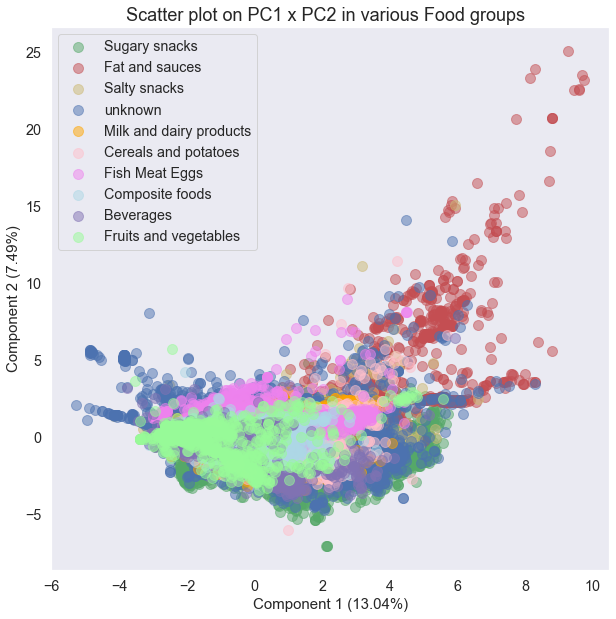

In [151]:
fig = plt.figure(figsize = (10,10))
ax2 = fig.add_subplot(1,1,1) 
plt.xlabel(f"Component 1 ({round(pca2.explained_variance_ratio_[0]*100,2)}%)", size = 15)
plt.ylabel(f"Component 2 ({round(pca2.explained_variance_ratio_[1]*100,2)}%)", size = 15)
ax2.set_title('Scatter plot on PC1 x PC2 in various Food groups  ', fontsize = 18)

#remove "N/A" grade in target as it is irrelevant with not grade given
targets2 = ['Sugary snacks', 'Fat and sauces','Salty snacks','unknown','Milk and dairy products','Cereals and potatoes','Fish Meat Eggs','Composite foods','Beverages','Fruits and vegetables']
colors2 = ['g', 'r','y','b','orange','pink','violet','lightblue','m','palegreen']

for target, color in zip(targets2,colors2):
    indicesToKeep2 = df_pca_final2['pnns_groups_1'] == target
    ax2.scatter(df_pca_final2.loc[indicesToKeep2, 'pc1']
               , df_pca_final2.loc[indicesToKeep2, 'pc2']
               , c = color
               , alpha = 0.5
               , s = 100)
ax2.legend(targets2)
ax2.grid()

The scatterplot of the products data casted on the principal component subspace categorized by food groups above appears the same as the previous attempt with nutrition grade groups. The shape and spread of the plot looks identical. However, the data is categorized by the different colours of the food groups. 

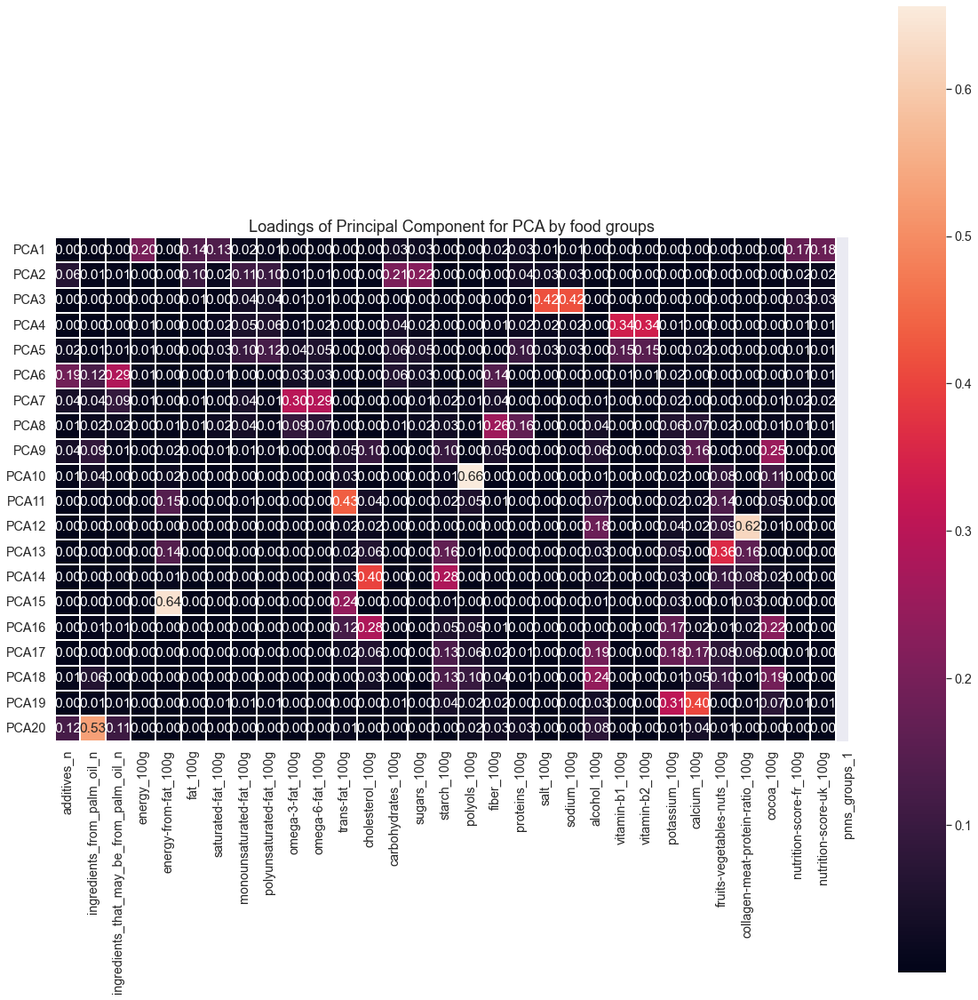

In [152]:
plt.figure(figsize=(20,20))
sns.set(font_scale=1.3)
_ = sns.heatmap(pca2.components_**2,
                 yticklabels=["PCA"+str(x) for x in range(1,pca2.n_components_+1)],
                 xticklabels=list(cols2),
                 annot=True,
                 fmt='.2f',
                 square=True,
                 linewidths=.1,
                 cbar_kws={"orientation": "vertical"})
plt.title('Loadings of Principal Component for PCA by food groups', fontsize = 18)
plt.show()

With reference to heatmap based on food groups above, showing the PCA component loadings to each feature, PC1 is strongly correlated to fats, saturated fats and energy and PC2 strongly correlates to sugars and carbohydrates. In reference to the Variable Vector Map, both PC1 and PC2 components explained a significant portion of variance for fats and sauces with a positive trend compared to other food groups. A main cluster is observed spreading along PC1 but lays flat at zero against PC2 which means majority of the food groups correlates less to sugar and carbohydrates and more to fats and energy.

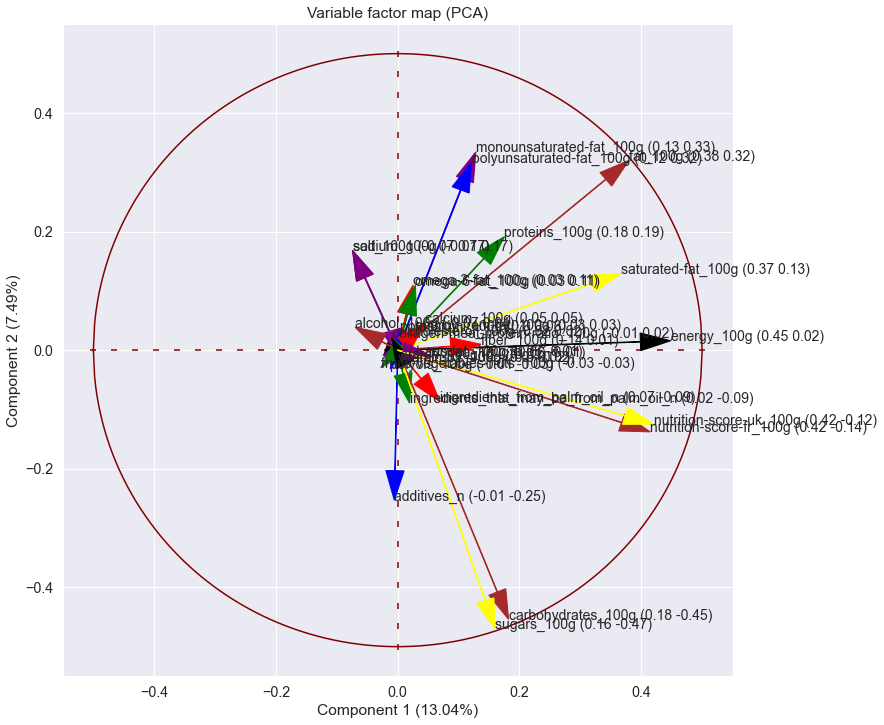

In [153]:
#Plot circle
#Create a list of 500 points with equal spacing between -1 and 1
import numpy as np
plt.figure(figsize=(12,12))
plt.rcParams.update({'font.size': 14})

#x=np.linspace(start=-1,stop=1,num=500)
#Find y1 and y2 for these points
#y_positive=lambda x: np.sqrt(1-x**2) 
#y_negative=lambda x: -np.sqrt(1-x**2)
#plt.plot(x,list(map(y_positive, x)), color='maroon')
#plt.plot(x,list(map(y_negative, x)),color='maroon')

#Plot smaller circle
x=np.linspace(start=-0.5,stop=0.5,num=500)
y_positive=lambda x: np.sqrt(0.5**2-x**2) 
y_negative=lambda x: -np.sqrt(0.5**2-x**2)
plt.plot(x,list(map(y_positive, x)), color='maroon')
plt.plot(x,list(map(y_negative, x)),color='maroon')

#Create broken lines
x=np.linspace(start=-0.5,stop=0.5,num=30)
plt.scatter(x,[0]*len(x), marker='_',color='maroon')
plt.scatter([0]*len(x), x, marker='|',color='maroon')

#Define color list
columns=cols2
pca_values2 = pca2.components_
colors = ['blue', 'red', 'green', 'black', 'purple', 'brown','yellow','purple']
if len(pca_values2[1]) > 10:
    colors = colors*(int(len(pca_values2[0])/10)+1)
   
    add_string=""
for i in range(len(pca_values2[0])):
    xi=pca_values2[0][i]  #<---change according to component
    yi=pca_values2[1][i] #<---change according to component
    plt.arrow(0,0,dx=xi, dy=yi, 
    head_width=0.03, head_length=.05, 
    color=colors[i], length_includes_head=True)
    
    add_string=f" ({round(xi,2)} {round(yi,2)})"
    plt.text(pca_values2[0, i],  #<---change according to component
    pca_values2[1, i] ,         #<---change according to component
      s=columns[i] + add_string )

plt.xlabel(f"Component 1 ({round(pca2.explained_variance_ratio_[0]*100,2)}%)") #<---change according to component
plt.ylabel(f"Component 2 ({round(pca2.explained_variance_ratio_[1]*100,2)}%)") #<---change according to component
plt.title('Variable factor map (PCA)')
plt.show()

Completing PCA by Food groups provided the insights to how each food category relates to the features such as sugar and fat represented by principal component. Since PC1 relates stronger to fats and nutrition scores and PC2 relates stronger to surgars and carbohydrate, one could tell that citizens consume more sugar and fatty foods and high energy foods as shown with larger eigenvalues( vectors on the variable vector map) as compared to proteins or calcium or healthy fats such as omega 3 or omega 6.  

### Extract only significant Nutritients to improve results

In [154]:
df_nutri.describe()

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,montanic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
count,210401.000000,210401.00000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.0,210401.000000,210401.000000,210401.0,210401.0,210401.0,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.0,210401.000000,210401.00000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,2.104010e+05,2.104010e+05,2.104010e+05,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000,210401.000000
mean,2.044781,0.02135,0.057352,1166.495426,2.310710,13.896366,4.971107,0.0,0.000028,0.000453,0.0,0.0,0.0,3.041811e-07,0.000290,1.031802,0.611926,0.010691,0.001919,0.000148,0.000149,0.013190,0.002404,0.000002,0.0,0.003029,0.00150,0.041228,0.012196,32.126698,16.448649,0.004052,0.000333,0.004183,0.007849,0.000358,0.000636,0.031208,0.093787,1.820064,6.735486,0.000598,0.000191,9.272770e-07,1.754388,0.690703,0.153503,0.000239,0.000083,2.516847e-07,0.000330,0.000149,0.008738,0.011862,0.010708,0.000711,0.000579,0.000039,0.000515,0.000002,8.339865e-08,0.000679,0.000002,0.000046,0.030728,0.000069,0.060659,0.006140,0.001918,0.003550,0.000103,0.000323,0.000012,0.000005,0.000017,1.602006e-07,2.091530e-08,5.210253e-07,0.000559,0.000020,0.001496,0.278766,0.010642,0.213319,0.005594,9.289647,9.250065
std,2.563678,0.14628,0.272774,808.201318,58.006809,17.733486,7.660505,0.0,0.012819,0.146820,0.0,0.0,0.0,1.395263e-04,0.132986,6.044500,3.814857,0.345665,0.245154,0.039885,0.028236,0.678801,0.194368,0.000381,0.0,0.405544,0.27801,0.655816,0.261383,29.416498,21.754187,0.337716,0.075419,0.480644,0.553449,0.116030,0.105196,1.231007,2.613174,3.546100,8.236684,0.062280,0.028610,1.430359e-04,6.709279,2.641440,1.879629,0.059249,0.032745,6.586986e-05,0.054652,0.068128,0.374193,0.428780,0.286856,0.063784,0.202268,0.013742,0.151105,0.000875,1.274965e-0

Based on the observed Variable vector map, let's extract the features with largest arrows that indicate a high explained variance by the principal components for further analysis. They are salt_100g', 'sodium_100g', 'proteins_100g', 'fat_100g', 'saturated-fat_100g', 'energy_100g', 'nutrition-score-uk_100g', 'nutrition-score-fr_100g', 'carbohydrates_100g', 'sugars_100g', 'additives_n', 'omega-3-fat_100g', 'omega-6-fat_100g', 'monounsaturated-fat_100g', 'polyunsaturated-fat_100g. 

In [155]:
list_imp_features = ['salt_100g', 'sodium_100g', 'proteins_100g', 'fat_100g', 'saturated-fat_100g', 'energy_100g', 'nutrition-score-uk_100g', 'nutrition-score-fr_100g', 'carbohydrates_100g', 'sugars_100g', 'additives_n', 'omega-3-fat_100g', 'omega-6-fat_100g', 'monounsaturated-fat_100g', 'polyunsaturated-fat_100g']
df_imp = df_num2[list_imp_features]

In [156]:
#Prepare a new dataframe for the important features with the food groups label. The dataframe will have 16 columns. 
df_pca3 = pd.concat([df_imp, df_nutri[['pnns_groups_1']]], axis = 1)
df_pca3

,salt_100g,sodium_100g,proteins_100g,fat_100g,saturated-fat_100g,energy_100g,nutrition-score-uk_100g,nutrition-score-fr_100g,carbohydrates_100g,sugars_100g,additives_n,omega-3-fat_100g,omega-6-fat_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,pnns_groups_1
1,0.00000,0.000,3.57,28.57,28.57,2243.0,14.0,14.0,64.29,14.29,0.0,0.0,0.0,0.0,0.0,N/A
2,0.63500,0.250,17.86,17.86,0.00,1941.0,0.0,0.0,60.71,17.86,0.0,0.0,0.0,0.0,0.0,N/A
3,1.22428,0.482,17.86,57.14,5.36,2540.0,12.0,12.0,17.86,3.57,0.0,0.0,0.0,0.0,0.0,N/A
4,0.00000,0.000,8.57,1.43,0.00,1552.0,0.0,0.0,77.14,0.00,0.0,0.0,0.0,0.0,0.0,N/A
5,0.00000,0.000,13.46,18.27,1.92,1933.0,0.0,0.0,63.46,11.54,0.0,0.0,0.0,0.0,0.0,N/A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320753,0.00000,0.000,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,N/A
320761,0.00000,0.000,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,N/A
320763,0.02540,0.010,0.50,0.20,0.20,21.0,0.0,2.0,0.50,0.50,0.0,0.0,0.0,0.0,0.0,Beverages
320768,0.00000,0.000,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,N/A


In [157]:
#Create a list of column name with out food group columns
cols3 = df_pca3.columns 
no_scores_features = cols3.drop(['pnns_groups_1'])
features3 = list(no_scores_features)
#features3
#pca_no_cat[features3]

In [158]:
#Get all values in the nutrients (numerical) columns and the food group column into 2 arrays
s = df_pca3.loc[:, features3].values
t = df_pca3.loc[:,['pnns_groups_1']].values

In [159]:
#Fit the nutrients datas and standardize the values
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
#Performa PCA with the standardized data. Find the the number of PCA that explains 99% variance of the nutrients data.

s = StandardScaler().fit_transform(s)
pca3 = PCA(n_components=0.99)
pcs3 = pca3.fit_transform(s)
pcs3.shape

print(pca3.explained_variance_)
print(pca3.explained_variance_ratio_)

[3.92876302 2.29120067 2.00110903 1.5904525  1.21449808 0.93476021
 0.79299759 0.70238944 0.54425267 0.41988483 0.31728588 0.21795889]
[0.26191629 0.15274599 0.13340663 0.10602966 0.08096615 0.06231705
 0.05286625 0.04682574 0.03628334 0.02799219 0.02115229 0.01453052]


Since we reduce the nutrient data to 15 columns, PCA is able to compress the data to 12 principal componenets where the explained variance for both PC1 and PC2 have improved to 45%  from 20%.

In [160]:
PC3 = pd.DataFrame(data = pcs3, columns = ['pc1', 'pc2','pc3', 'pc4','pc5','pc6', 'pc7','pc8','pc9','pc10', 'pc11','pc12'])

In [161]:
#create a new dataframe to add food group column to the PCA results. 
df_pca_final3 = pd.concat([PC3.reset_index(drop=True), df_pca3[['pnns_groups_1']].reset_index(drop=True)], axis=1)

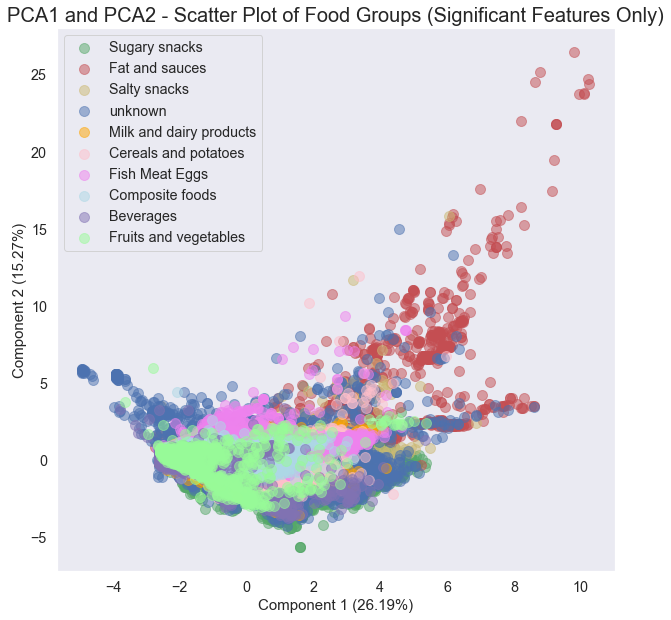

In [162]:
# Plot the results on a scatterplot with colours representing difference food groups
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
#ax.set_xlabel('Principal Component 1', fontsize = 18)
#ax.set_ylabel('Principal Component 2', fontsize = 18)
plt.xlabel(f"Component 1 ({round(pca3.explained_variance_ratio_[0]*100,2)}%)", size = 15)
plt.ylabel(f"Component 2 ({round(pca3.explained_variance_ratio_[1]*100,2)}%)", size = 15)

ax.set_title('PCA1 and PCA2 - Scatter Plot of Food Groups (Significant Features Only)', fontsize = 20)

#remove "N/A" grade in target as it is irrelevant with not grade given
targets3 = ['Sugary snacks', 'Fat and sauces','Salty snacks','unknown','Milk and dairy products','Cereals and potatoes','Fish Meat Eggs','Composite foods','Beverages','Fruits and vegetables']
colors3 = ['g', 'r','y','b','orange','pink','violet','lightblue','m','palegreen']

for target, color in zip(targets3,colors3):
    indicesToKeep = df_pca_final3['pnns_groups_1'] == target
    ax.scatter(df_pca_final3.loc[indicesToKeep, 'pc1']
               , df_pca_final3.loc[indicesToKeep, 'pc2']
               , c = color
               , alpha = 0.5
               , s = 100)
ax.legend(targets3)
ax.grid()

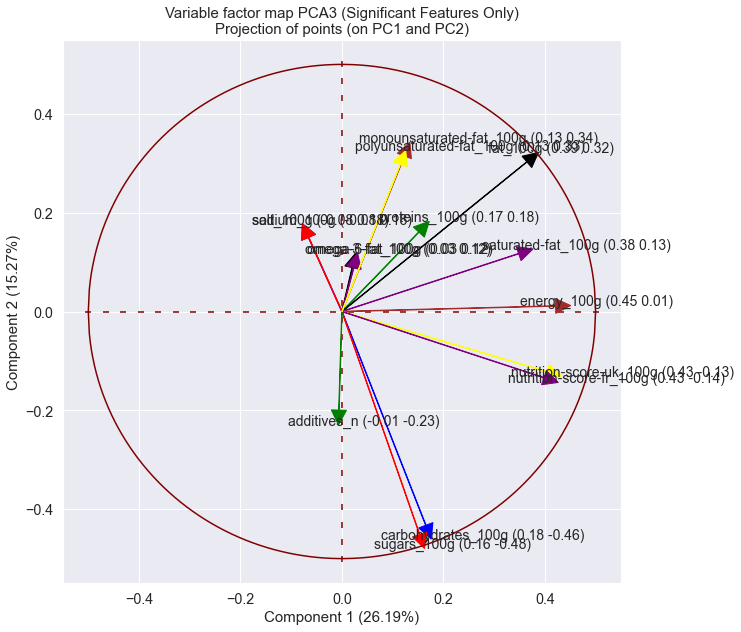

In [163]:
#Plot circle
#Create a list of 500 points with equal spacing between -1 and 1
import numpy as np
plt.figure(figsize=(10,10))
#plt.rcParams.update({'font.size': 13})

#Plot smaller circle
x=np.linspace(start=-0.5,stop=0.5,num=500)
y_positive=lambda x: np.sqrt(0.5**2-x**2) 
y_negative=lambda x: -np.sqrt(0.5**2-x**2)
plt.plot(x,list(map(y_positive, x)), color='maroon')
plt.plot(x,list(map(y_negative, x)),color='maroon')

#Create broken lines
x=np.linspace(start=-0.5,stop=0.5,num=30)
plt.scatter(x,[0]*len(x), marker='_',color='maroon')
plt.scatter([0]*len(x), x, marker='|',color='maroon')

#Define color list
columns=cols3
pca_values3 = pca3.components_
colors = ['blue', 'red', 'green', 'black', 'purple', 'brown','yellow','purple']
if len(pca_values3[0]) > 10:
    colors = colors*(int(len(pca_values3[0])/10)+1)
   
    add_string=""
for i in range(len(pca_values3[0])):
    xi=pca_values3[0][i]
    yi=pca_values3[1][i]
    plt.arrow(0,0,dx=xi, dy=yi, 
    head_width=0.03, head_length=0.03, 
    color=colors[i], length_includes_head=True)
    
    add_string=f" ({round(xi,2)} {round(yi,2)})"
    plt.text(pca_values3[0, i]-0.10, 
    pca_values3[1, i], 
      s=columns[i] + add_string )

plt.xlabel(f"Component 1 ({round(pca3.explained_variance_ratio_[0]*100,2)}%)", size = 15)
plt.ylabel(f"Component 2 ({round(pca3.explained_variance_ratio_[1]*100,2)}%)", size = 15)
plt.title('Variable factor map PCA3 (Significant Features Only)')
plt.title("Variable factor map PCA3 (Significant Features Only)" + "\n" +  "Projection of points (on {} and {})".format(PC3.columns[0].upper(), PC3.columns[1].upper()), size = 15)
plt.show()

Extracting only the significant features on the vector map was effective in increasing the explained variance to 41.5% by PC1 and PC2. 
The PCA components have been reduced to 12 (above) from 20 components (original data). The shape and spread of the the scatterplot in the Principal Component 1 and Principal compoent 2 subspace was mostly retained. We can recognize that PC1 still explained variance most for nutrition scores, energy and fats (longest arrows on the vector map above) while PC2 explained variance on sugars, carbohydrates, salt and mono-unsaturated fat and polyunsaturated fats. We have successfuly increase clarity of the features while retaining the essential PCA results.  

We will continue to use this PCA results with significant features only for further analysis.

For a different view of the product data in the subspace of PC 3 (correlates to Sodium / Salt) and PC4 (correlates to unsaturated fats and proteins)

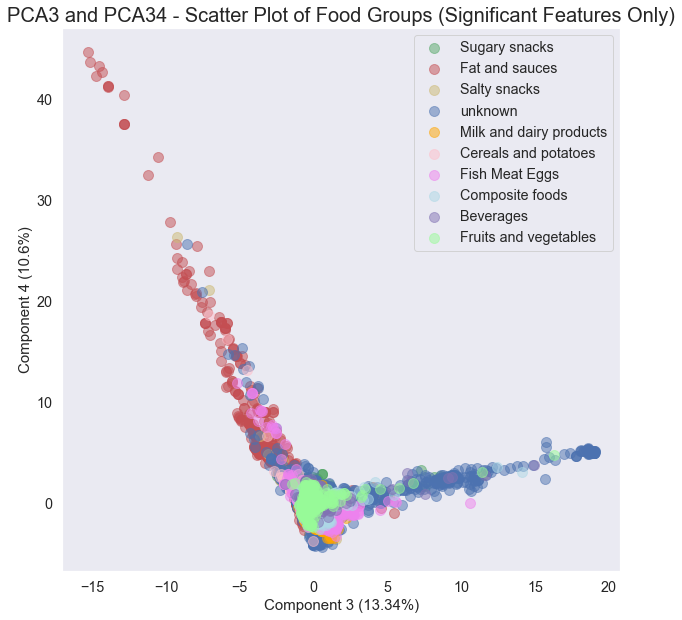

In [164]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
#ax.set_xlabel('Principal Component 1', fontsize = 18)
#ax.set_ylabel('Principal Component 2', fontsize = 18)
plt.xlabel(f"Component 3 ({round(pca3.explained_variance_ratio_[2]*100,2)}%)", size = 15)
plt.ylabel(f"Component 4 ({round(pca3.explained_variance_ratio_[3]*100,2)}%)", size = 15)

ax.set_title('PCA3 and PCA34 - Scatter Plot of Food Groups (Significant Features Only)', fontsize = 20)

#remove "N/A" grade in target as it is irrelevant with not grade given
targets3 = ['Sugary snacks', 'Fat and sauces','Salty snacks','unknown','Milk and dairy products','Cereals and potatoes','Fish Meat Eggs','Composite foods','Beverages','Fruits and vegetables']
colors3 = ['g', 'r','y','b','orange','pink','violet','lightblue','m','palegreen']

for target, color in zip(targets3,colors3):
    indicesToKeep = df_pca_final3['pnns_groups_1'] == target
    ax.scatter(df_pca_final3.loc[indicesToKeep, 'pc3']
               , df_pca_final3.loc[indicesToKeep, 'pc4']
               , c = color
               , alpha = 0.5
               , s = 100)
ax.legend(targets3)
ax.grid()

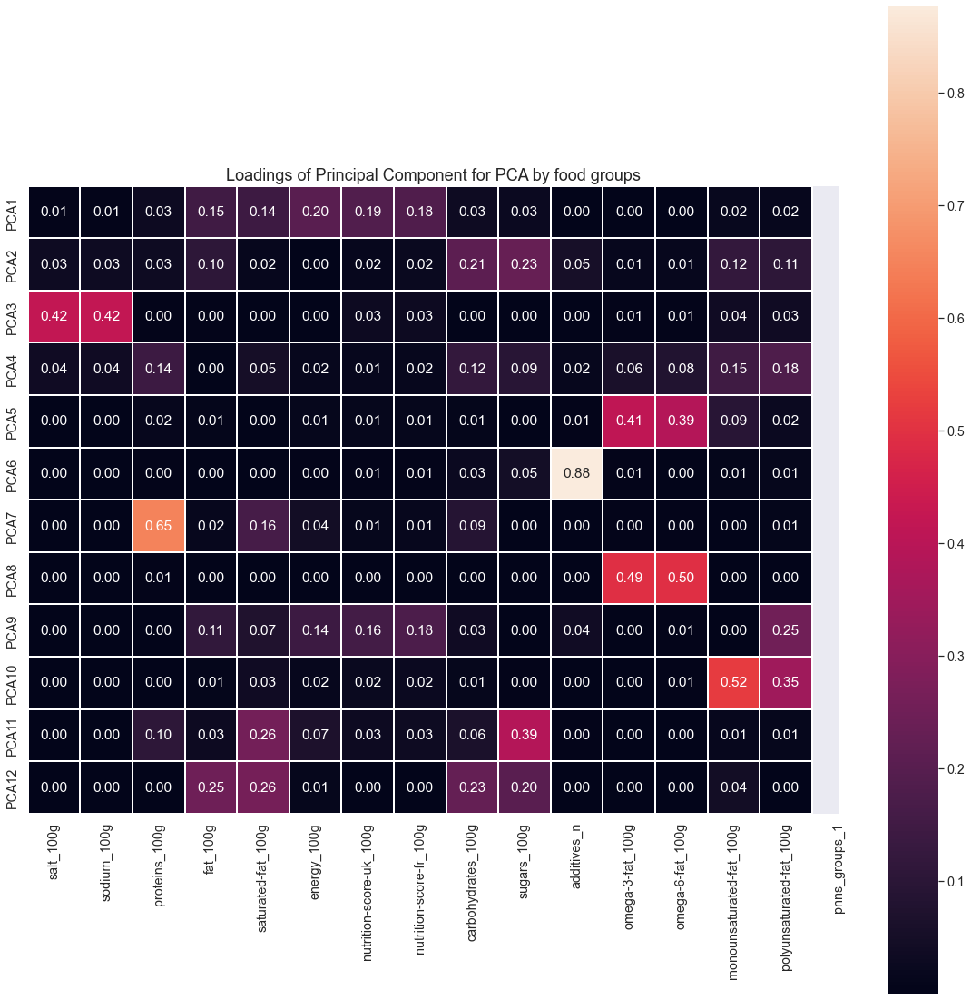

In [165]:
plt.figure(figsize=(20,20))
sns.set(font_scale=1.3)
_ = sns.heatmap(pca3.components_**2,
                 yticklabels=["PCA"+str(x) for x in range(1,pca3.n_components_+1)],
                 xticklabels=list(cols3),
                 annot=True,
                 fmt='.2f',
                 square=True,
                 linewidths=.1,
                 cbar_kws={"orientation": "vertical"})
plt.title('Loadings of Principal Component for PCA by food groups', fontsize = 18)
plt.show()

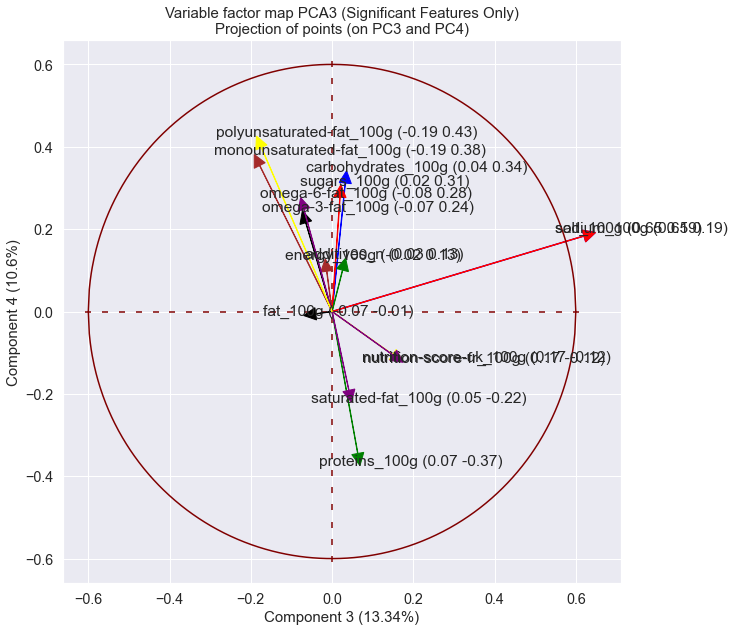

In [166]:
#Plot circle
#Create a list of 500 points with equal spacing between -1 and 1
import numpy as np
plt.figure(figsize=(10,10))
#plt.rcParams.update({'font.size': 13})

#Plot smaller circle
x=np.linspace(start=-0.6,stop=0.6,num=500)
y_positive=lambda x: np.sqrt(0.6**2-x**2) 
y_negative=lambda x: -np.sqrt(0.6**2-x**2)
plt.plot(x,list(map(y_positive, x)), color='maroon')
plt.plot(x,list(map(y_negative, x)),color='maroon')

#Create broken lines
x=np.linspace(start=-0.6,stop=0.6,num=30)
plt.scatter(x,[0]*len(x), marker='_',color='maroon')
plt.scatter([0]*len(x), x, marker='|',color='maroon')

#Define color list
columns=cols3
pca_values3 = pca3.components_
colors = ['blue', 'red', 'green', 'black', 'purple', 'brown','yellow','purple']
if len(pca_values3[0]) > 10:
    colors = colors*(int(len(pca_values3[0])/10)+1)
   
    add_string=""
for i in range(len(pca_values3[0])):
    xi=pca_values3[2][i]
    yi=pca_values3[3][i]
    plt.arrow(0,0,dx=xi, dy=yi, 
    head_width=0.03, head_length=0.03, 
    color=colors[i], length_includes_head=True)
    
    add_string=f" ({round(xi,2)} {round(yi,2)})"
    plt.text(pca_values3[2, i]-0.10, 
    pca_values3[3, i], 
      s=columns[i] + add_string )

plt.xlabel(f"Component 3 ({round(pca3.explained_variance_ratio_[2]*100,2)}%)", size = 15)
plt.ylabel(f"Component 4 ({round(pca3.explained_variance_ratio_[3]*100,2)}%)", size = 15)
plt.title('Variable factor map PCA3 (Significant Features Only)')
plt.title("Variable factor map PCA3 (Significant Features Only)" + "\n" +  "Projection of points (on {} and {})".format(PC3.columns[2].upper(), PC3.columns[3].upper()), size = 15)
plt.show()

Looking at the spread of data in the PC3 and PC44 subspace, there are 2 linear trend exhibited but the scatterplot. One trend shows a negative linear trend formed by datapoints in the fats and sauces group on PC4 against PC3.This means that the fat and sauces products are correlated with polyunsaturated fats and monounsaturated fats (PC4) and salt (PC3) according to the vector map and heatmap above. The second trend described is the postive trend in the 'unknown' food group. This food group seems to be described by PC3 salt the most. Saturated fat and proteins are also represented by the long vectors above indicating that PC4 is deccribing foods with some of each nutrient.
We can tell that a many food products that citizens consume contains salt, unsaturated fats and protein. 

### Performing a K-means Clustering for further Analysis 
We will keep 12 principal components that we have reviewed previously to perform clustering It explains 85 % of the data variation.

### Steps to completing Kmeans clustering 
<pre><b>Perform the k-means clustering to create a list of clusters</b>

<b><u>Plotting Kmeans Clustering</u>
1.Create an elbow chart
2.Determine the number of clusters the data set needs
3.Apply Kmean model from Sklearn library </b>
  Calculate the distance of all observation to each of the centroids
  Assign observations to the closest centroid
  Find the new location of the centroid by taking the mean of all the observations in each cluster
  Repeat steps 3-5 until the centroids do not change position
4.<b>Randomly assign a centroid to each of the clusters

5.Plotting the clustering results</b> </pre>

### 1.Find the clusters using Kmeans model

In [167]:
# Import the kmeans algorithm
from sklearn.cluster import KMeans
X_o = df_pca3.loc[:, features3].values
X_df = df_pca3.loc[:, features3]
x = StandardScaler().fit_transform(X_o)


Here we have defined which cluster each product belongs by the Cluster column.

#### 1.Create an elbow chart

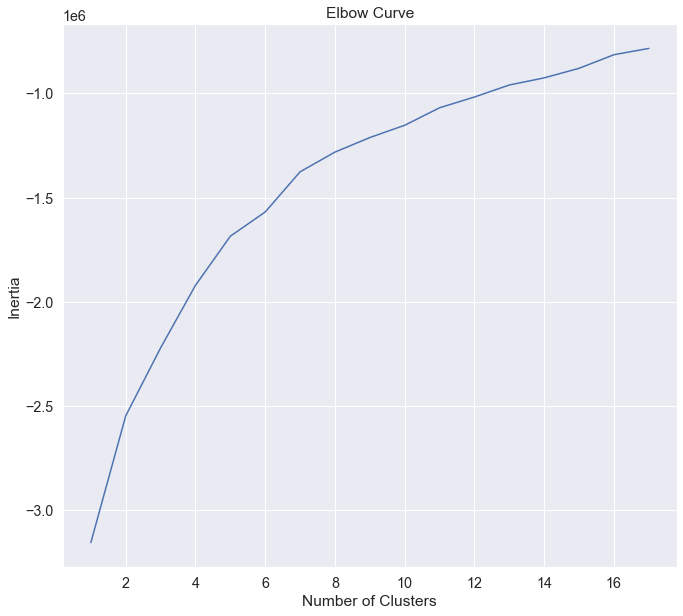

In [168]:
# Run a number of tests, for 1, 2, ... num_clusters
num_clusters = 18
kmeans_tests = [KMeans(n_clusters=i, init='k-means++', n_init=5) for i in range(1, num_clusters)]
score = [kmeans_tests[i].fit(x).score(x) for i in range(len(kmeans_tests))]

# Plot the curve
plt.plot(range(1, num_clusters),score)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Curve')
plt.show()

### 2.Determine the number of clusters the data set needs
From the elbow curve above, the inertia or sum or square error is reduced at 5 cluster. 

### 3.Apply Kmean model from Sklearn library

In [169]:
# Create a k-means clustering model using 5 clusters
kmeans = KMeans(init='k-means++', n_clusters=5, n_init=10)

# Fit the data to the model
kmeans.fit(x)

# Determine which clusters each data point belong to:
clusters =  kmeans.predict(x)

# Add cluster number to the original data
X_scaled_clustered = df_pca3
X_scaled_clustered['cluster'] = clusters
X_scaled_clustered

,salt_100g,sodium_100g,proteins_100g,fat_100g,saturated-fat_100g,energy_100g,nutrition-score-uk_100g,nutrition-score-fr_100g,carbohydrates_100g,sugars_100g,additives_n,omega-3-fat_100g,omega-6-fat_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,pnns_groups_1,cluster
1,0.00000,0.000,3.57,28.57,28.57,2243.0,14.0,14.0,64.29,14.29,0.0,0.0,0.0,0.0,0.0,N/A,4
2,0.63500,0.250,17.86,17.86,0.00,1941.0,0.0,0.0,60.71,17.86,0.0,0.0,0.0,0.0,0.0,N/A,2
3,1.22428,0.482,17.86,57.14,5.36,2540.0,12.0,12.0,17.86,3.57,0.0,0.0,0.0,0.0,0.0,N/A,4
4,0.00000,0.000,8.57,1.43,0.00,1552.0,0.0,0.0,77.14,0.00,0.0,0.0,0.0,0.0,0.0,N/A,0
5,0.00000,0.000,13.46,18.27,1.92,1933.0,0.0,0.0,63.46,11.54,0.0,0.0,0.0,0.0,0.0,N/A,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320753,0.00000,0.000,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,N/A,0
320761,0.00000,0.000,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,N/A,0
320763,0.02540,0.010,0.50,0.20,0.20,21.0,0.0,2.0,0.50,0.50,0.0,0.0,0.0,0.0,0.0,Beverages,0
320768,0.00000,0.000,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,N/A,0


### Plotting PCA results using Kmeans Clustering

### 4. Randomly assign a centroid to each of the clusters


In [247]:
# Transfor the scaled data to the new PCA space
# Create a PCA model to reduce our data to 2 dimensions for visualisation
pcaP = PCA(n_components=2)
pcaP.fit(x)

# Transfor the scaled data to the new PCA space
X_reduced = pcaP.transform(x)

# Convert to a dataframe to store the final plot of datapoints in PCA

X_reduceddf = pd.DataFrame(X_reduced, index = df_pca3.index, columns=['PC1','PC2'])
X_reduceddf['cluster'] = clusters
X_reduceddf.head(10)

,PC1,PC2,cluster
1,1077.038395,-5.955760,4
2,774.661707,-5.148179,2
3,1373.398509,-5.758442,4
4,385.650940,-4.185694,0
5,766.666345,-5.092895,2
6,323.694501,-4.057012,0
7,666.757129,-4.740256,2
8,1239.991887,-6.512512,4
9,2419.153686,-8.202500,4
10,226.505886,-3.457041,0


In [171]:
#Find the location of centroids with the kmeans clusters
centres_reduced = pcaP.transform(kmeans.cluster_centers_)
centres_reduced

array([[-1.73130024,  0.33155112],
       [ 3.71525406,  5.90861638],
       [ 0.47563458, -1.47947934],
       [-3.49074361,  3.83184816],
       [ 2.2151626 ,  0.33516029]])

### 5.Plotting the clustering results

In [172]:
#Build plotting planes populated with the nutrients data
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels = None, alpha=1, illustrative_var=None):
    '''Display a scatter plot on a factorial plane, one for each factorial plane'''

    # For each factorial plane
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # Initialise the matplotlib figure      
            fig = plt.figure(figsize=(12,12))
        
            # Display the points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # Display the labels on the points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # Define the limits of the chart
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary+20,boundary-15])
            plt.ylim([-boundary+15,boundary])
        
            # Display grid lines
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # Label the axes, with the percentage of variance explained
            plt.xlabel('PC{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('PC{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection of points (on PC{} and PC{})".format(d1+1, d2+1))
            #plt.show(block=False)

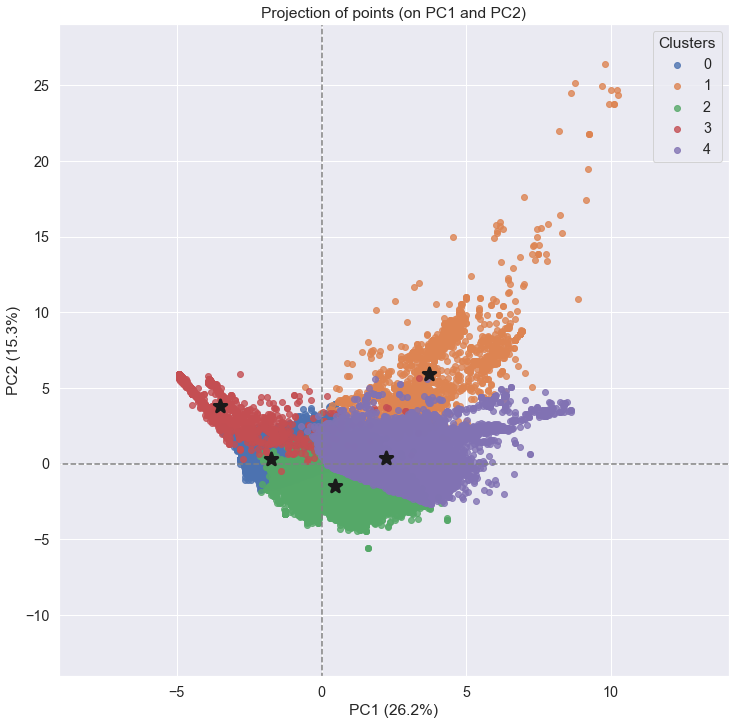

In [173]:
display_factorial_planes(X_reduced, 2, pcaP, [(0,1)], illustrative_var = clusters, alpha = 0.8)
plt.scatter(centres_reduced[:, 0], centres_reduced[:, 1],
            marker='*', s=169, linewidths=3,
            color='k', zorder=10)
plt.legend(title="Clusters")
plt.show()

The kmean clustering applied to the PCA results is casted onto the PC1 and PC2 vector space above. Each cluster is colour coded along with the black star as the cluster centroid. K means have helped us identify 5 groups of products with in the nutrients data. To determine what each cluster stand for, Parallel Coordinates Plot will explain what each centroid is made of which in turn tell us what each cluster are. We can conclude that the variance in cluster in orange, green and purple correlate can be be explained variance the most by PC1 which related strongly to fat, saturated fat, energy and nutrition score. 

### Plotting Clusters on Parallel Coordinates Plot

In [174]:
def display_parallel_coordinates_centroids(df, num_clusters):
    '''Display a parallel coordinates plot for the centroids in df'''

    # Create the plot
    fig = plt.figure(figsize=(20, 15))
    title = fig.suptitle("Parallel Coordinates plot for the Centroids", fontsize=18)
    fig.subplots_adjust(top=0.9, wspace=0)

    # Draw the chart
    parallel_coordinates(df, 'cluster', color=palette)

    # Stagger the axes
    ax=plt.gca()
    for tick in ax.xaxis.get_major_ticks()[1::2]:
        tick.set_pad(20)    

In [175]:
X_df = df_pca3.loc[:, features3]


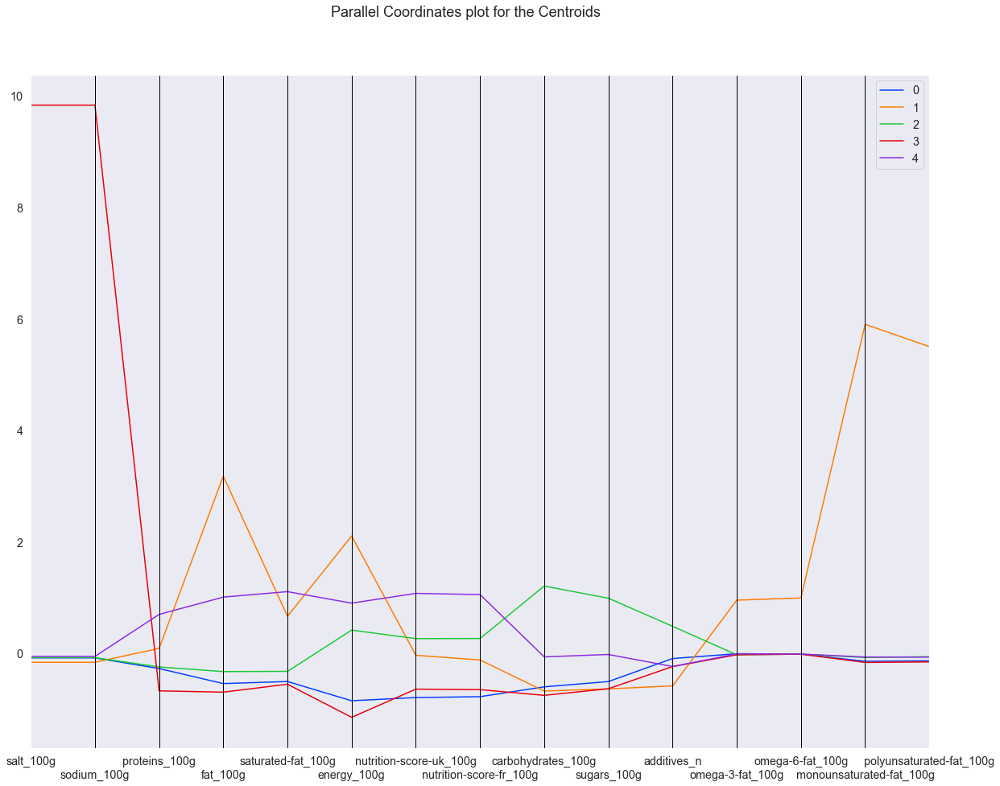

In [176]:
# Create a data frame containing our centroids
from pandas.plotting import parallel_coordinates
palette = sns.color_palette("bright", 10)

centroids = pd.DataFrame(kmeans.cluster_centers_, columns = X_df.columns)
centroids['cluster'] = centroids.index

display_parallel_coordinates_centroids(centroids, 5)

Each feature on the x axis is plotted with the scaled value against the identified clusters. Cluster 4 represents products with high salt contents and some unsaturated fats contents. Cluster 1 are products with a mix of protein, saturated fat and energy values. Cluster 2 represent products with carbohydrates and sugars, sugary foods. Cluster 3 contains products with high saturated and unsaturated fats and cluster 0 represents products that are unrelated to most of the nutrients. This could be the unknown food category. 

One can conclude the largest clusters are red and green which are product of high sugar and fat content respectively. That means citizens consume or are interested in nutrients data of sugary and fatty foods.


### Let's look at applying Kmeans clustering to see groups between fat and energy

In [177]:
#Start with the latest df with shortlisted features
df_imp = df_num2[list_imp_features]
df_i = pd.concat([df_imp, df_nutri[['pnns_groups_1']]], axis = 1)
df_i_num = df_imp

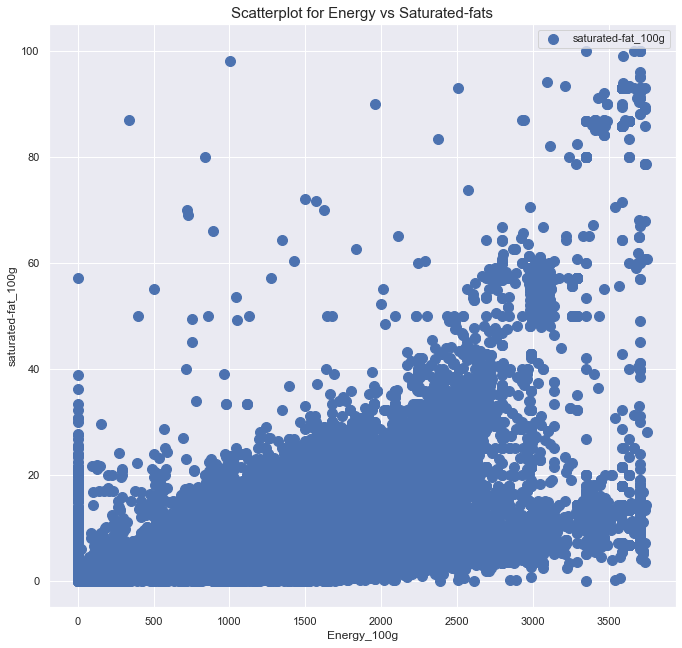

In [249]:
plt.figure(figsize=(10,10))
plt.scatter( x = "energy_100g", y = "saturated-fat_100g", data = df_i[df_i["saturated-fat_100g"]>0], s = 100)
plt.xlabel('Energy_100g')
plt.ylabel('saturated-fat_100g')
plt.legend()
plt.title('Scatterplot for Energy vs Saturated-fats', size = 15)
plt.show()

This is the normal scatteplot between fat and energy for comparison.

In [179]:
X2 = df_i_num[['energy_100g','saturated-fat_100g']].iloc[: , :].values

In [180]:
inertia = []
for n in range(1 , 8):
    algorithm = (KMeans(n_clusters = n ,init='k-means++', n_init = 10 ,max_iter=300) )
    algorithm.fit(X2)
    inertia.append(algorithm.inertia_)

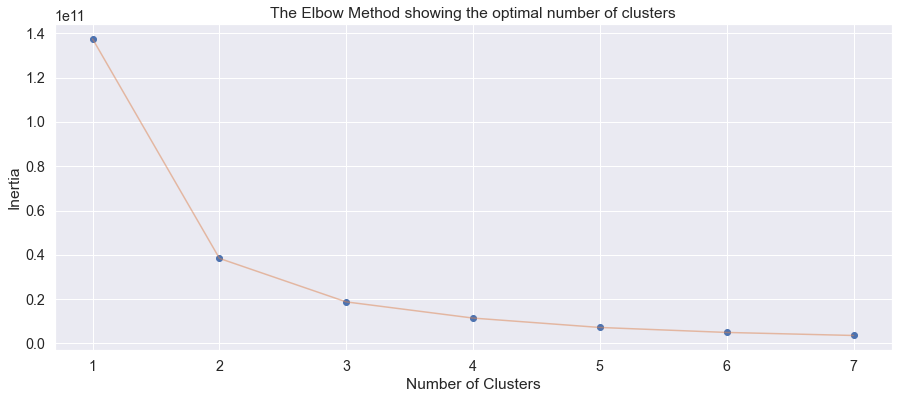

In [181]:
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(1 , 8) , inertia , 'o')
plt.plot(np.arange(1 , 8) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.title('The Elbow Method showing the optimal number of clusters')
plt.show()

In [182]:
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(X2)
y_kmeans 

array([3, 1, 3, ..., 0, 0, 3])

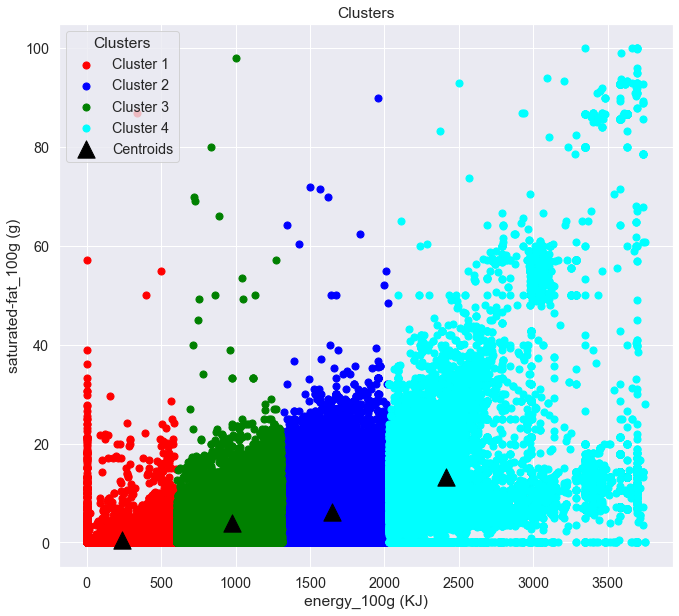

In [183]:
plt.scatter(X2[y_kmeans == 0, 0], X2[y_kmeans == 0, 1], s = 50, c = 'red', label = 'Cluster 1')
plt.scatter(X2[y_kmeans == 1, 0], X2[y_kmeans == 1, 1], s = 50, c = 'blue', label = 'Cluster 2')
plt.scatter(X2[y_kmeans == 2, 0], X2[y_kmeans == 2, 1], s = 50, c = 'green', label = 'Cluster 3')
plt.scatter(X2[y_kmeans == 3, 0], X2[y_kmeans == 3, 1], s = 50, c = 'cyan', label = 'Cluster 4')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 300, marker = '^', c = 'black', label = 'Centroids')
plt.title('Clusters')
plt.xlabel('energy_100g (KJ)')
plt.ylabel('saturated-fat_100g (g)')
plt.legend(title="Clusters")
plt.show()

Applying Kmeans clustering, the centriods of the clusters exhibits a poistive linear trend which indicates saturated fat increases as energy level increases. Each cluster represents a range of energy level and the largest cluster with the highest variance starts at 2500KJ level.

#### Kmeans Clustering with PCA results

In [184]:
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

In [185]:
label_encoder = LabelEncoder()
labels_1 = df_i['pnns_groups_1']

In [186]:
true_labels = label_encoder.fit_transform(labels_1)

In [253]:
#true_labels

In [251]:
#Create the labels to classify each data point by food group
#label_encoder.classes_

In [252]:
n_clusters = len(label_encoder.classes_)
#n_clusters

In [190]:
#Standardize the data via Scaler and apply PCA together using pipeline
from sklearn.pipeline import Pipeline
preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("pca", pcaP),
    ]
);

In [191]:
#Define the clusters using Kmeans
clusterer = Pipeline(
   [
       (
           "kmeans",
           KMeans(
               n_clusters=n_clusters,
               init="k-means++",
               n_init=10,
               max_iter=300,
               random_state=42,
           ),
       ),
   ]
);

In [192]:
pipe = Pipeline(
    [
        ("preprocessor", preprocessor),
        ("clusterer", clusterer)
    ]
);

In [254]:
#Fit the data to the pipeline
pipe.fit(df_i_num);

In [194]:
preprocessed_data = pipe["preprocessor"].transform(df_i_num)

In [195]:
#Apply the predicted labels to data for it to be color coded
predicted_labels = pipe["clusterer"]["kmeans"].labels_

In [196]:
#Create dataframe to store the PC1 and PC2 with the clusters
pcadf = pd.DataFrame(
    pipe["preprocessor"].transform(df_i_num),
    columns=["component_1", "component_2"],
)
#Create a columns each in the dataframe for cluster and food group label
pcadf["predicted_cluster"] = pipe["clusterer"]["kmeans"].labels_
pcadf["true_label"] = label_encoder.inverse_transform(true_labels)

C:\Users\b.wong\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



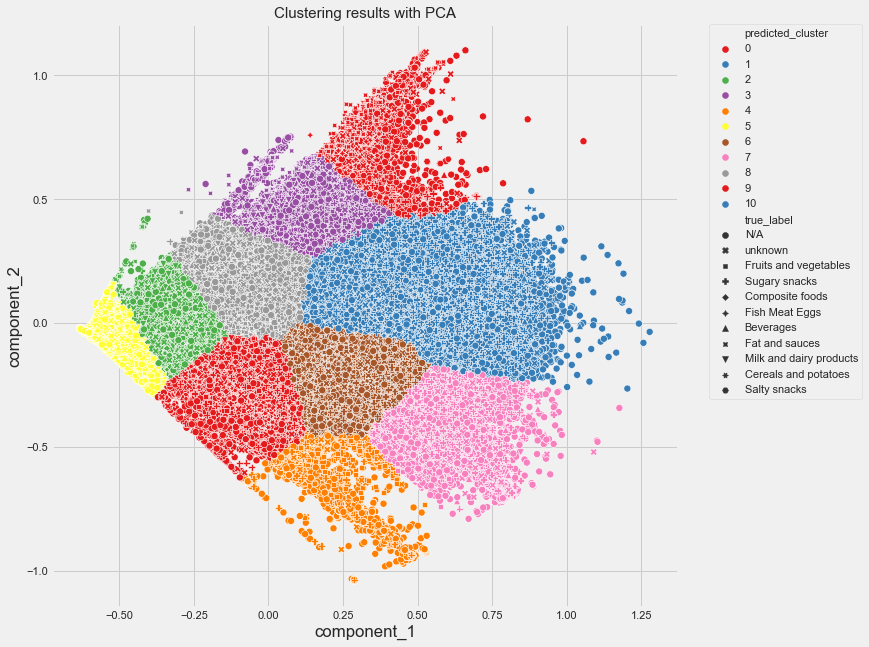

In [259]:
#Plot the Kmeans PCA results with the assigned labels on a scatterplot
plt.style.use("fivethirtyeight")
plt.figure(figsize=(10, 10))

scat = sns.scatterplot(
    "component_1",
    "component_2",
    s=50,
    data=pcadf,
    hue="predicted_cluster",
    style="true_label",
    palette="Set1",
)

scat.set_title("Clustering results with PCA", size =15)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

plt.show()

Eleven clusters were identified and each datapoint is represented with the true label of a food group on the plot. There was no distinct cluster of a particular food group in the cluster which means that the clusters do not identify with any particular food froup. By inspection, there are many N/A and unknown food groups in each cluster and more concentrated in cluster 0 (red) and 1 (blue). There are scattered away from its own cluster and are easily identified. One can conclude that cluster 1 (dark  blue) is the largest group relating strongly to the component 2.

### Exploratory analysis with ANOVA
We will investigate whether the sugar amount varies between food groups.
The null and alternate hypothesis that we will accept are either:

Null Hypothesis – There is no significant difference among the groups <br>
Alternate Hypothesis – There is a significant difference among the groups

Thre are certain assumptions before performing one way ANOVA:

1.The data is obtained independently and randomly from the population <br>
2.The data for each factor is normally distributed <br>
3.Independence of cases: the sample cases should be independent of each other <br>
4.Homogeneity of variance: Homogeneity means that the variance among the groups should be approximately equal

Create a box plot to see the sugar amount variance in each food group.

4239

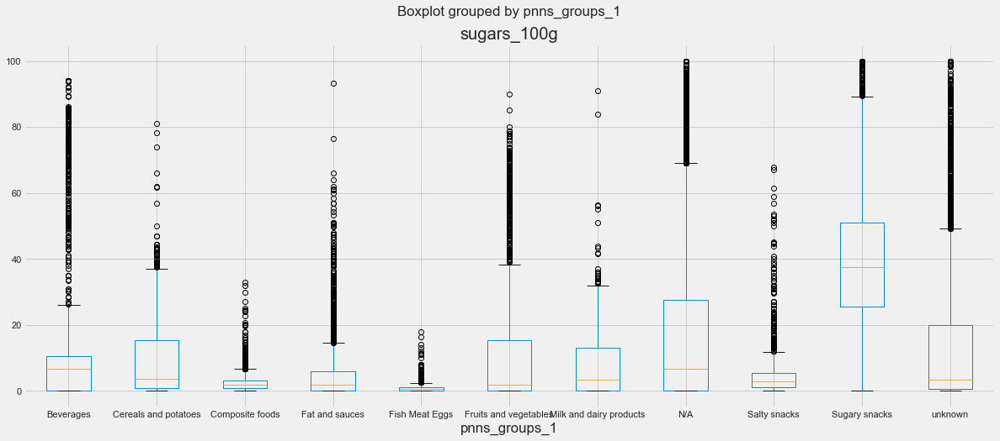

In [260]:
#Create a boxplot
df_i.boxplot('sugars_100g', by='pnns_groups_1', figsize=(20, 8))
grps = pd.unique(df_i.pnns_groups_1.values)
d_data = {grp:df_i['sugars_100g'][df_i.pnns_groups_1 == grp]
    for grp in pd.unique(df_i.pnns_groups_1.values)}

k = len(pd.unique(df_i.pnns_groups_1))  # number of conditions
N = len(df_i.pnns_groups_1)  # conditions times participants
n = df_i.groupby('pnns_groups_1').size()[0] #Participants in each condition
n

The above boxplot reveals the average sugar level varies in the food groups we invesigated, with Sugary snacks highest at 37g per 100g of food product and lowest is Fish meat Eggs food group at 0g of sugar. It appears that the sugar amount do vary between the food groups. One way ANOVA will help determine if this is true.

In [199]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

### One-Way ANOVA Test using OLS Model

In [200]:
results = ols('sugars_100g ~ pnns_groups_1', df_i).fit()

In [201]:
# Creates the ANOVA table
aov_table = sm.stats.anova_lm(results,typ=2)
print(aov_table)

                     sum_sq        df            F  PR(>F)
pnns_groups_1  8.852622e+06      10.0  2053.067758     0.0
Residual       9.071805e+07  210390.0          NaN     NaN


In [202]:
#See all results in the summary
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            sugars_100g   R-squared:                       0.089
Model:                            OLS   Adj. R-squared:                  0.089
Method:                 Least Squares   F-statistic:                     2053.
Date:                Thu, 30 Jun 2022   Prob (F-statistic):               0.00
Time:                        21:26:15   Log-Likelihood:            -9.3674e+05
No. Observations:              210401   AIC:                         1.874e+06
Df Residuals:                  210390   BIC:                         1.874e+06
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
Intercept                                   11.0480      0.319     34.640      0.000      10.423      11.673
pnns_groups_1[T.Cereals and potatoes]       -2.2481      0.461     -4.873      0.000      -3.152      -1.344
pnns_groups_1[T.Composite foods]            -8.6894      0.442    -19.653      0.000      -9.556      -7.823
pnns_groups_1[T.Fat and sauces]             -5.6476      0.464    -12.164      0.000      -6.558      -4.738
pnns_groups_1[T.Fish Meat Eggs]            -10.2294      0.430    -23.809      0.000     -11.072      -9.387
pnns_groups_1[T.Fruits and vegetables]       3.2022      0.589      5.435      0.000       2.047       4.357
pnns_groups_1[T.Milk and dairy products]    -4.1921      0.405    -10.346      0.000      -4.986      -3.398
pnns_groups_1[T.N/A]                         6.3764      0.323     19.728      0.000       5.743       7.010
pnns_groups_1[T.Salty snacks]               -6.5378      0.535    -12.217      0.000      -7.587      -5.489
pnns_groups_1[T.Sugary snacks]              26.7271      0.380     70.421      0.000      25.983      27.471
pnns_groups_1[T.unknown]                     2.3812      0.378      6.307      0.000       1.641       3.121
==============================================================================
Omnibus:                    56464.570   Durbin-Watson:                   0.821
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           126587.765
Skew:                           1.552   Prob(JB):                         0.00
Kurtosis:                       5.193   Cond. No.                         31.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [203]:
#Regression 
esq_sm = aov_table['sum_sq'][0]/(aov_table['sum_sq'][0] + aov_table['sum_sq'][1])

In [204]:
esq_sm

0.0889079219618697

A low R-squared of 0.089 in the summary table indicates that only 8.9% of the variance in Sugar level can be explained a linear relationship with each food group type. The sugar level is independent of food groups.

A low P value signifies that the average amount of sugardo in fact differ between food groups. The null hypothesis is rejected which indicates the differences between food groups are significant. This confirms our observation from the sugar-food group boxplots initially.

In [205]:
#print(df_i['pnns_groups_1'].unique())

['N/A' 'unknown' 'Fruits and vegetables' 'Sugary snacks' 'Composite foods'
 'Fish Meat Eggs' 'Beverages' 'Fat and sauces' 'Milk and dairy products'
 'Cereals and potatoes' 'Salty snacks']


In [206]:
# Checking with another one way ANOVA method for the same F and P value. 
#from scipy import stats
#F, p = stats.f_oneway(d_data['Salty snacks'], d_data['Cereals and potatoes'],d_data['Milk and dairy products'],d_data['Fat and sauces'],d_data['Beverages'],d_data['Fish Meat Eggs'],d_data['Composite foods'],d_data['Sugary snacks'],d_data['Fruits and vegetables'],d_data['unknown'],d_data['N/A'])
#F, p = stats.f_oneway(groups[0],groups[1],groups[2] ,groups[3],groups[4],groups[5],groups[6],groups[7],groups[8],groups[9],groups[10])
#F, p

(2053.067758182938, 0.0)

#### Check with Shapiro-Wilk statistical test if the data follows a normal distribution.

In [207]:
#Checking to see if sugar data is normally distributed to satisfy the ANOVA assumptions:
import scipy.stats as sst
from scipy.stats import shapiro

In [208]:
#grps

array(['N/A', 'unknown', 'Fruits and vegetables', 'Sugary snacks',
       'Composite foods', 'Fish Meat Eggs', 'Beverages', 'Fat and sauces',
       'Milk and dairy products', 'Cereals and potatoes', 'Salty snacks'],
      dtype=object)

In [209]:
df_i[['sugars_100g', 'pnns_groups_1']]

,sugars_100g,pnns_groups_1
1,14.29,N/A
2,17.86,N/A
3,3.57,N/A
4,0.00,N/A
5,11.54,N/A
...,...,...
320753,0.00,N/A
320761,0.00,N/A
320763,0.50,Beverages
320768,0.00,N/A


In [266]:
groups = []
for m in grps:
    groups.append(df_i[df_i['pnns_groups_1']==m]['sugars_100g'])

In [279]:
for u in groups:
    if sst.shapiro(u)[1]<0.05:
        rejecthop=False
        if rejecthop ==True:
            print(" Normality check with Shapiro test is satisfied")
        else:
            print("Normality check with Shapiro test is not satisfied")
            ##testing for homoskedasticity
        
print("Homoskedasticity check with Bartlett test: p="+ str(sst.bartlett(groups[0],groups[1],groups[2],groups[3],groups[4],groups[5],groups[6],groups[7],groups[8],groups[9],groups[10])[1]))

Normality check with Shapiro test is not satisfied
Normality check with Shapiro test is not satisfied
Normality check with Shapiro test is not satisfied
Normality check with Shapiro test is not satisfied
Normality check with Shapiro test is not satisfied
Normality check with Shapiro test is not satisfied
Normality check with Shapiro test is not satisfied
Normality check with Shapiro test is not satisfied
Normality check with Shapiro test is not satisfied
Normality check with Shapiro test is not satisfied
Normality check with Shapiro test is not satisfied
Homoskedasticity check with Bartlett test: p=0.0


Normality tests on each of the food groups shows that sugar data is not normally distributed. 
With the homogeneity of variance test by Barlett's equal to 0, the data also failed the test indicating the data variances are not the same across the food groups.

In [280]:
#from scipy.stats import levene
#stat, p = levene(groups[0],groups[1],groups[2] ,groups[3],groups[4],groups[5],groups[6],groups[7],groups[8],groups[9],groups[10])
#stat, p

#### Viotation of assumption of data normal distribution (#2) and equal variance within group (#4) limits the accuracy of the ANOVA results.

### <u>Summary from exploring the Open Food Fact Data</u>

- Many food entries are missing nutrients or category data which contributes to the lack of nutrition grade and evaluation. -- - More stringent entry requirements will improve the data quality and for analysis. Citizens need to ensure all nutrients are entered properly such as no negative numbers. 
- Detecting and Removal of entries with 'test' product name will filter out irrelevant data.
- Standardize an official language for the data will reduce the redundant column of information.
- Most nutrients data are rightly skewed with median near/at zero. Most nutrients are in low amounts in 100 grams of food. 
- Nutrition score and nutrition grades are strongly related. The higher the score, the less healthy nutrients the food posses. Most natural food groups such as fruits and vegetables and Fish meat eggs average score below 5 and A in nutrition grade. Sugary snacks and fats and sauces have average nutrition score above 13 and nutrition grade of D or E. 
- PCA was able to reduce the dataset from containing 31 columns of nutrients to 20 features to retain 85% of the originality of the data. 
- Using Variable vector map and the heatmap, pairs of features that exhibits strong relationship are identified: sugars and carbohydrate, polyunsaturated and monunsaturated fat, nutrition score uk and fr, salt and sodium, energy and fat. 
- With Kmeans clustering on PCA results, we were unable to clearly label clusters to food groups but rather see a random spread of the products. With the parallel coordindates, we were able identify salt, fat, saturated fat, energy, nutrition scores, sugars and carbohydrates and all of the unsaturated and omega fat species contribute separately to each cluster.  
- Most foods entered by citizens on the Open food fact contains fats, sugars, salt, unsaturated and omega fat species according to the kmeans clusters and its related nutrients.
- Statistical tests have shown that the sugar data violates normal distribution assumption and the homogenity of variance This in turn limits the accuracy of the rejection of null hypotheses by ANOVA test - the average of sugar amounts are the same between all food groups.